# Projekt końcowy Data Science

## Marek Grzesiak

![ml_map](https://creditkarmacdn-a.akamaihd.net/res/content/reviews/lending-club-personal-loans/title.png)
źródło: https://www.lendingclub.com

## Projekt końcowy - temat projektu

## Lending Club 
to firma pożyczkowa typu peer-to-peer, która łączy pożyczkobiorców z inwestorami za pośrednictwem platformy internetowej. Obsługuje osoby, które potrzebują pożyczek osobistych w wysokości od 1000 do 40 000 USD. Pożyczkobiorcy otrzymują pełną kwotę udzielonej pożyczki pomniejszoną o opłatę początkową, która jest uiszczana firmie. Inwestorzy kupują weksle zabezpieczone osobistymi pożyczkami i płacą Lending Club opłatę za usługę. Firma Lending Club udostępnia dane o wszystkich pożyczkach udzielonych za pośrednictwem swojej platformy w określonych okresach.
Na potrzeby tego projektu zostały użyte dane dotyczące pożyczek udzielonych za pośrednictwem Lending Club na przestrzeni lat 2007 -2011. Każda pożyczka jest opatrzona informacją o tym, czy ostatecznie została spłacona (Fully Paid lub Charged off w kolumnie loan_status). 

## Cel projektu
#### Polecenie
Twoim zadaniem jest zbudowanie modelu klasyfikacyjnego, który na podstawie tych danych będzie przewidywał z określoną dokładnością, czy potencjalny pożyczkobiorca spłaci swój dług z tytułu zaciągniętej pożyczki. Do zbioru danych dołączony jest plik z opisem wszystkich zmiennych oraz plik „FICO Score ranged.pdf”, w którym dokładnie opisano znaczenie jednej z kolumn.

## Poniżej zaprezentowane są poszczególne etapy analizy, których wykonanie jest konieczne do zaliczenia projektu oraz ich punktacja:
### 1. Obróbka danych (Data Processing) (70pkt) 
    Jako doświadczony Data Scientist zapewne znasz poszczególne kroki, które należy wykonać na tym etapie, więc nie będziemy ich tutaj wyszczególniać.
### 2. EDA, czyli obszerna eksploracja danych (100pkt) 
    Opisz wnioski płynące z każdego wykresu, swoje hipotezy poprzyj testami statystycznymi takimi jak np. t-test lub Chi-square. Dodatkowo odpowiedz na poniższe pytania:
        1. W jaki sposób wynik FICO wiąże się z prawdopodobieństwem spłacenia pożyczki przez pożyczkobiorcę?
        2. W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO
        3. W jaki sposób status kredytu hipotecznego na dom wiąże się z prawdopodobieństwem niewypłacalności?
        4. W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?
        5. W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?
        6. Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?
### 3. Feature Engineering (60 pkt)
    Utwórz 20 nowych zmiennych.
### 4. Modelowanie (150 pkt)
    1. Wykonaj klasteryzację danych (wypróbuj do tego celu kilka metod, min. 3) i sprawdź, czy występują jakieś segmenty pożyczkobiorców, wykorzystaj odpowiednie metody do określenia optymalnej liczby klastrów (40pkt)
    2. Wytrenuj 5 różnych modeli, wykorzystując do każdego inny algorytm, a następnie porównaj ich działanie, za metrykę oceny jakości modelu przyjmij AUROC score (50pkt)
    3. Sprawdź działanie wcześniej użytych metod na skompresowanych danych za pomocą PCA, porównaj wyniki (AUROC score) z modelami wytrenowanymi w poprzednim podpunkcie (20pkt)
    4. Zbuduj finalny model, którego AUROC score będzie >= 80%, pamiętaj o doborze istotnych zmiennych, kroswalidacji oraz dostrojeniu parametrów modelu, pomyśl również o zbalansowaniu klas (40pkt)

### Za całość do zdobycia jest 380 punktów. Do zaliczenia projektu potrzeba minimum 300 pkt.

# Importing packages / Import bibliotek

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import category_encoders as ce

import matplotlib.pyplot as plt

%matplotlib inline

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import ShuffleSplit
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

from sklearn.cluster import KMeans

from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve


from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram

from sklearn.decomposition import IncrementalPCA
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import fcluster

from scipy import stats

from scipy.stats import ttest_1samp
from scipy.stats import ttest_ind
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency

import xgboost as xgb
import pickle
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from numpy import where
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

## Część 1 - Obróbka danych / Data processing

- Poprawne wczytanie danych z pliku

- Usunięcie kolumn które zawierają informacje z przyszłości, niedostępne w momencie udzielania pożyczki

- Usunięcie kolumn ze zbędnymi informacjami

- Usunięcie kolumn z tylko jedną unikalną wartością

- Rzut okiem na wartości w kolumnie ze statusem pożyczki

- Przekształcenie wartości w kolumnach - usunięcie procentów, dodatkowych znaków, itd

- Analiza brakujących wartości wraz z ich uzupełnieniem/usunięciem przy wzięciu pod uwagę pewnych ustalonych kryteriów

## Poprawne wczytanie danych z pliku. Otwarcie i analiza obu plików .csv

### Pobranie danych z pliku LCDataDictionary.csv. 
#### Usuwam ostatnie dwa wiersze ``NaN``. Usuwam puste kolumn z pliku LCDataDictionary.csv.

In [2]:
# load our dataset
lc_dict = pd.read_csv("LCDataDictionary.csv")
lc_dict.drop(lc_dict.columns[2:], inplace = True, axis = 1)
lc_dict.drop(lc_dict.tail(2).index, inplace = True)
lc_dict

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...
...,...,...
146,settlement_status,The status of the borrower’s settlement plan. ...
147,settlement_date,The date that the borrower agrees to the settl...
148,settlement_amount,The loan amount that the borrower has agreed t...
149,settlement_percentage,The settlement amount as a percentage of the p...


#### Linki do opisu wszytskich kolumn

<a href="https://drive.google.com/file/d/1cRcV9wRv3eNLVVvog64mej3ObOZnSYhQ/view?usp=sharing">Link to LCDataDictionary_str1</a>

<a href="https://drive.google.com/file/d/1o-dyql5tUppNbB5FjoAEZ6yPRxlD6hMh/view?usp=sharing">Link to LCDataDictionary_str2</a>

<a href="https://drive.google.com/file/d/1mZOmi6P082b0a_2zuwPmqbLAw2gBAh1x/view?usp=sharing">Link to LCDataDictionary_str3</a>

### Dane zasadnicze (pobrane z pliku Loan_data.csv)
Rzut oka na 3 pierwsze wiersze

In [3]:
# load our dataset
data_loan = pd.read_csv("Loan_data.csv")
data_loan.head(3)

/home/marek/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (0,49) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,1077501,NaN,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,NaN,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,NaN,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


Rzut oka na wiersze w środku tabeli, można zauważyć, że wiersz 39786, jest pusty. Dlatego go usuwam

In [4]:
data_loan.iloc[39784:39789]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
39784,90376,NaN,5000.0,5000.0,650.000000,36 months,7.43%,155.38,A,A2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39785,87023,NaN,7500.0,7500.0,800.000000,36 months,13.75%,255.43,E,E2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39786,Loans that do not meet the credit policy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39787,642818,NaN,2950.0,2950.0,2950.000000,60 months,15.95%,71.66,E,E1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39788,641659,NaN,20000.0,20000.0,16466.109187,60 months,19.66%,526.11,G,G1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
data_loan.drop(index = 39786, axis = 0, inplace=True)

In [6]:
data_loan.iloc[39784:39789]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
39784,90376,NaN,5000.0,5000.0,650.000000,36 months,7.43%,155.38,A,A2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39785,87023,NaN,7500.0,7500.0,800.000000,36 months,13.75%,255.43,E,E2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39787,642818,NaN,2950.0,2950.0,2950.000000,60 months,15.95%,71.66,E,E1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39788,641659,NaN,20000.0,20000.0,16466.109187,60 months,19.66%,526.11,G,G1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
39789,641638,NaN,3500.0,3500.0,3500.000000,60 months,15.57%,84.32,D,D5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


Rzut oka na trzy ostatnie wiersze, porównanie liczby wierszy z wartością data_loan.info()

In [7]:
data_loan.tail(3)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
42533,72176,NaN,2525.0,2525.0,225.0,36 months,9.33%,80.69,B,B3,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
42534,71623,NaN,6500.0,6500.0,0.0,36 months,8.38%,204.84,A,A5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
42535,70686,NaN,5000.0,5000.0,0.0,36 months,7.75%,156.11,A,A3,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


Zwięzłe podsumowanie DataFrame - inf. o DataFrame, w tym indeksy dtype i kolumny, wartości inne niż null i użycie pamięci.

In [8]:
data_loan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42535 entries, 0 to 42535
Columns: 151 entries, id to settlement_term
dtypes: float64(120), object(31)
memory usage: 49.3+ MB


### Problem Charged Off

Charged OFF to odpis, jest to dług, na przykład na karcie kredytowej, którego odzyskanie przez kredytodawcę jest uważane za mało prawdopodobne, ponieważ po pewnym czasie pożyczkobiorca znacznie opóźnił spłatę należności. Jednak odpisanie nie oznacza całkowitego umorzenia długu. Spłata może oznaczać poważne konsekwencje dla historii kredytowej pożyczkobiorcy i przyszłej zdolności kredytowej.


#### Najważniejsze informacje

Odpis dotyczy długu, który według firmy nie będzie już ściągany, ponieważ pożyczkobiorca zalega z płatnościami.
Umorzenie długu nie oznacza, że konsument nie musi już go spłacać.
Po spłaceniu długu przez pożyczkodawcę może on sprzedać go zewnętrznej agencji windykacyjnej, która spróbuje pobrać go na koncie zaległych z płatnościami.
Konsument jest winien dług do czasu jego spłaty, uregulowania, umorzenia w postępowaniu upadłościowym lub w przypadku postępowania sądowego, przedawnienia.

#### Jak działa odpis?

Odpisanie ma miejsce zwykle wtedy, gdy wierzyciel uznał, że niespłacony dług jest nieściągalny; zwykle następuje to po 180 dniach lub sześciu miesiącach braku płatności. Ponadto spłaty zadłużenia, które spadną poniżej wymaganej minimalnej spłaty za dany okres, zostaną również odpisane, jeżeli dłużnik nie uzupełni niedoboru. Kredytodawca wykreśla dług konsumenta jako nieściągalny i zaznacza go w raporcie kredytowym konsumenta jako umorzenie.

Skutkiem odpisu w raporcie kredytowym jest spadek zdolności kredytowej i trudności w uzyskaniu zgody na kredyt lub uzyskanie kredytu po przyzwoitym oprocentowaniu w przyszłości.

Spłata lub uregulowanie zaległego zadłużenia nie spowoduje usunięcia statusu odpisu z raportu kredytowego konsumenta. Zamiast tego status zostanie zmieniony na „odpis opłacony” lub „odpis rozliczony”. Tak czy inaczej, odpisy pozostają w raporcie kredytowym przez siedem lat, a strona poszkodowana będzie musiała albo poczekać siedem lat, albo negocjować z wierzycielem w celu usunięcia go po spłacie całego długu. 

Zródło https://www.investopedia.com/terms/c/chargeoff.asp

### Charged Off podsumowanie
Mówiąc w skrócie Charged Off nie jest jednoznaczne ze spłatą zadłużenia. Jest to niewykonanie zobowiązania w terminie + jakiś termin (180 dni lub 6 miesięcy), co wiąże się z tym, że pożyczkobiorca ma status pożyczki Charged Off, nawet jak po terminie zostanie uregulowana. 

W danych jest kilkudziesięciu takich pożyczkobiorców, którzy ostatecznie spłacili pożyczkę, a mimo to mają ten status. Co pokazuję poniżej.

### TARGET loan_status
- Rzut okiem na wartości w kolumnie ze statusem pożyczki

In [9]:
data_loan['loan_status'].value_counts()

Fully Paid                                             34116
Charged Off                                             5670
Does not meet the credit policy. Status:Fully Paid      1988
Does not meet the credit policy. Status:Charged Off      761
Name: loan_status, dtype: int64

<AxesSubplot:xlabel='count', ylabel='loan_status'>

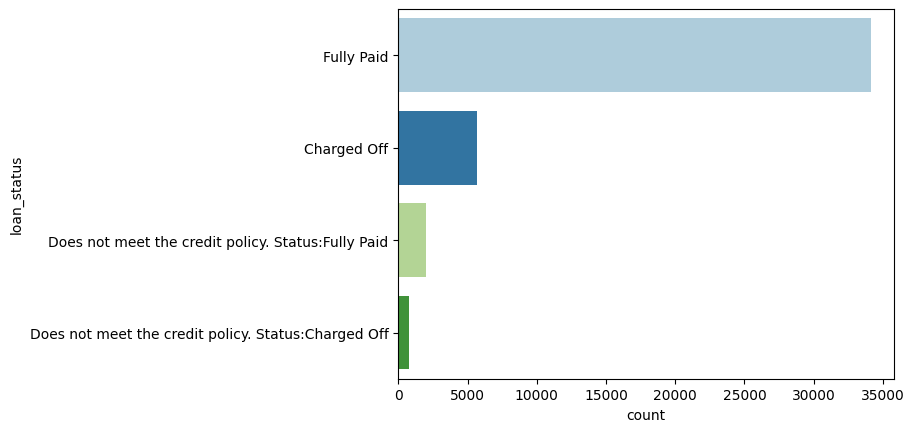

In [10]:
sns.countplot(y=data_loan['loan_status'], palette="Paired")

#### Po tym jak pożyczkobiorca nie spłacił z terminie kredytu, doszło w niektórych przypadkach do podpisania ugody. Tu mamy cechy: zakończona, przerwana i aktywna. 

In [11]:
data_loan['loan_status'] = data_loan['loan_status'].replace({'Does not meet the credit policy. Status:Charged Off':'Charged Off'})
data_loan['loan_status'] = data_loan['loan_status'].replace({'Does not meet the credit policy. Status:Fully Paid':'Fully Paid'})
data_loan['loan_status'].value_counts()

Fully Paid     36104
Charged Off     6431
Name: loan_status, dtype: int64

<AxesSubplot:xlabel='count', ylabel='settlement_status'>

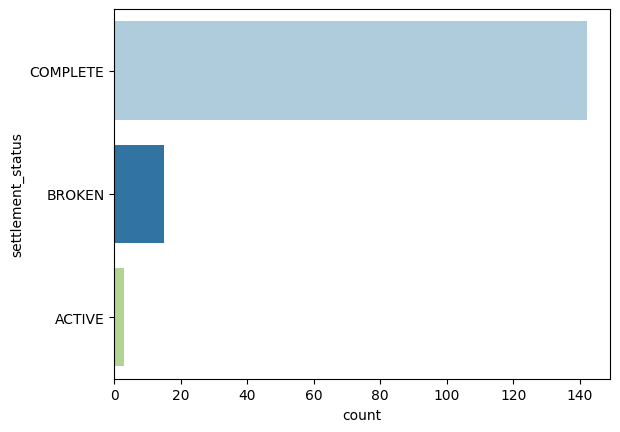

In [12]:
sns.countplot(y=data_loan['settlement_status'], palette="Paired")

#### Chcemy pokazać czy istnieją osoby, które mają utrzymany statut Charged Off mimo spłaty zadłużenia. 

In [13]:
data_loan[(data_loan.loan_status == 'Charged Off') & (data_loan.settlement_status == 'COMPLETE')][['loan_status','settlement_status']]

,loan_status,settlement_status
105,Charged Off,COMPLETE
188,Charged Off,COMPLETE
255,Charged Off,COMPLETE
362,Charged Off,COMPLETE
430,Charged Off,COMPLETE
...,...,...
41344,Charged Off,COMPLETE
41578,Charged Off,COMPLETE
41622,Charged Off,COMPLETE
41927,Charged Off,COMPLETE


#### Okazuje się, że w danych są 142 osoby, które mają status Charged Off i spłacone zobowiązanie. 

### Charged Off i Fully Paid

Na potrzeby tego projektu zakładam już do końca, że mamy dwa statusy kredytu:
- Fully Paid - spłata pożyczki
- Charged Off - brak spłaty pożyczki

Informacje o rzeczywistym statusie omówionym powyżej, o ugodach i zawiłościach tej procedury, pomijam w dalszej części mojej analizy. 

#### Wnioski:
Zmienna jest zdrowa. W późniejszej części połączę statusy w dwie kategorie i wykonam encoding, aby użyć ją do modelowania. 

### Uzupełnianie pustych wartości, usuwanie niepotrzebnych kolumn...
W następnych krokach analizuję wszystkie kolumny (cechy). Dla wygody podglądam je kawałkami tabeli. 

In [14]:
data_loan.iloc[:5,:11]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title
0,1077501,NaN,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,NaN
1,1077430,NaN,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,Ryder
2,1077175,NaN,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,NaN
3,1076863,NaN,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD
4,1075358,NaN,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group


In [15]:
data_loan.isna().sum()

id                           0
member_id                42535
loan_amnt                    0
funded_amnt                  0
funded_amnt_inv              0
                         ...  
settlement_status        42375
settlement_date          42375
settlement_amount        42375
settlement_percentage    42375
settlement_term          42375
Length: 151, dtype: int64

#### Usunięcie kolumn: id, member_id, 

In [16]:
data_loan.drop(['member_id', 'id'], axis=1, inplace=True)

Usunięcie brakujących wartości.

In [17]:
data_loan.dropna(axis=1, how='all', inplace=True)

In [18]:
data_loan.dropna(axis=0, how='all', inplace=True)

In [19]:
total = data_loan.isnull().sum().sort_values(ascending=False)
percent = (data_loan.isnull().sum()/data_loan.isnull().count()).sort_values(ascending=False)*100

missing_data = pd.concat([total, percent], axis=1, keys=["Total", "Percent %"])
missing_data.head(25)

,Total,Percent %
settlement_term,42375,99.623839
settlement_percentage,42375,99.623839
settlement_amount,42375,99.623839
settlement_date,42375,99.623839
settlement_status,42375,99.623839
debt_settlement_flag_date,42375,99.623839
next_pymnt_d,39786,93.537087
mths_since_last_record,38884,91.416481
mths_since_last_delinq,26926,63.303162
desc,13293,31.251910


Odsetek brakujących danych w niektórych kolumnach i liczba tych kolumn są tak duże, że trudno je wszystkie przeanalizować. Będzie trzeba usunąć pewien procent kolumn, gdzie nulli jest powyżej jakiegoś procentu. Na początek usuwam kolumny, gdzie danych brakujących jest powyżej 90%.

In [20]:
data_loan.drop(['settlement_term', 'settlement_percentage', 'settlement_amount','settlement_date', 'settlement_status', 
                'debt_settlement_flag_date', 'next_pymnt_d', 'mths_since_last_record' ], axis=1, inplace=True)

#### int_rate 
Przekształcenie wartości w kolumnach - usunięcie procentów

In [21]:
data_loan.int_rate = pd.Series(data_loan.int_rate).str.replace('%', '').astype(float)
data_loan.int_rate

0        10.65
1        15.27
2        15.96
3        13.49
4        12.69
         ...  
42531    10.28
42532     9.64
42533     9.33
42534     8.38
42535     7.75
Name: int_rate, Length: 42535, dtype: float64

#### Zmiennymi kategorycznymi: grade i sub_grade, home_ownership, verification_status oraz targetem loan_status:
- zajmę się w późniejszej części 

Wyświetlenie DF poprzez indeksowanie oparte wyłącznie na liczbach całkowitych do wyboru według pozycji.

In [22]:
data_loan.iloc[:5, 0:15]

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status
0,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-2011,Fully Paid
1,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,Charged Off
2,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,Fully Paid
3,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,Fully Paid
4,3000.0,3000.0,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-2011,Fully Paid


In [23]:
data_loan.isna().sum()

loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2626
emp_length                     1112
home_ownership                    0
annual_inc                        4
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          13293
purpose                           0
title                            13
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                      29
earliest_cr_line                 29
fico_range_low                    0
fico_range_high                   0
inq_last_6mths              

#### emp_title
Opisy zawodów mają 2626 wartości pustych, dodatkowo są tak zróżnicowane, to są opisy wpisywane przez pożyczkobiorców, także wszelkie relacje miedzy słowami czy frazami mogą dawać mylne wartości. Osoby mogły podawać swoje nazwy zawodów w sposób przekoloryzowany. Ta kolumna jest do usunięcia. 

In [24]:
data_loan.drop(['emp_title'], axis=1, inplace=True)

#### emp_length
Można zakładać, że ktoś kto nie ma wpisanej długości zatrudnienia, czy historii kredytowej jest młody, nie ma pracy, majątku, np. student, ale czy tak jest na pewno? 
Może 'purpose' pokaże czy to jest grupa studentów, czy niekoniecznie? Dla studenta pierwszym kredytem byłaby prawdopodobnie edukacja, np. kredyt na studia. 
W takiej sytuacji zmieniłbym nulle w tej zmiennej na 0 w przeciwym wypadku zamienię na modę (dominantę). Dominantą, w sensie szkolnym, nazywamy wartość występującą w danym zbiorze najczęściej.

In [25]:
data_loan.emp_length.isnull().sum()

1112

In [26]:
data_loan['emp_length'].value_counts()

10+ years    9369
< 1 year     5062
2 years      4743
3 years      4364
4 years      3649
1 year       3595
5 years      3458
6 years      2375
7 years      1875
8 years      1592
9 years      1341
Name: emp_length, dtype: int64

In [27]:
data_loan[data_loan.emp_length.isna()].purpose

168      debt_consolidation
323      debt_consolidation
394        home_improvement
422          major_purchase
439      debt_consolidation
                ...        
40583               medical
40667                 other
40672                 other
40697    debt_consolidation
40731           educational
Name: purpose, Length: 1112, dtype: object

#### Celem kredytu nie jest edukacja, czyli niekoniecznie jest to student dlatego uzupełniam puste wartości dominantą, aby zróźnicować dane:
- Zamieniam ``str`` na ``int``.

In [28]:
data_loan.replace('n/a', np.nan, inplace=True)
data_loan["emp_length"]= data_loan["emp_length"].fillna(data_loan["emp_length"].mode()[0])
data_loan['emp_length'].replace(to_replace='[^0-9]+', value='', inplace=True, regex=True)
data_loan['emp_length'] = data_loan['emp_length'].astype(int)

In [29]:
data_loan['emp_length'].value_counts()

10    10481
1      8657
2      4743
3      4364
4      3649
5      3458
6      2375
7      1875
8      1592
9      1341
Name: emp_length, dtype: int64

#### annual_inc

Mamy 4 pozycje, które nie są wypełnione wysokością dochodu rocznego, zakładam, że dochód w annual_inc w pustych wartościach wynika z tego, że jest pomyłkowo niewpisany, uzupełniam wartością najczęściej występującą, czyli dominantą

In [30]:
data_loan.annual_inc.isnull().sum()

4

<AxesSubplot:>

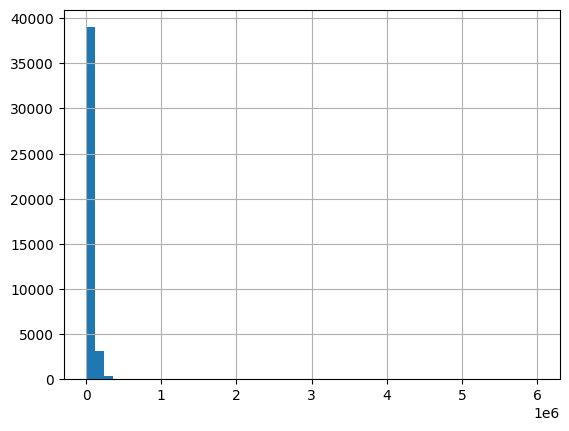

In [31]:
data_loan.annual_inc.hist(bins=50)

In [32]:
data_loan[data_loan.annual_inc.isna()].purpose

42450    other
42451    other
42481    other
42534    other
Name: purpose, dtype: object

In [33]:
data_loan.annual_inc.fillna(data_loan.annual_inc.mode()[0], inplace=True)
data_loan.annual_inc

0         24000.0
1         30000.0
2         12252.0
3         49200.0
4         80000.0
           ...   
42531    180000.0
42532     12000.0
42533    110000.0
42534     60000.0
42535     70000.0
Name: annual_inc, Length: 42535, dtype: float64

In [34]:
data_loan.iloc[:5, 13:23]

,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs
0,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0
1,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0
2,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0.0
3,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0
4,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0


#### pymnt_plan, url, desc
Zmienne url, desc są tekstowe, bardzo róznorodne, nie dające bezpośredniej relacji z targetem. Zmienna pymnt_plan ma wszystkie jednakowe == n (no). Dlatego je usuwam

In [35]:
data_loan[data_loan['pymnt_plan'] != 'n']

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag


In [36]:
# Drop unneccesary column
data_loan.drop(['pymnt_plan','url','desc', 'funded_amnt_inv'], axis=1, inplace=True)

#### purpose, title, zip_code

In [37]:
print (data_loan.purpose.value_counts())

debt_consolidation    19776
credit_card            5477
other                  4425
home_improvement       3199
major_purchase         2311
small_business         1992
car                    1615
wedding                1004
medical                 753
moving                  629
house                   426
educational             422
vacation                400
renewable_energy        106
Name: purpose, dtype: int64


In [38]:
print (data_loan.title.value_counts())

Debt Consolidation                  2259
Debt Consolidation Loan             1760
Personal Loan                        708
Consolidation                        547
debt consolidation                   532
                                    ... 
CitiCard PayOff                        1
Taxes Loan                             1
Blazing in 5 years                     1
I was scammed and now recovering       1
Aroundthehouse                         1
Name: title, Length: 21264, dtype: int64


Purpose jest prawdopodobnie wybierane z listy rozwijanej przy składaniu wniosku, natomiast title jest opisem wnioskodawcy i podobnie jak desc nie daje wiążących relacji, bo często jest to 'radosna twórczość' wnioskodawcy. Usuniecie kolumny 'title' zrobię później

In [39]:
# usuniecie kolumny 'title' zrobię później
data_loan.drop(['zip_code'], axis=1, inplace=True)

#### deling_2yrs

Jest grupa recordów (29 pozycji), które są puste w kilku poniższych kolumnach. 
Ten wskażnik (deling_2yrs) to liczba przypadków przeterminowania o ponad 30 dni wpisanych w aktach kredytowych pożyczkobiorcy z ostatnich 2 lat. Można domniemywać, że skoro w 29 przypadkach to pole jest puste, to wartość powinna być zero, tu ta najczęściej występująca. Tym bardziej, że może to być grupa osób, które w większości wcześniej nie miały historii kredytowej. Trzy z tych osób nie spłaciły kredytu. Jedna z nich brała pożyczkę w celu konsolidacji, czyli musiała mieć jakąś historię kredytową.

In [40]:
data_loan.delinq_2yrs.isnull().sum()

29

Najczęściej występujące wartości w danej kolumnie

In [41]:
data_loan.delinq_2yrs.value_counts()

0.0     37771
1.0      3595
2.0       771
3.0       244
4.0        72
5.0        27
6.0        13
7.0         6
8.0         3
11.0        2
9.0         1
13.0        1
Name: delinq_2yrs, dtype: int64

Rzut oka na daną kolumnę. sprawdzenie gdzie są puste wartości i sprawdzenie: 'purpose' i 'title' dla tej kolumny

In [42]:
data_loan[data_loan.delinq_2yrs.isnull()][['purpose', 'title']]

,purpose,title
42450,other,Moving expenses
42451,other,Education
42460,other,Paying medical bill
42473,other,Moving to Florida
42481,other,Moving expenses and security deposit
42484,other,New Bathroom
42495,other,Consolidate 2 high-interest rate loans
42510,debt_consolidation,Consolidate credit cards
42515,other,College Debt Consolidation
42516,other,Credit Card


Rzut oka na dane z pustymi wartościami dla kolumn: 'loan_status' i sprawdzenie czy zawiera ta kolumna wartość 'Charged Off'

In [43]:
df = data_loan[data_loan.delinq_2yrs.isnull()]['loan_status']
df.str.contains('Charged Off')

42450    False
42451    False
42460    False
42473    False
42481    False
42484    False
42495    False
42510    False
42515    False
42516    False
42517    False
42518    False
42519    False
42520    False
42521    False
42522     True
42523    False
42524    False
42525     True
42526    False
42527    False
42528    False
42529    False
42530     True
42531    False
42532    False
42533    False
42534    False
42535    False
Name: loan_status, dtype: bool

Rzut oka na dane z pustymi wartościami dla kolumn: 'purpose' i sprawdzenie czy ta kolumna równa się wartość 'debt_consolidation'

In [44]:
data_loan[data_loan.delinq_2yrs.isnull()].purpose == 'debt_consolidation'

42450    False
42451    False
42460    False
42473    False
42481    False
42484    False
42495    False
42510     True
42515    False
42516    False
42517    False
42518    False
42519    False
42520    False
42521    False
42522    False
42523    False
42524    False
42525    False
42526    False
42527    False
42528    False
42529    False
42530    False
42531    False
42532    False
42533    False
42534    False
42535    False
Name: purpose, dtype: bool

Uzupełnienie pustych warotści dominantą, czyli najczęściej występującą wartością w kolumnie

In [45]:
data_loan.delinq_2yrs.fillna(data_loan.delinq_2yrs.mode()[0], inplace=True)

#### earliest_cr_line, issue_d

Poniżej widać, że to są te same rekordy. To kolejna kolumna, która ma 29 nulli. Wśród nich trzy niespłacone kredyty. 3/29 to daje 1% niespłaconych. Ogólnie jest 42535 wszystkich pożyczek w tym 6431 niespłaconych, co daje podobny procent 0.015. 
Z jednej strony im dłużej spłacasz kredyty, tym jesteś wiarygodmiejszy. Ale im jesteś starszy, tym możesz szybciej stracić pracę lub być chory czy nawet umrzeć. Wzrasta prawdopodobieństwo Twojej niewypłacalności. Podobnie jak wyżej wydawałoby się, że to jest grupa młodych, studentów, bez kredytów i historii. Tymczasem są to ludzie, którzy mają hipoteki, biorą kredyt na nową łazienkę, wynajmują mieszkania, chcą skonsolidować kredyty. Uzupełnienie pustych wartości zrobię przez wartość mediany.

In [46]:
data_loan.groupby('loan_status')['loan_amnt'].count()

loan_status
Charged Off     6431
Fully Paid     36104
Name: loan_amnt, dtype: int64

In [47]:
data_loan.earliest_cr_line.isnull().sum()

29

In [48]:
data_loan[data_loan.earliest_cr_line.isnull()][['home_ownership', 'purpose', 'title']]

,home_ownership,purpose,title
42450,NONE,other,Moving expenses
42451,NONE,other,Education
42460,RENT,other,Paying medical bill
42473,RENT,other,Moving to Florida
42481,NONE,other,Moving expenses and security deposit
42484,MORTGAGE,other,New Bathroom
42495,RENT,other,Consolidate 2 high-interest rate loans
42510,MORTGAGE,debt_consolidation,Consolidate credit cards
42515,RENT,other,College Debt Consolidation
42516,RENT,other,Credit Card


In [49]:
data_loan[data_loan.earliest_cr_line.isna()].loan_status.value_counts()

Fully Paid     26
Charged Off     3
Name: loan_status, dtype: int64

Przekształcenie wartości (str na datę i godzinę) w kolumnach 'issue_d' i 'earliest_cr_line' - usunięcie procentów, dodatkowych znaków, itd

In [50]:
data_loan['earliest_cr_line'].sample(5)

29568    Aug-1996
22942    Oct-2006
2025     Aug-1995
993      Aug-2001
40348    Dec-1999
Name: earliest_cr_line, dtype: object

Konwertowanie argumentów na datę i godzinę.

In [51]:
# Convert to date time
data_loan['earliest_cr_line'] = pd.to_datetime(data_loan['earliest_cr_line'])
data_loan['earliest_cr_line'].value_counts(ascending=False).head()

1999-10-01    393
1998-11-01    390
2000-10-01    370
1998-12-01    366
1997-12-01    348
Name: earliest_cr_line, dtype: int64

Konwertowanie argumentów na datę i godzinę.

In [52]:
data_loan['issue_d'] = pd.to_datetime(data_loan['issue_d'])
data_loan['issue_d'].value_counts(ascending=False).head()

2011-12-01    2267
2011-11-01    2232
2011-10-01    2118
2011-09-01    2067
2011-08-01    1934
Name: issue_d, dtype: int64

In [53]:
data_loan['issue_d']= pd.to_datetime(data_loan['issue_d'])

Wypełniam wartości NA/NaN przy użyciu określonej metody ``fillna``. Puste wartości wypełniam metodą ``fillna`` wartościami z kolumny ``issue_d``.

In [54]:
data_loan['earliest_cr_line']= data_loan['earliest_cr_line'].fillna(data_loan['issue_d'])

In [55]:
data_loan.iloc[:5, 11:19]

,issue_d,loan_status,purpose,title,addr_state,dti,delinq_2yrs,earliest_cr_line
0,2011-12-01,Fully Paid,credit_card,Computer,AZ,27.65,0.0,1985-01-01
1,2011-12-01,Charged Off,car,bike,GA,1.00,0.0,1999-04-01
2,2011-12-01,Fully Paid,small_business,real estate business,IL,8.72,0.0,2001-11-01
3,2011-12-01,Fully Paid,other,personel,CA,20.00,0.0,1996-02-01
4,2011-12-01,Fully Paid,other,Personal,OR,17.94,0.0,1996-01-01


#### fico_range_low i fico_range_high

Oddzielne zakresy fico nie są przydatne, są skorelowane na 1, stworzyłem nową kolumnę ze średnią z fico i usuwam kolumny zakresów dolnego i górnego. 

In [56]:
data_loan[['fico_range_low', 'fico_range_high']].describe()

,fico_range_low,fico_range_high
count,42535.000000,42535.000000
mean,713.052545,717.052545
std,36.188439,36.188439
min,610.000000,614.000000
25%,685.000000,689.000000
50%,710.000000,714.000000
75%,740.000000,744.000000
max,825.000000,829.000000


In [57]:
data_loan[['fico_range_low','fico_range_high']].corr()

,fico_range_low,fico_range_high
fico_range_low,1.0,1.0
fico_range_high,1.0,1.0


In [58]:
data_loan['fico_mean'] = (data_loan.fico_range_low + data_loan.fico_range_high)/2

In [59]:
data_loan.drop(['fico_range_low','fico_range_high'],1, inplace=True)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


#### inq_last_6mths
Ta sama grupa 29 rekordów, o których jednoznacznie nie można powiedzieć, czy mają dochody, czy mieli wcześniej kredyty, czy zwlekali z płaceniem rat. Uzupełniam jak poprzednio mode. Ten wskaźnik to liczba zapytań.

In [60]:
data_loan.inq_last_6mths.isnull().sum()

29

In [61]:
data_loan['inq_last_6mths'].value_counts()

0.0     19657
1.0     11247
2.0      5987
3.0      3182
4.0      1056
5.0       596
6.0       339
7.0       182
8.0       115
9.0        50
10.0       24
11.0       15
12.0       15
15.0        9
13.0        6
14.0        6
18.0        4
16.0        3
17.0        2
24.0        2
19.0        2
32.0        1
33.0        1
31.0        1
28.0        1
25.0        1
27.0        1
20.0        1
Name: inq_last_6mths, dtype: int64

In [62]:
data_loan['inq_last_6mths'].median()

1.0

In [63]:
data_loan['inq_last_6mths'].mode()[0]

0.0

In [64]:
data_loan['inq_last_6mths'].mean()

1.0814237989930833

In [65]:
data_loan['inq_last_6mths'] = data_loan['inq_last_6mths'].fillna(data_loan['inq_last_6mths'].mode()[0])

#### mths_since_last_delinq

Wskaźnik, który mówi o liczbie m-cy od ostatniej zaległości. Wartości brakujących jest ponad 26 tys, czyli ponad połowa 63%. Uzupełniam medianą - wartością środkową. Tymczasem zostawiam tę kolumnę, ale liczba pustych wartości wskazuje na jej usunięcie. 

In [66]:
data_loan.mths_since_last_delinq.isnull().sum()

26926

In [67]:
data_loan['mths_since_last_delinq'].value_counts()

0.0      821
30.0     270
19.0     266
23.0     266
15.0     263
        ... 
89.0       1
107.0      1
85.0       1
97.0       1
95.0       1
Name: mths_since_last_delinq, Length: 95, dtype: int64

In [68]:
data_loan['mths_since_last_delinq'].unique()

array([ nan,  35.,  38.,  61.,   8.,  20.,  18.,  68.,  45.,  48.,  41.,
        40.,  74.,  25.,  53.,  39.,  10.,  26.,  56.,  77.,  28.,  52.,
        24.,  16.,  60.,  54.,  23.,   9.,  11.,  13.,  65.,  19.,  80.,
        22.,  59.,  79.,  44.,  64.,  57.,  14.,  63.,  49.,  15.,  73.,
        70.,  29.,  51.,   5.,  75.,  55.,   2.,  30.,  47.,  33.,  69.,
         4.,  43.,  21.,  27.,  46.,  81.,  78.,  82.,  31.,  76.,  62.,
        72.,  42.,  50.,   3.,  12.,  67.,  36.,  34.,  58.,  17.,  71.,
        66.,  32.,   6.,  37.,   7.,   1.,  83.,  86., 115.,  96., 103.,
       120., 106.,  89., 107.,  85.,  97.,  95.,   0.])

In [69]:
data_loan['mths_since_last_delinq'].median()

33.0

In [70]:
data_loan['mths_since_last_delinq'].mode()[0]

0.0

In [71]:
data_loan['mths_since_last_delinq'] = data_loan['mths_since_last_delinq'].fillna(data_loan['mths_since_last_delinq'].median())

#### open_acc
Ta sama grupa 29 rekordow, tu liczba otwartych lini (rachunków) kredytowych. Podobnie jak wcześniej, można przypuszczać, że ich nie ma, czyli powinienem uzupełnić zerami, ale jednak są wśród klienci, którzy konsolidują kredyty. Czyli musieli mieć otwarte inne rachunki kredytowe.  

In [72]:
data_loan.open_acc.isnull().sum()

29

In [73]:
data_loan['open_acc'].mode()[0]

7.0

In [74]:
data_loan['open_acc'].median()

9.0

In [75]:
data_loan['open_acc'].mean()

9.343951442149343

In [76]:
data_loan['open_acc'].value_counts()

7.0     4252
8.0     4176
6.0     4172
9.0     3922
10.0    3386
5.0     3368
11.0    2944
4.0     2508
12.0    2398
13.0    2060
3.0     1608
14.0    1597
15.0    1290
16.0    1022
17.0     812
2.0      692
18.0     588
19.0     442
20.0     335
21.0     276
22.0     170
23.0     121
24.0      87
25.0      63
26.0      40
1.0       39
27.0      29
28.0      29
30.0      17
29.0      16
31.0      13
34.0       8
32.0       6
33.0       5
35.0       4
36.0       2
38.0       2
37.0       1
46.0       1
39.0       1
42.0       1
41.0       1
44.0       1
47.0       1
Name: open_acc, dtype: int64

In [77]:
data_loan['open_acc']= data_loan['open_acc'].fillna(data_loan['open_acc'].mode()[0])

#### pub_rec

Ta sama grupa rekordów. 29 pustych. Ta cecha mówi o liczbie rejestrów, gdzie zostali wpisani klienci nierzetelni. Podobnie uzupełniam modą.

In [78]:
data_loan['pub_rec'].isnull().sum()

29

In [79]:
data_loan['pub_rec'].median()

0.0

In [80]:
data_loan['pub_rec'].mode()[0]

0.0

In [81]:
data_loan['pub_rec']= data_loan['pub_rec'].fillna(data_loan['pub_rec'].mode()[0])

#### revol_util / Przekształcenie wartości w kolumnach - usunięcie procentów, dodatkowych znaków, itd
Stopa procentowa wykorzystania lini kredytowej. Im mniej wykorzystane tym mniejsza kwota do spłaty, zatem pewnie im mniejsza tendencja do niespłacania. To jest wartość numeryczna, do uzupełnienia nulli wykorzystam medianę. 

In [82]:
data_loan.revol_util.isnull().sum()

90

In [83]:
data_loan.revol_util = pd.Series(data_loan.revol_util).str.replace('%', '').astype(float)

In [84]:
data_loan['revol_util'].value_counts(ascending=False)

0.00      1070
40.70       65
0.20        64
63.00       63
66.60       62
          ... 
21.59        1
39.95        1
0.01         1
17.67        1
105.70       1
Name: revol_util, Length: 1119, dtype: int64

In [85]:
data_loan['revol_util']= data_loan['revol_util'].fillna(data_loan['revol_util'].median())

In [86]:
data_loan.iloc[:5, 24:34]

,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee
0,83.7,9.0,f,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.00
1,9.4,4.0,f,0.0,0.0,1014.530000,1014.53,456.46,435.17,0.00
2,98.5,10.0,f,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.00
3,21.0,37.0,f,0.0,0.0,12231.890000,12231.89,10000.00,2214.92,16.97
4,53.9,38.0,f,0.0,0.0,4066.908161,4066.91,3000.00,1066.91,0.00


#### total_acc
Całkowita liczba lini kredytowych. Znów z grupy tych 29 recordów, uzupełniam medianą.

In [87]:
data_loan['total_acc'].isnull().sum()

29

In [88]:
data_loan['total_acc']= data_loan['total_acc'].fillna(data_loan['total_acc'].median())

#### Usuwanie innych kolumn / Usunięcie kolumn tylko jedną unikalną wartością
Cechy, które mają jednakowe wartości lub nie mają lub mają mały wpływ na pożyczkobiorcę, czy spłaci czy nie kredyt. 
initial_list_status - same 'f'; out_prncp - same zera; out_prncp_inv - same zera; total_pymnt, total_pymnt_inv, total_rec_prncp i total_rec_int, recoveries, collection_recovery_fee, collection_recovery_fee. I title. funded_amnt_inv dotyczy sfinansowania kredytu przez inwestorów. Część z tych kolumn ma pojedyncze jednakowe wartości collections_12_mths_ex_med - 0 

In [89]:
data_loan.drop(['initial_list_status', 'total_pymnt_inv', 'out_prncp', 'out_prncp_inv', 'title'], 1, inplace=True)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


Nad tymi pozycjami się zastanawiam czy je badać, hipotetycznie można uważać, że jak ktoś już ma spłaconą
prawie całą pożyczkę, to ma większą chęć już domknąć ten temat i spłacić całość. Czyli można znaleźć kontekst. 
Tymczasem je usuwam. 

In [90]:
data_loan.drop([ 'total_pymnt', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', ], 1, inplace=True)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


In [91]:
data_loan.iloc[:5, 37:44]

,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,fico_mean
0,0.0,0.0,N,Cash,N,737.0
1,0.0,0.0,N,Cash,N,742.0
2,0.0,0.0,N,Cash,N,737.0
3,0.0,0.0,N,Cash,N,692.0
4,0.0,0.0,N,Cash,N,697.0


In [92]:
data_loan['collections_12_mths_ex_med'].value_counts()

0.0    42390
Name: collections_12_mths_ex_med, dtype: int64

In [93]:
data_loan.drop(['collection_recovery_fee', 'last_pymnt_d','last_pymnt_amnt', 'last_credit_pull_d', 
                'collections_12_mths_ex_med'], 1, inplace=True)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


#### last fico_range_low i last fico_range_high
Oddzielne zakresy last_fico nie są przydatne, stworzyłem nową kolumnę ze średnią z last_fico i usuwam kolumny zakresów dolnego i górnego. Nie mam wiedzy, kiedy zostają wyliczane te last_fico, bo jeśli po spłacie kredytu, to nie mają wpływu na nasz target i można je usunąć. Dziwne jest to, że minimalna wartość obu zakresów to 0, czyli są wartości wpisane jako 0.   

In [94]:
data_loan[['last_fico_range_high','last_fico_range_low' ]].describe()

,last_fico_range_high,last_fico_range_low
count,42535.000000,42535.000000
mean,689.922511,676.952039
std,80.818099,119.647752
min,0.000000,0.000000
25%,644.000000,640.000000
50%,699.000000,695.000000
75%,749.000000,745.000000
max,850.000000,845.000000


In [95]:
data_loan[['last_fico_range_high','last_fico_range_low' ]].corr()

,last_fico_range_high,last_fico_range_low
last_fico_range_high,1.000000,0.852463
last_fico_range_low,0.852463,1.000000


In [96]:
data_loan['last_fico_mean'] = (data_loan.last_fico_range_low + data_loan.last_fico_range_high)/2

In [97]:
data_loan.drop(['last_fico_range_low','last_fico_range_high'],1, inplace=True)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


#### Usunięcie kolumn ze zbędnymi informacjami
#### acc_now_delinq, chargeoff_within_12_mths, delinq_amnt, tax_liens
To jest Liczba rachunków, wartość odpisów bankowych, wartość zadłużenia, liczba zestawów podatkowych, to są wartości, które nie mają wpływu na pożyczkobiorcę i jego wolę spłacania lub nie.  
policy_cod - 1, application_type - individual

In [98]:
data_loan['policy_code'].value_counts()

1.0    42535
Name: policy_code, dtype: int64

In [99]:
data_loan['application_type'].value_counts()

Individual    42535
Name: application_type, dtype: int64

In [100]:
data_loan['tax_liens'].value_counts()

0.0    42429
1.0        1
Name: tax_liens, dtype: int64

In [101]:
data_loan['disbursement_method'].value_counts()

Cash    42535
Name: disbursement_method, dtype: int64

In [102]:
data_loan['acc_now_delinq'].value_counts()

0.0    42502
1.0        4
Name: acc_now_delinq, dtype: int64

In [103]:
data_loan['chargeoff_within_12_mths'].value_counts()

0.0    42390
Name: chargeoff_within_12_mths, dtype: int64

In [104]:
data_loan['delinq_amnt'].value_counts()

0.0       42504
27.0          1
6053.0        1
Name: delinq_amnt, dtype: int64

#### debt_settlement_flag
To jest oznaczenie, czy pożyczkobiorca współpracuje czy nie z firmą windykacyjną, czy jest ugoda

In [105]:
data_loan['debt_settlement_flag'].value_counts()

N    42375
Y      160
Name: debt_settlement_flag, dtype: int64

In [106]:
data_loan['hardship_flag'].value_counts()

N    42535
Name: hardship_flag, dtype: int64

In [107]:
data_loan.drop(['policy_code', 'application_type','acc_now_delinq','chargeoff_within_12_mths',
                'delinq_amnt','tax_liens','disbursement_method','debt_settlement_flag','hardship_flag'],1, inplace=True)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


#### pub_rec_bankruptcies
liczba upadłości rejestrowych. Uzupełniam modą

In [108]:
data_loan['pub_rec_bankruptcies'].value_counts().sort_index()

0.0    39316
1.0     1846
2.0        8
Name: pub_rec_bankruptcies, dtype: int64

In [109]:
data_loan['pub_rec_bankruptcies'].median()

0.0

Wypełnij wartości ``NA/NaN`` przy użyciu określonej metody w tym przypadku dominantą

In [110]:
data_loan['pub_rec_bankruptcies']= data_loan['pub_rec_bankruptcies'].fillna(data_loan['pub_rec_bankruptcies'].mode()[0])

#### Sprawdzenie całości:
- Zwięzłe podsumowanie DF, sprawdzam typ danych i kształt każdej kolumny

In [111]:
## Check data type and shape of every column 
data_loan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42535 entries, 0 to 42535
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   loan_amnt               42535 non-null  float64       
 1   funded_amnt             42535 non-null  float64       
 2   term                    42535 non-null  object        
 3   int_rate                42535 non-null  float64       
 4   installment             42535 non-null  float64       
 5   grade                   42535 non-null  object        
 6   sub_grade               42535 non-null  object        
 7   emp_length              42535 non-null  int64         
 8   home_ownership          42535 non-null  object        
 9   annual_inc              42535 non-null  float64       
 10  verification_status     42535 non-null  object        
 11  issue_d                 42535 non-null  datetime64[ns]
 12  loan_status             42535 non-null  object

#### Wnioski:
- Wykonano obróbkę danych. 
- Przeprowadzono wczytanie danych z pliku. 
- Usunięto kolumny, które zawierały informacje z przyszłości, niedostępne w momencie udzielania pożyczki. 
- Usunięto kolumny ze zbędnymi informacjami. 
- Usunięcie kolum z tylko jedną unikalną wartością. 
- Wykonano rzuk oka na wartości w kolumnie ze statusem pożyczki. 
- Przekształcono wartości w kolumnach - usunięcie procentów, dodatkowych znaków, itd. 
- Przeprowadzono analizę brakujących wartości wraz z ich uzupełnieniem/usunięciem przy wzięciu pod uwagę pewnych ustalonych kryteriów

To co wychodzi z pierwszej części, tj. oczyszczony zbiór. Ze 150 kolmn mam 28 kolumn wyczyszczonych i na tym przeprowadzam dalszą analizę EDA

# 2. EDA eksploracja danych 
<b>EDA</b>, czyli obszerna eksploracja danych <b>(100pkt)</b> Opisz wnioski płynące z każdego wykresu, swoje hipotezy poprzyj testami statystycznymi takimi jak np. t-test lub Chi-square. Dodatkowo odpowiedz na poniższe pytania:
1. W jaki sposób wynik FICO wiąże się z prawdopodobieństwem spłacenia pożyczki przez pożyczkobiorcę?
2. W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO
3. W jaki sposób status kredytu hipotecznego na dom wiąże się z prawdopodobieństwem niewypłacalności?
4. W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?
5. W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?
6. Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?

1. Wysokopoziomowa analiza cech - ogólny rzut okiem który pozwoli lepiej zrozumieć dane
2. Sprawdzenie korelacji zmiennych (z targetem/między sobą) - choć korelacja bada liniową zależność, a ta może przybierać wiele form to wygenerowanie mapki korelacji może podsunąć kolumny którym warto się przyglądnąć
3. Odpowiedź na 6 pytań z treści projektu:
    - dobrze dobrana wizualizacja
    - opisanie własnych obserwacji
    - poparcie testem statystycznym (opcjonalnie)
4. Dalsza, autorska eksploracja - rozbudowanie części projektu o Wasze pomysły, hipotezy i odkryte wcześniej rzeczy

## EDA

Podzielenie DF na dobry i zły stan pożczyczki

Fully Paid     36104
Charged Off     6431
Name: loan_status, dtype: int64


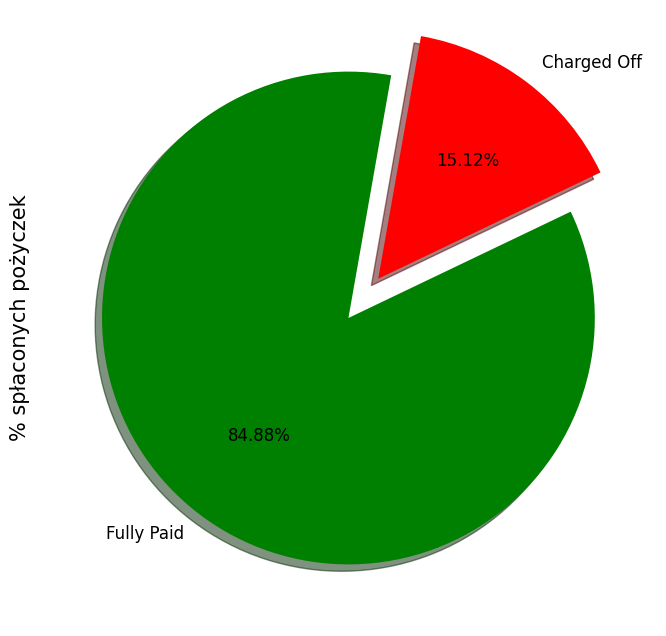

In [112]:
print(data_loan["loan_status"].value_counts())

# Slice data frame into good and bad loan status
df_good = data_loan.loc[(data_loan.loan_status == 0), :]
df_bad  = data_loan.loc[(data_loan.loan_status == 1), :]

plt.figure(figsize=(16, 8))
colors = ["g", "r"]
labels = "Fully Paid", "Charged Off"
data_loan["loan_status"].value_counts().plot.pie(explode=[0,0.2], autopct='%1.2f%%', 
                                                 shadow=True, colors=colors, labels=labels, 
                                                 fontsize=12, startangle=80)
plt.ylabel('% spłaconych pożyczek', fontsize=15)
plt.show()

### Wniosek:
Na podstawie przedstawionego wykresu widać, że mamy 15 % niespłaconych pożyczek, a prawie 85 % spłaconych, co oznacza, że prawie 6 razy więcej osób spłacało pożyczki zgodnie z zasadami Lending Page. 

### FICO Rating

Jest pięć grup sccoring-owych FICO. Poor: < 580, Fair 580-669, Good 670-739, Very Good 740-799 i Exceptional >= 800. Będę przedstawiać zależności czynników versus FICO sccoring.  

In [113]:
data_loan.fico_mean.head()

0    737.0
1    742.0
2    737.0
3    692.0
4    697.0
Name: fico_mean, dtype: float64

![ml_map](https://lessdebt.com/wp-content/uploads/2017/12/FICO-Credit-Score-Ranges.png)

<b>Exceptional</b> / <b>Wyjątkowy</b>
- Well above the average score of U.S. consumers / - Znacznie powyżej średniego wyniku konsumentów w USA
- Demonstrates to lenders you are an exceptional borrower / - Pokazuje pożyczkodawcom, że jesteś wyjątkowym pożyczkobiorcą

<b>Very Good</b> / <b>Bardzo dobry</b>
- Above the average od U.S. consumers / - Powyżej średniej konsumentów w USA
- Demonstrates to lenders you are a very dependable borrower / - Pokazuje pożyczkodawcom, że jesteś bardzo niezawodnym pożyczkobiorcą

<b>Good</b> / <b>Dobrze</b>
- Near or slightly above the average od U.S. consumners / - Prawie lub nieco powyżej średniej konsumentów w USA
- Most lenders consider this a good score / - Większość pożyczkodawców uważa to za dobry wynik

<b>Fair</b> / <b>Sprawiedliwy</b>
- Belowe tha average score of U.S. consumers / - Poniżej średniego wyniku konsumentów w USA
- Thougth many lenders will approve loans with this score / - Chociaż wielu pożyczkodawców zatwierdzi pożyczki z tym wynikiem

<b>Poor</b> / <b>Słaby</b>
- Well below the average score of U.S. consumers / - Znacznie poniżej średniego wyniku konsumentów w USA
- Demonstrates to lenders that you are a risky borrower / - Pokazuje pożyczkodawcom, że jesteś ryzykownym pożyczkobiorcą

In [114]:
def fico_rating (row):
    if row['fico_mean'] < 580:
        return 'Poor'
    if row['fico_mean'] < 670:
        return 'Fair'
    if row['fico_mean'] < 740:
        return 'Good'
    if row['fico_mean'] < 800:
        return 'Very Good'
    if row['fico_mean']  >= 800:
       return 'Exceptional'
    return 'Other'
data_loan['fico_rating'] = data_loan.apply (lambda row: fico_rating(row), axis=1)
data_loan[['loan_amnt','emp_length','annual_inc','fico_mean','int_rate', 'fico_rating']]

,loan_amnt,emp_length,annual_inc,fico_mean,int_rate,fico_rating
0,5000.0,10,24000.0,737.0,10.65,Good
1,2500.0,1,30000.0,742.0,15.27,Very Good
2,2400.0,10,12252.0,737.0,15.96,Good
3,10000.0,10,49200.0,692.0,13.49,Good
4,3000.0,1,80000.0,697.0,12.69,Good
...,...,...,...,...,...,...
42531,3500.0,1,180000.0,687.0,10.28,Good
42532,1000.0,1,12000.0,697.0,9.64,Good
42533,2525.0,1,110000.0,712.0,9.33,Good
42534,6500.0,1,60000.0,742.0,8.38,Very Good


### Pytanie 1. (FICO vs loan_status)
1. W jaki sposób wynik FICO wiąże się z prawdopodobieństwem spłacenia pożyczki przez pożyczkobiorcę?

#### Obliczam prostą tabelę krzyżową dwóch (lub więcej) czynników. Domyślnie obliczam tabelę częstości współczynników.

In [115]:
ficoloan = ['loan_status', 'fico_rating']
cm = sns.light_palette("orange", as_cmap=True)
round(pd.crosstab(data_loan[ficoloan[0]], data_loan[ficoloan[1]], 
            normalize='index'),2).fillna(0).style.background_gradient(cmap = cm)

fico_rating,Exceptional,Fair,Good,Very Good
loan_status,,,,
Charged Off,0.010000,0.150000,0.710000,0.140000
Fully Paid,0.020000,0.080000,0.650000,0.260000


Text(0.5, 1.0, 'Zależność spłacalności pożyczki versus FICO')

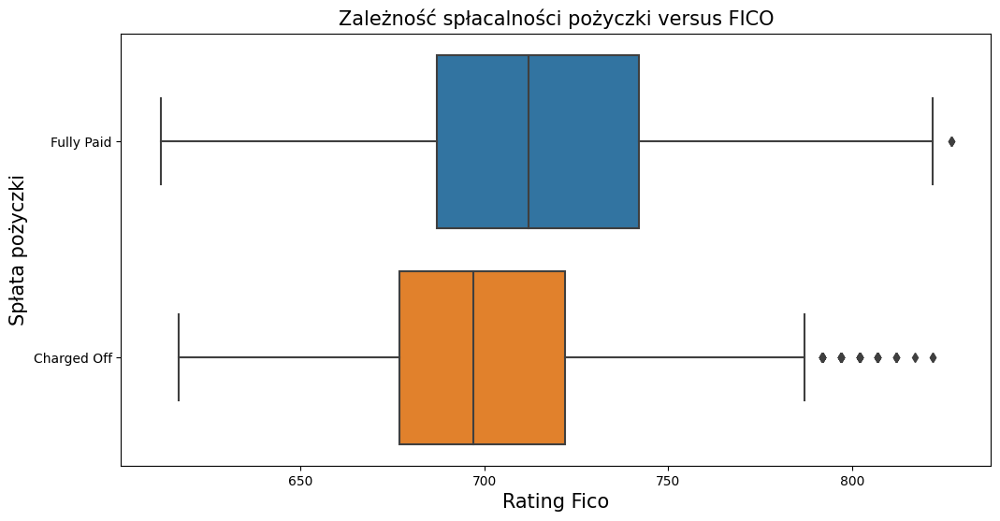

In [116]:
fig = plt.figure(figsize=(12,6))
ax = sns.boxplot(data=data_loan, x="fico_mean", y="loan_status")
plt.xlabel("Rating Fico", fontsize=15)
plt.ylabel("Spłata pożyczki", fontsize=15)
plt.title("Zależność spłacalności pożyczki versus FICO", fontsize=15)

In [117]:
data_loan[data_loan.loan_status == 'Fully Paid'].describe().fico_mean

count    36104.000000
mean       717.220059
std         36.437532
min        612.000000
25%        687.000000
50%        712.000000
75%        742.000000
max        827.000000
Name: fico_mean, dtype: float64

In [118]:
data_loan[data_loan.loan_status == 'Charged Off'].describe().fico_mean

count    6431.000000
mean      702.883999
std        32.152072
min       617.000000
25%       677.000000
50%       697.000000
75%       722.000000
max       822.000000
Name: fico_mean, dtype: float64

### Wniosek:
Na podstawie przedstawionych wykresów i tabel wnioskuję, iż więcej pożyczek jest spłaconych przez pożyczkobiorców z wyższym Fico (exceptional i very good). Pożyczkobiorcy o dobrym i średnim Fico częściej nie spłacąja pożyczek. Fico powyżej 780 to pożyczkobiorcy bardzo dobrze spłacający kredyty. Zdecydowana większość udzielanych pożyczek dla Fico powyżej 670. Pierwszy kwartyl, średnia, mediana i trzeci kwartyl są wyższe dla pożyczkobiorców z lepszym Fico.

### Pytanie 2. (earliest_cr_line vs loan_status)
2. W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO

In [119]:
data_loan['earliest_cr_line']= pd.to_datetime(data_loan['earliest_cr_line']).apply(lambda x: int(x.strftime('%Y')))
data_loan['earliest_cr_line']

0        1985
1        1999
2        2001
3        1996
4        1996
         ... 
42531    2007
42532    2007
42533    2007
42534    2007
42535    2007
Name: earliest_cr_line, Length: 42535, dtype: int64

Text(0, 0.5, 'Historia kredytowa')

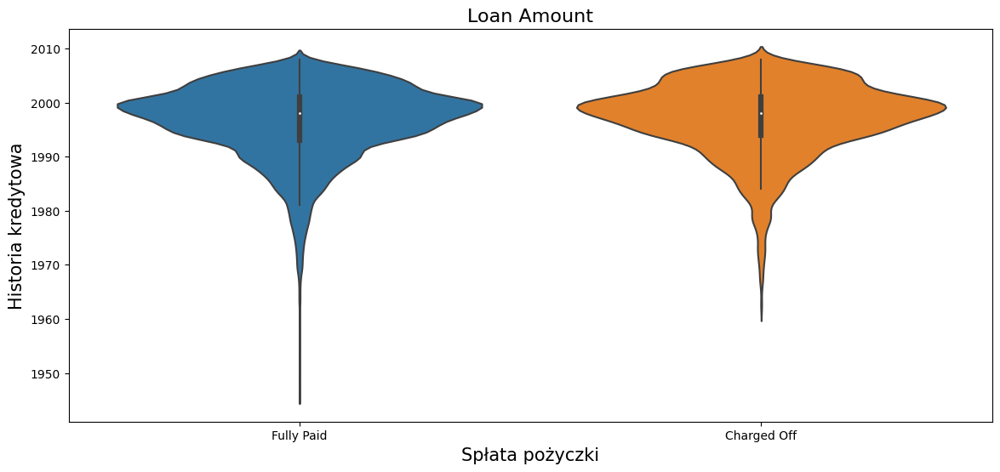

In [120]:
fig = plt.figure(figsize=(14,6))
sns.violinplot(x="loan_status", y="earliest_cr_line", data=data_loan, split=True)
plt.title("Loan Amount", fontsize=16)
plt.xlabel("Spłata pożyczki", fontsize=15)
plt.ylabel("Historia kredytowa", fontsize=15)

In [121]:
ECL_loan_status_FP = data_loan[(data_loan.earliest_cr_line) & (data_loan.loan_status == 'Fully Paid')]

In [122]:
ECL_loan_status_CO = data_loan[(data_loan.earliest_cr_line) & (data_loan.loan_status == 'Charged Off')]

Text(0.5, 1.0, 'Zależność spłacalności pożyczki (Fully Paid) versus FICO')

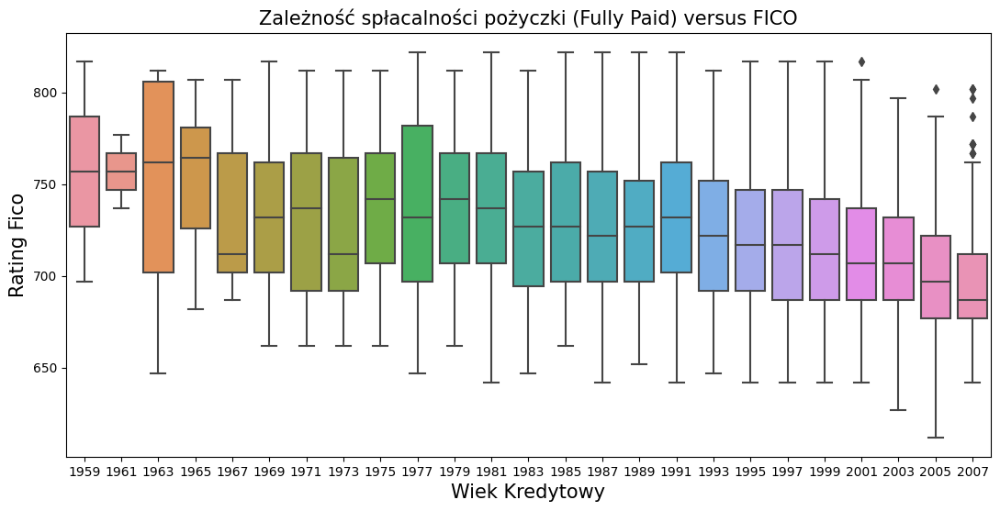

In [123]:
fig = plt.figure(figsize=(13,6))
ax = sns.boxplot(data=ECL_loan_status_FP, x="earliest_cr_line", y="fico_mean")
plt.xlabel("Wiek Kredytowy", fontsize=15)
plt.ylabel("Rating Fico", fontsize=15)
plt.title("Zależność spłacalności pożyczki (Fully Paid) versus FICO", fontsize=15)

Text(0.5, 1.0, 'Zależność niespłacalności pożyczki (Charged Off) versus FICO')

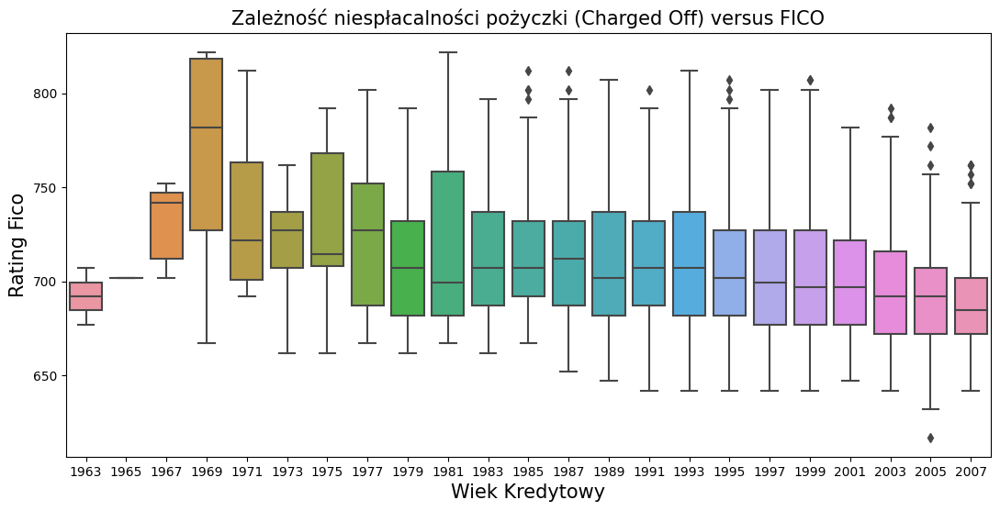

In [124]:
fig = plt.figure(figsize=(13,6))
ax = sns.boxplot(data=ECL_loan_status_CO, x="earliest_cr_line", y="fico_mean")
plt.xlabel("Wiek Kredytowy", fontsize=15)
plt.ylabel("Rating Fico", fontsize=15)
plt.title("Zależność niespłacalności pożyczki (Charged Off) versus FICO", fontsize=15)

### Wniosek:
Na podstawie przedstawionego wykresu widać, że Ci najstarsi klienci spłacają kredyty częściej, choć jest ich znikoma ilość. W znaczącej wielkości wszystkich pożyczkobiorców, wiek już nie ma specjalnego znaczenia. Ryzyko to jest związane z wynikiem FICO. Im wiek kredytowy jest krótszy, tym ryzyko związane z niewykonaniem zobowiązania rośnie.

### Pytanie 3. (home_ownership vs loan_status)
3. W jaki sposób status kredytu hipotecznego na dom wiąże się z prawdopodobieństwem niewypłacalności?

In [125]:
homeloan = ['loan_status', 'home_ownership']
cm = sns.light_palette( "orange", as_cmap=True)
round(pd.crosstab(data_loan[homeloan[0]], data_loan[homeloan[1]], 
            normalize='index'),2).fillna(0).style.background_gradient(cmap = cm)

home_ownership,MORTGAGE,NONE,OTHER,OWN,RENT
loan_status,,,,,
Charged Off,0.420000,0.000000,0.000000,0.080000,0.500000
Fully Paid,0.450000,0.000000,0.000000,0.080000,0.470000


<Figure size 800x600 with 0 Axes>

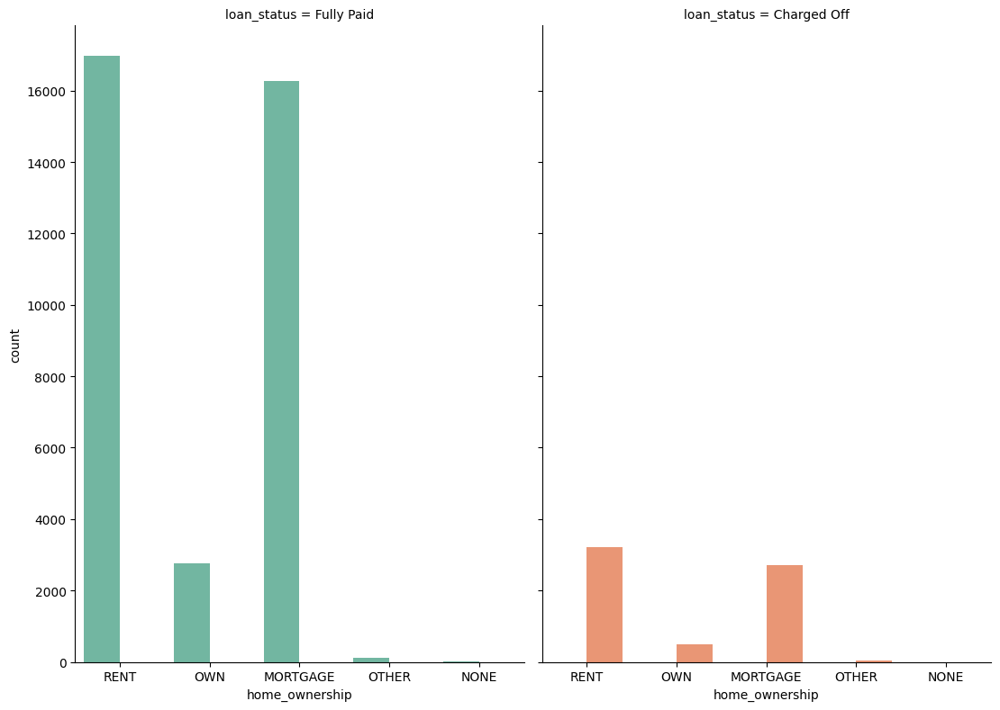

In [126]:
plt.figure(figsize = (8,6))
g = sns.catplot(x="home_ownership", hue="loan_status", col="loan_status", data=data_loan, kind="count", 
                height=8, aspect=.7, palette='Set2')

### Wniosek:
Na podstawie przedstawionych wykresów wnioskuję, iż w każdej grupie pożyczkobiorców (spłacających lub nie) podobnie rozkładają się wyniki. Z tabelki powyżej widać, iż ciut więcej jest osób z kredytem hipotecznym, które spłaciły pożyczkę, a odwrotnie przy mieszkaniu wynajętym. Właściwie brak danych o pożyczkobiorcach w kategoriach 'Other' i 'None'.

### Pearson’s Chi-Square Test

Ponieważ mamy dwie zmienne kategoryczne zastosujemy Chi-Square Test. Sprawdzimy czy jest zależność pomiędzy tymi zmiennymi.
- H0 - hipoteza zerowa "Nie ma zależności między statusem mieszkania a spłatą pożyczki"
- H1 - hipoteza alternatywna "Są znaczące relacje między zmiennymi"

In [127]:
data_cross = pd.crosstab(data_loan['home_ownership'], data_loan['loan_status'])
print(data_cross)

loan_status     Charged Off  Fully Paid
home_ownership                         
MORTGAGE               2699       16260
NONE                      1           7
OTHER                    29         107
OWN                     495        2756
RENT                   3207       16974


In [128]:
stat, p_value, dof, expected = chi2_contingency(data_cross)
alpha = 0.05
print(p_value)

4.922904146937375e-05


In [129]:
if p_value <= alpha: 
    print('Odrzucamy hipotezę HO - Są znaczące relacje między zmiennymi') 
else: 
    print('Akceptujemy hipotezę zerową HO - Nie ma zależności między statusem mieszkania a spłatą pożyczki') 

Odrzucamy hipotezę HO - Są znaczące relacje między zmiennymi


### Pytanie 4. (annual_income vs loan_status)
4. W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?

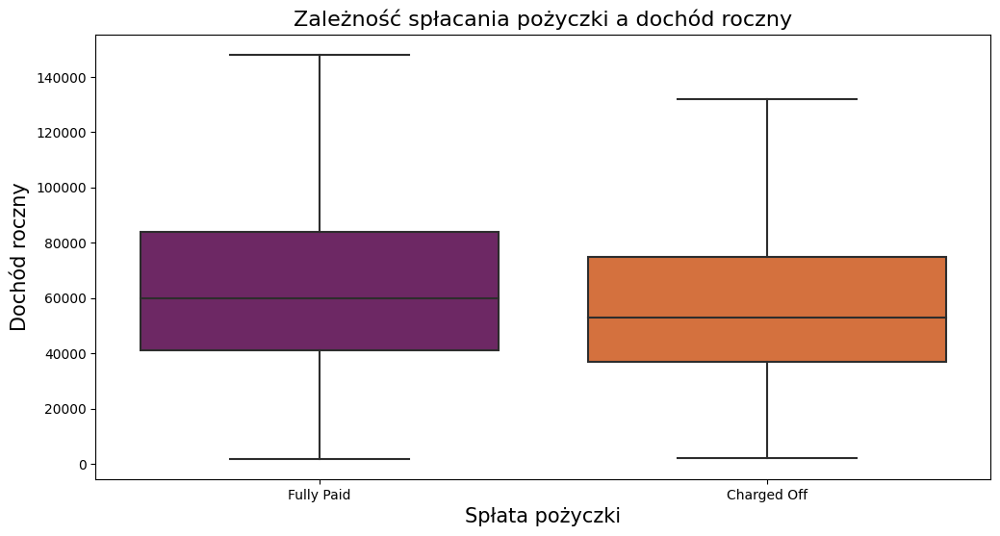

In [130]:
plt.figure(figsize=(12,6))

ax = sns.boxplot(x="loan_status", y="annual_inc",  data=data_loan, showfliers=False, palette="inferno")
ax = plt.title('Zależność spłacania pożyczki a dochód roczny', fontsize=16)
ax = plt.xlabel('Spłata pożyczki', fontsize=15)
ax = plt.ylabel('Dochód roczny', fontsize=15)

### Wniosek:
Na podstawie przedstawionego wykresu widać, że średnia wysokość dochodu rocznego jest wyższa u klientów spłacającyh swoje pożyczki. Ci z najwyższym dochodem spłacają swoje pożyczki. 

### Pytanie 5. (emp_length vs loan_status)
5. W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?

In [131]:
emplenght = ['loan_status', 'emp_length']
cm = sns.light_palette("gray", as_cmap=True)
round(pd.crosstab(data_loan[emplenght[0]], data_loan[emplenght[1]], 
            normalize='index'),2).fillna(0).style.background_gradient(cmap = cm)

emp_length,1,2,3,4,5,6,7,8,9,10
loan_status,,,,,,,,,,
Charged Off,0.200000,0.100000,0.100000,0.080000,0.080000,0.050000,0.050000,0.040000,0.030000,0.270000
Fully Paid,0.200000,0.110000,0.100000,0.090000,0.080000,0.060000,0.040000,0.040000,0.030000,0.240000


Text(0, 0.5, 'Spłata pożyczki')

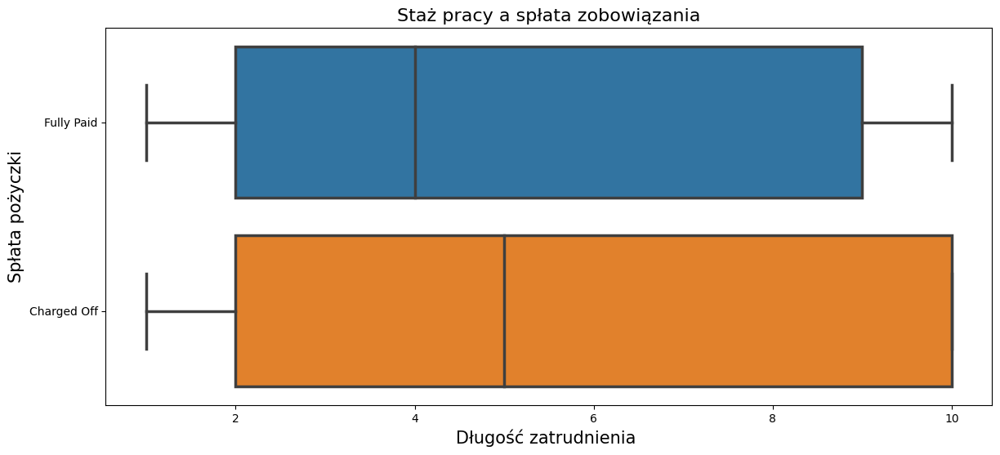

In [132]:
plt.figure(figsize = (14,6))
ax = sns.boxplot(x="emp_length" , y= "loan_status", data=data_loan, linewidth=2.5)
plt.title("Staż pracy a spłata zobowiązania", fontsize=16)
plt.xlabel("Długość zatrudnienia ", fontsize=15)
plt.ylabel("Spłata pożyczki", fontsize=15)

### Wniosek:
Na podstawie przedstawionych wykresów wnioskuję, iż jest większa liczba pożyczkobiorców niespłacających kredytu jest od 9 do 10 lat zatrudnienia. Ci spłacający mają krótszy staż pracy. Ci do 4 lat zatrudnienia częściej pozytywnie kończą umowę kredytową. 

### Pytanie 6. (loan_amnt vs loan_status)
6. Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?

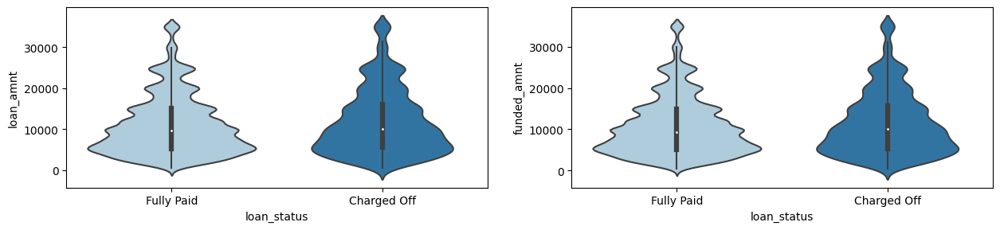

In [133]:
fig,axes = plt.subplots(3,2, figsize=(15,10))

sns.violinplot(x="loan_status", y="loan_amnt", data=data_loan, ax=axes[0][0], palette="Paired")
sns.violinplot(x="loan_status", y="funded_amnt", data=data_loan, ax=axes[0][1],palette="Paired")

fig.delaxes(ax = axes[1][0])
fig.delaxes(ax = axes[1][1])
fig.delaxes(ax = axes[2][0])
fig.delaxes(ax = axes[2][1])

Text(0, 0.5, 'Wysokość kredytu ')

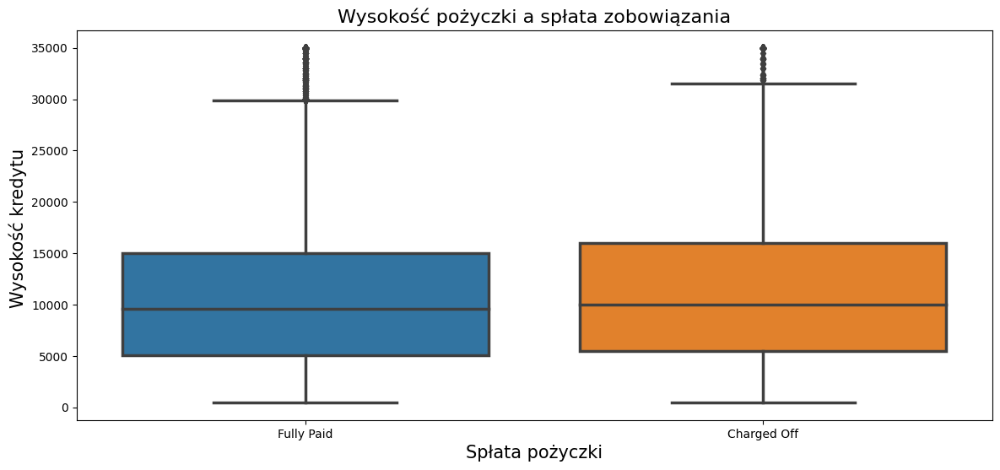

In [134]:
plt.figure(figsize = (14,6))
ax = sns.boxplot(y="loan_amnt" , x= "loan_status", data=data_loan, linewidth=2.5)
plt.title("Wysokość pożyczki a spłata zobowiązania", fontsize=16)
plt.xlabel("Spłata pożyczki", fontsize=15)
plt.ylabel("Wysokość kredytu ", fontsize=15)

### Wniosek:
Na podstawie przedstawionych wykresów widać, że podobnie rozkładają się spłaty pożyczki wnioskowanej i udzielonej. W naszym projekcie loan_amnt to kwota wnioskowana, a nie udzielona. Część pożyczek powyżej 15tys. nie została spłacona częściej.  

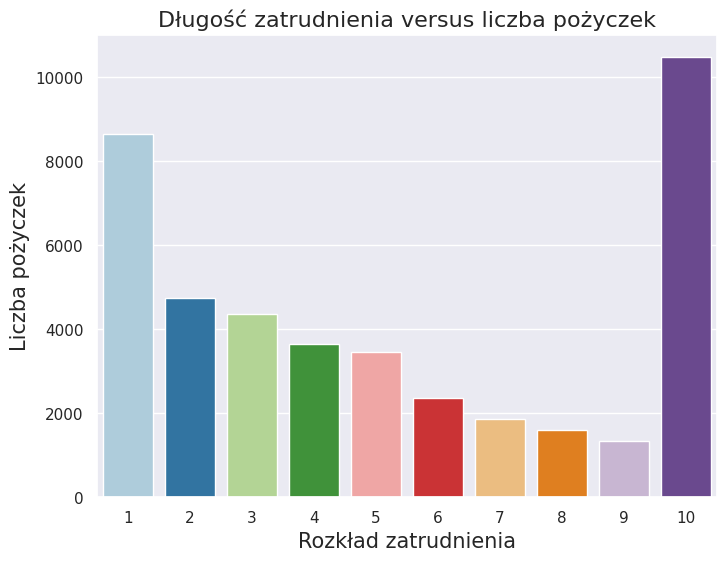

In [135]:
sns.set(rc={'figure.figsize':(8,6)})
sns.countplot(x=data_loan['emp_length'], palette='Paired')
plt.xlabel("Rozkład zatrudnienia", fontsize = 15)
plt.ylabel("Liczba pożyczek", fontsize = 15)
plt.title("Długość zatrudnienia versus liczba pożyczek", fontsize = 16)
plt.show()

### Wniosek: 
W badanym okresie 2007-20011 najwięcej pożyczek zostało udzielonych osobom z długim okresem zatrudnienia, oraz druga grupa osoby zaczynające pracę, czyli pracujące koło roku. W tej kolumnie było ponad 100 nulli, które zostaly uzupełnione wartością dominanty, co zwiększyło jeszcze liczbę udzielonych pożyczek grupie z indeksem 10. 

### Testowanie Hipotezy One Sample T-test
Ponieważ mamy jedną zmienną numeryczną zastosujemy One Sample T-test na próbce z emp_length.
Sprawdzimy czy jest róznica pomiędzy warościami średnich próbki i całej populacji tej zmiennej. 
- H0 - hipoteza zerowa "Nie ma różnic między średnią próbki a średnią całości"
- H1 - hipoteza alternatywna "Są różnice w średnich"  

In [136]:
data_loan.emp_length.mean()

5.174820735864582

In [137]:
len(data_loan.emp_length)

42535

In [138]:
# weźmy próbkę danych emp_length 30%
sample_size = 14100
emp_length_sample = np.random.choice(data_loan.emp_length, sample_size)
emp_length_sample

array([ 1, 10,  7, ...,  3,  1,  6])

In [139]:
ttest, p_value = ttest_1samp(emp_length_sample, data_loan.emp_length.mean())
print(p_value)

0.1713455182500325


In [140]:
if p_value < 0.05:
    print('Odrzucamy hipotezę zerową H0 - Są różnice w średnich')
else:
    print('Akceptujemy hipotezę zerową H0 - Nie ma różnic między średnią próbki a średnią całości')

Akceptujemy hipotezę zerową H0 - Nie ma różnic między średnią próbki a średnią całości


/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  if sys.path[0] == "":


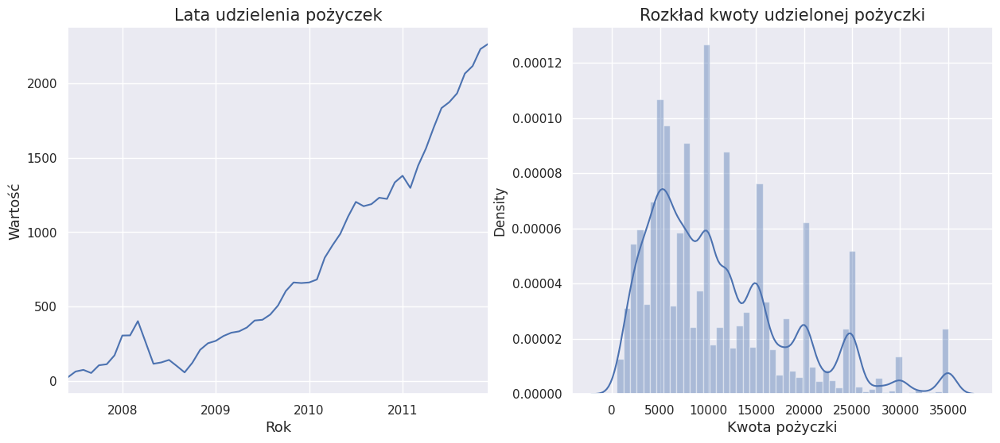

In [141]:
year_dist = data_loan.groupby(['issue_d']).size()
plt.figure(figsize=(15,6))
sns.set()

ax1 = plt.subplot(1, 2, 1)
ax1 = year_dist.plot()
ax1 = plt.title('Lata udzielenia pożyczek', fontsize = 15)
ax1 = plt.xlabel('Rok', fontsize = 13)
ax1 = plt.ylabel('Wartość', fontsize = 13)

ax2 = plt.subplot(1, 2, 2)
ax2 = sns.distplot(data_loan['loan_amnt'])
ax2 = plt.title('Rozkład kwoty udzielonej pożyczki', fontsize = 15)
ax2 = plt.xlabel('Kwota pożyczki', fontsize = 13)

### Wniosek:
Na podstawie przedstawionych wykresów widać (na pierwszym wykresie) rosnącą popularność kredytów pożyczkowych po 2009 r. w wysokości przekraczającej 5 tys. Do 2008 r. kredyty były udzielane w niskiej wysokości do 2,5 tys.
Rozkład kwoty pożyczki jest nieco przesunięty w prawo. Większość pożyczkobiorców ubiegała się o pożyczkę w wysokości około 10 000 USD.

### funded czy loan_amnt
W projekcie zajmujemy się wartością loan_amnt, która jest kwotą wnioskowaną, a nie rzeczywiście przyznaną.
Funded_amnt to kwota przyznana wynikająca z danych Lending Club. Na potrzeby tego projektu analizujemy loan_amnt. 

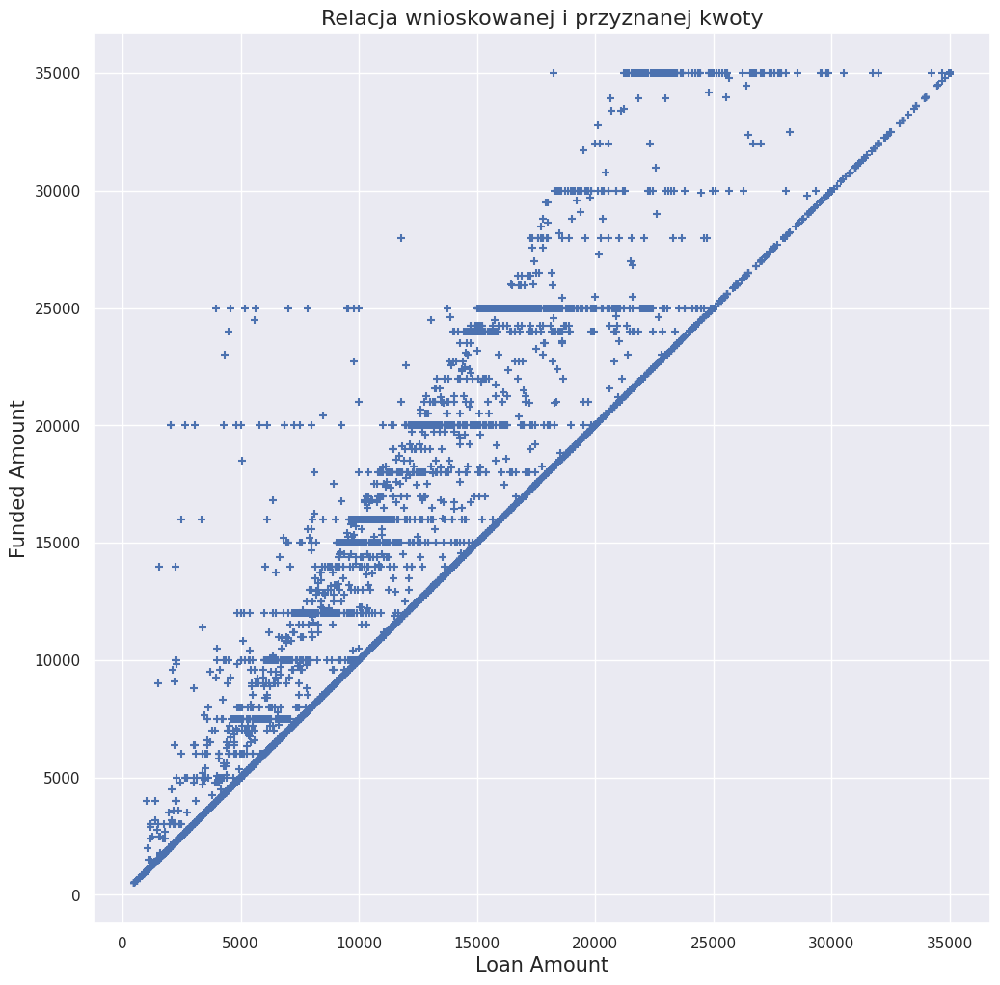

In [142]:
plt.figure(figsize=(12,12))
plt.scatter(data_loan['funded_amnt'], data_loan['loan_amnt'], marker="+")
plt.title("Relacja wnioskowanej i przyznanej kwoty", fontsize = 16)
plt.ylabel('Funded Amount', fontsize = 15)
plt.xlabel('Loan Amount', fontsize = 15)
plt.show()

### Wniosek:
Na podstawie przedstawionego wykresu widać, że w większości wartości wnioskowane są wyższe niż przyznane. Poniżej widać również, że LC nie udziela większej pożyczki niż wnioskowana. 

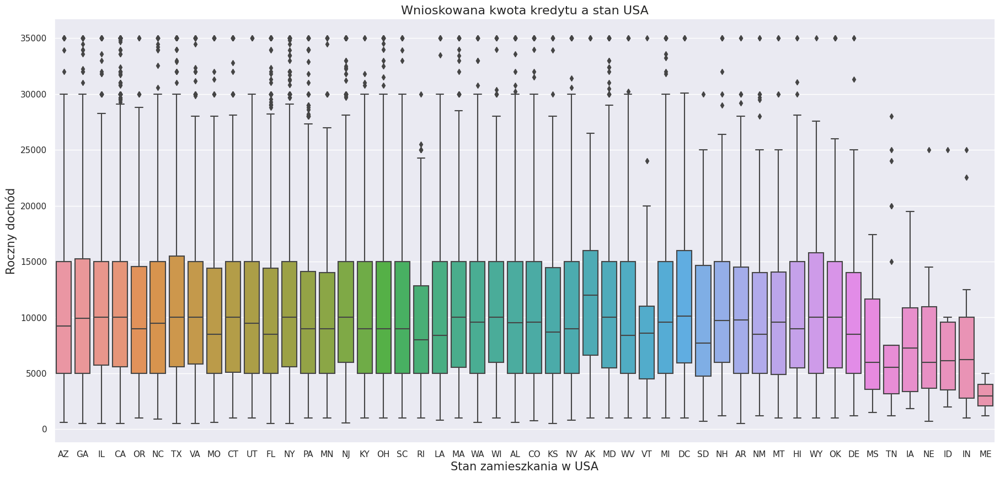

In [143]:
plt.figure(figsize=(22, 10))
ax = sns.boxplot(x="addr_state", y="loan_amnt", data=data_loan)
ax = plt.xlabel('Stan zamieszkania w USA',fontsize=15)
ax = plt.ylabel('Roczny dochód', fontsize = 15)
ax = plt.title('Wnioskowana kwota kredytu a stan USA', fontsize = 16)

### Wniosek:
Na podstawie przedstawionego zbioru wykresów boxplots, warto zauważyć, że średni roczny dochód jest najniższy w stanie Maine (ME) i niższy niż minimalny dochów w większości stanów USA. Najwyższa średia zarobków jest w stanie Alaska (AK)

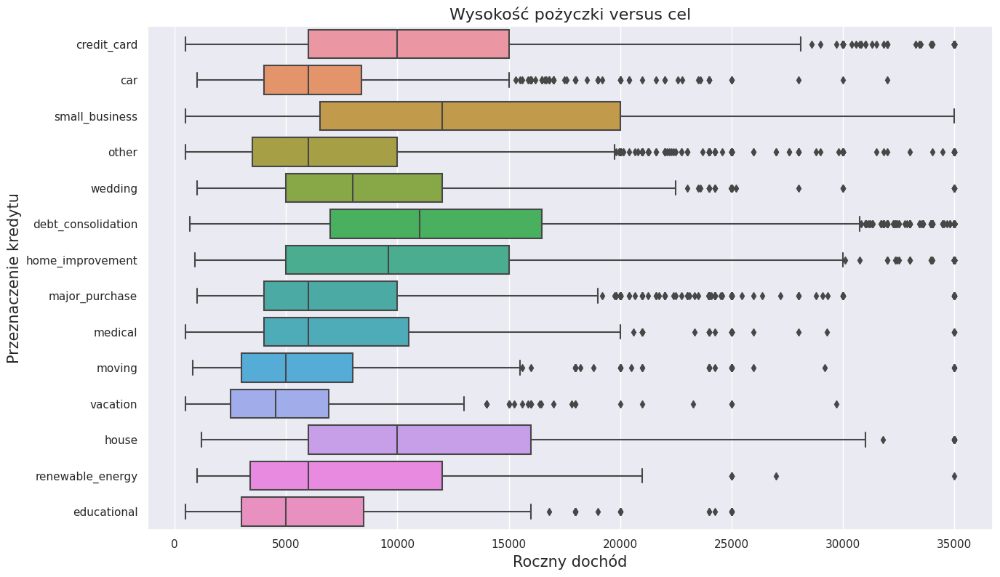

In [144]:
plt.figure(figsize=(15,9))
ax = sns.boxplot(y="purpose", x="loan_amnt", data=data_loan)
ax = plt.xlabel('Roczny dochód',fontsize=15)
ax = plt.ylabel('Przeznaczenie kredytu',fontsize=15)
ax = plt.title('Wysokość pożyczki versus cel',fontsize=16)

### Wniosek:
Na podstawie przedstawionego wykresu wyraźnie widać, że najwięcej kredytów jest przyznawanych na rozwój małej przedsiębiorczości. Tu również średnia i największa wartość udzielonych kredytów dotyczy tej grupy. Większość niskich kredytów jest na cel edukacyjny i wakacje. 

### Pearson’s Chi-Square Test na zależność 'purpose' a 'home_ownership'

Ponieważ mamy dwie zmienne kategoryczne zastosujemy Chi-Square Test. Sprawdzimy czy jest zależność pomiędzy tymi zmiennymi.
- H0 - hipoteza zerowa "Nie ma zależności między statusem mieszkania a celem pożyczki"
- H1 - hipoteza alternatywna "Są znaczące relacje między zmiennymi"

In [145]:
data_cross1 = pd.crosstab(data_loan['home_ownership'], data_loan['purpose'])
print(data_cross1)

purpose         car  credit_card  debt_consolidation  educational  \
home_ownership                                                      
MORTGAGE        779         2446                8308          113   
NONE              0            0                   1            0   
OTHER             3           16                  52            5   
OWN             163          315                1365           34   
RENT            670         2700               10050          270   

purpose         home_improvement  house  major_purchase  medical  moving  \
home_ownership                                                             
MORTGAGE                    2540    158             979      333     117   
NONE                           0      0               0        0       0   
OTHER                          7      3               8        5       3   
OWN                          352     34             252       72      28   
RENT                         300    231            1072     

In [146]:
stat, p_value, dof, expected = chi2_contingency(data_cross1)
alpha = 0.05
print(p_value)

0.0


In [147]:
if p_value <= alpha: 
    print('Odrzucamy hipotezę HO - Są znaczące relacje między zmiennymi home_ownership i purpose') 
else: 
    print('Akceptujemy hipotezę zerową HO - Nie ma zależności między statusem mieszkania a celem pożyczki') 

Odrzucamy hipotezę HO - Są znaczące relacje między zmiennymi home_ownership i purpose


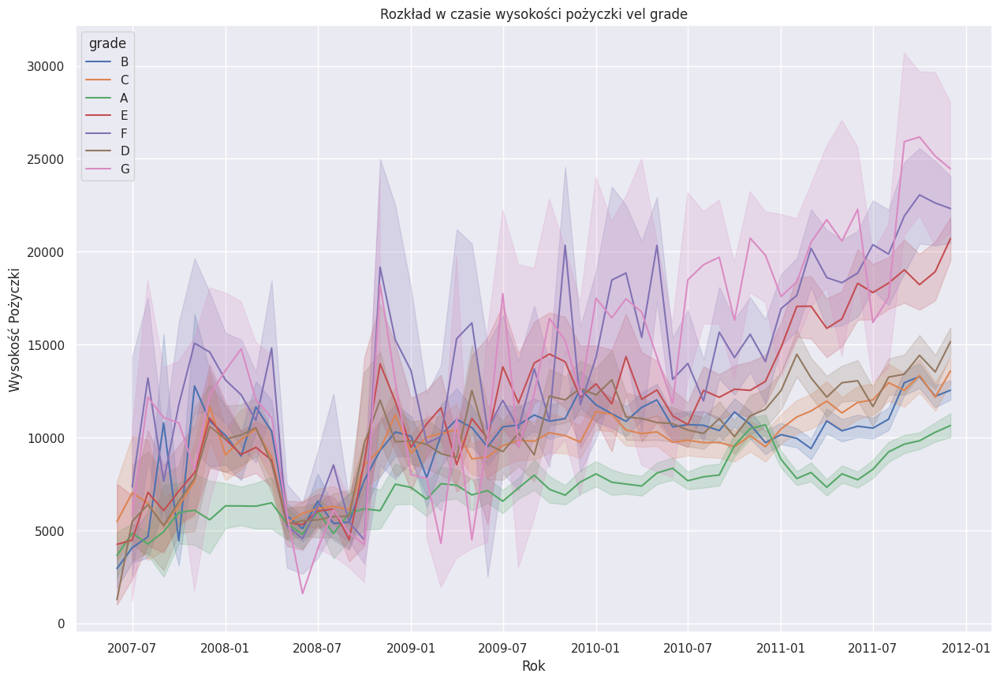

In [148]:
plt.figure(figsize=(15,10))

ax = sns.lineplot(x="issue_d", y="loan_amnt", hue="grade", data=data_loan)
ax = plt.title('Rozkład w czasie wysokości pożyczki vel grade')
ax = plt.xlabel('Rok')
ax = plt.ylabel('Wysokość Pożyczki')

### Wniosek:
Na podstawie przedstawionego wykresu widać, że wartości pożyczek z roku na rok rosły, pomijając spadek między 2008 a 2009. Dla osób z grade A wykres jest dość stabilny, wysokie skoki udzielania pożyczek są dla osób z grade F, D, G.

### Dobry czy zły pożyczkobiorca?

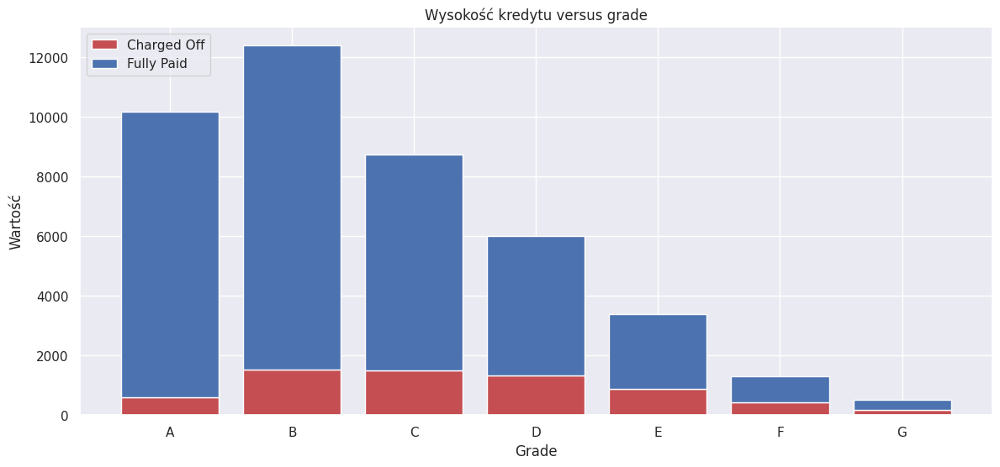

In [149]:
plt.figure(figsize=(14,6))
plot_data = data_loan.groupby(['grade','loan_status']).size().unstack().T
r = range(7)

ax = plt.bar(r, plot_data.values[0], color='r', edgecolor='white',label='Charged Off')
ax = plt.bar(r, plot_data.values[1], bottom=plot_data.values[0], color='b', 
             edgecolor='white',label='Fully Paid')
names = plot_data.columns
ax = plt.xticks(r, names)
ax = plt.legend(loc='upper left')
ax = plt.xlabel('Grade')
ax = plt.ylabel('Wartość')
ax = plt.title('Wysokość kredytu versus grade')

### Wniosek:
Na podstawie przedstawionego wykresu widać, że większość wyższych pożyczek jest udzielanych osobom z grade A, B, C. Osoby z niższym grade mają niższe zobowiązania.  

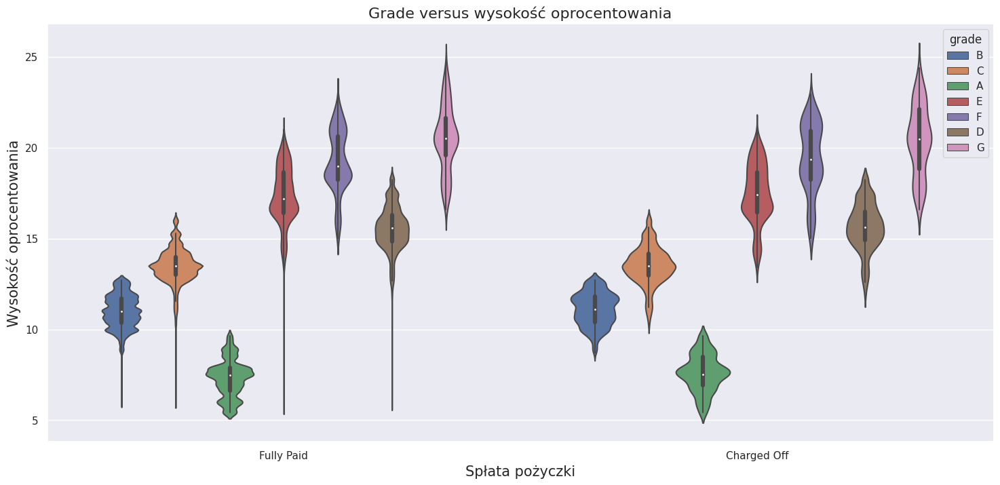

In [150]:
fig = plt.figure(figsize=(18,8))
sns.violinplot(x="loan_status",y="int_rate",data=data_loan, hue="grade")
plt.title("Grade versus wysokość oprocentowania", fontsize=16)
plt.xlabel("Spłata pożyczki", fontsize=15)
plt.ylabel("Wysokość oprocentowania", fontsize=15)
plt.show()

### Wniosek:
Na podstawie przedstawionego wykresu widać, że im lepszy grade A czy B tym wysokość oprocentowania kredytu jest niższa. Osoby z grade = A mają oprocentowanie 5%-10%, a pożyczkobiorcy z garde G od 15% do ponad 25%. 

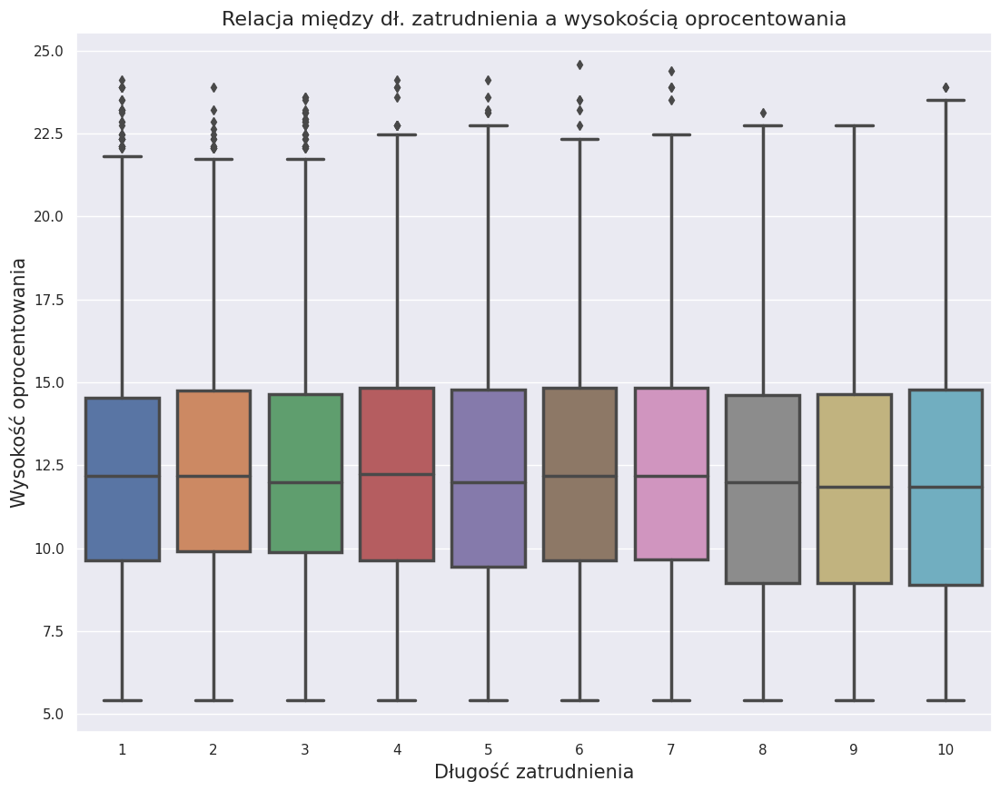

In [151]:
plt.figure(figsize = (13,10))
ax = sns.boxplot(x="emp_length", y= "int_rate", data=data_loan, linewidth=2.5)
plt.xlabel("Długość zatrudnienia",fontsize=15)
plt.ylabel("Wysokość oprocentowania",fontsize=15)
plt.title("Relacja między dł. zatrudnienia a wysokością oprocentowania", fontsize=16)
plt.show()

### Wniosek:
Można podejrzewać, że kredytobiorcy z dłuższym stażem zatrudnienia i ustabilizowaną sytuacją zawodową mają szanse na niższe oprocentowanie kredytu. Część z nich, ze stażem 8,9 czy 10 lat ma najniższe oprocentowanie mniejsze niż 10% a średnia oprocentowania jest dla nich niższa. Spróbuje to sprawdzić na testach. Zastosuję test niezależności, Two Sample T-test

### Zastosuję test niezależności, Two Sample T-test
- H0 - Hipoteza zerowa. "Nie ma zależności między długością zatrudnienia w wysokością oprocentowania pożyczki"
- H1 - Hipoteza alternatywna. "Wysokość oprocentowania pożyczki jest związana ze stażem pracy"

In [152]:
a = data_loan['emp_length']
a.mean()

5.174820735864582

In [153]:
b = data_loan['int_rate']
b.mean()

12.165015634182389

In [154]:
ttest, p_value = stats.ttest_ind(a, b, equal_var = False)
print(p_value)

0.0


In [155]:
if p_value < 0.05:
    print('Odrzucamy hipotezę zerową H0 - Wysokość oprocentowania pożyczki jest związana ze stażem pracy')
else:
    print('Akceptujemy hipotezę zerową H0 - Nie ma zależności między długością zatrudnienia w wysokością oprocentowania pożyczki')

Odrzucamy hipotezę zerową H0 - Wysokość oprocentowania pożyczki jest związana ze stażem pracy


### Two Sample T-test

- H0 - Hipoteza zerowa. "Oprocentowania pożyczki dla pracowników ze stażem 10 i 4 lata są równe"
- H1 - Hipoteza alternatywna. "Wysokość oprocentowania jest inna dla pracowników ze stażem 10 i 4 lata"

In [156]:
emp_10 = data_loan[data_loan['emp_length'] == 10]['int_rate']
emp_10.mean()

12.076703558820464

In [157]:
emp_4 = data_loan[data_loan['emp_length'] == 4]['int_rate']
emp_4.mean()

12.30615237051249

In [158]:
ttest, p_value = stats.ttest_ind(emp_10, emp_4, equal_var = False)
print(p_value)

0.0015679055118476121


In [159]:
if p_value < 0.05:
    print('Odrzucamy hipotezę zerową H0 - Wysokość oprocentowania jest inna dla pracowników ze stażem 10 i 4 lata')
else:
    print('Akceptujemy hipotezę zerową H0 - Oprocentowania pożyczki dla pracowników ze stażem 10 i 4 lata są równe')

Odrzucamy hipotezę zerową H0 - Wysokość oprocentowania jest inna dla pracowników ze stażem 10 i 4 lata


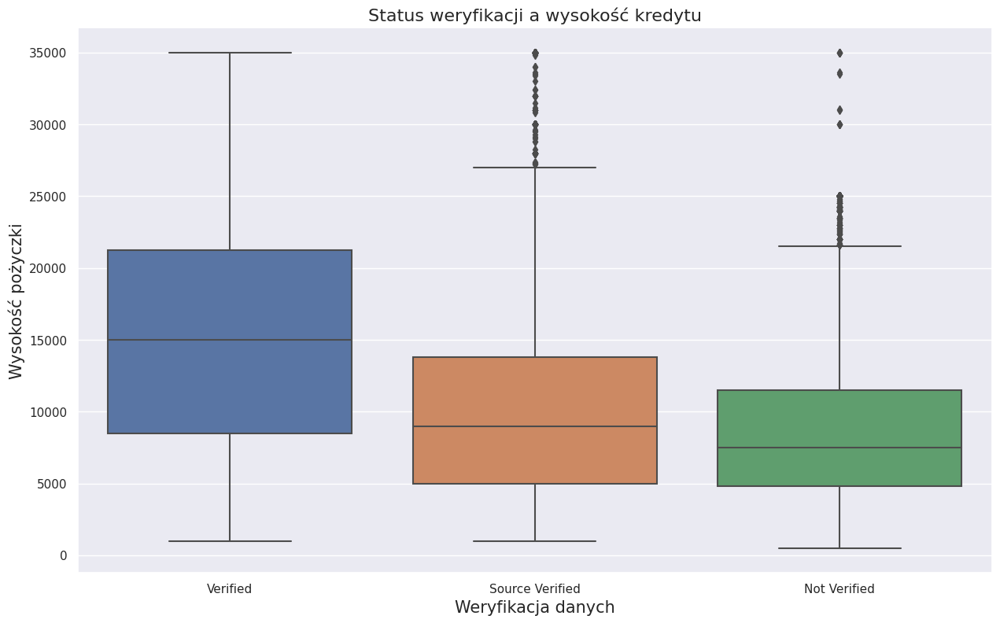

In [160]:
plt.figure(figsize=(15,9))
ax = sns.boxplot(x="verification_status", y="loan_amnt", data=data_loan)
ax = plt.xlabel('Weryfikacja danych',fontsize=15)
ax = plt.ylabel('Wysokość pożyczki',fontsize=15)
ax = plt.title('Status weryfikacji a wysokość kredytu',fontsize=16)

### Wniosek:
Więcej zweryfikowanych pożyczek jest na pożyczkach między 8500 a 21000. Niższe pożyczki są częściej nieweryfikowane. 

### Test ANOVA

- H0 hipoteza zerowa - Nie ma różnic w grupach weryfikacji
- H1 hipoteza alternatywna - Średnie w grupach weryfikacyjnych są różne

In [161]:
a = data_loan[data_loan['verification_status'] == 'Verified']['loan_amnt']
a.mean()

15624.330042313117

In [162]:
b = data_loan[data_loan['verification_status'] == 'Source Verified']['loan_amnt']
b.mean()

10068.780322142442

In [163]:
c = data_loan[data_loan['verification_status'] == 'Not Verified']['loan_amnt']
c.mean()

8394.133169847531

In [164]:
fvalue, p_value = stats.stats.f_oneway(a, b, c)
print(fvalue, p_value)

4716.3219777419445 0.0


In [165]:
if p_value < 0.05:
    print('Odrzucamy hipotezę zerową H0 - Średnie w grupach weryfikacyjnych są różne')
else:
    print('Akceptujemy hipotezę zerową H0 - Nie ma różnic w grupach weryfikacji')

Odrzucamy hipotezę zerową H0 - Średnie w grupach weryfikacyjnych są różne


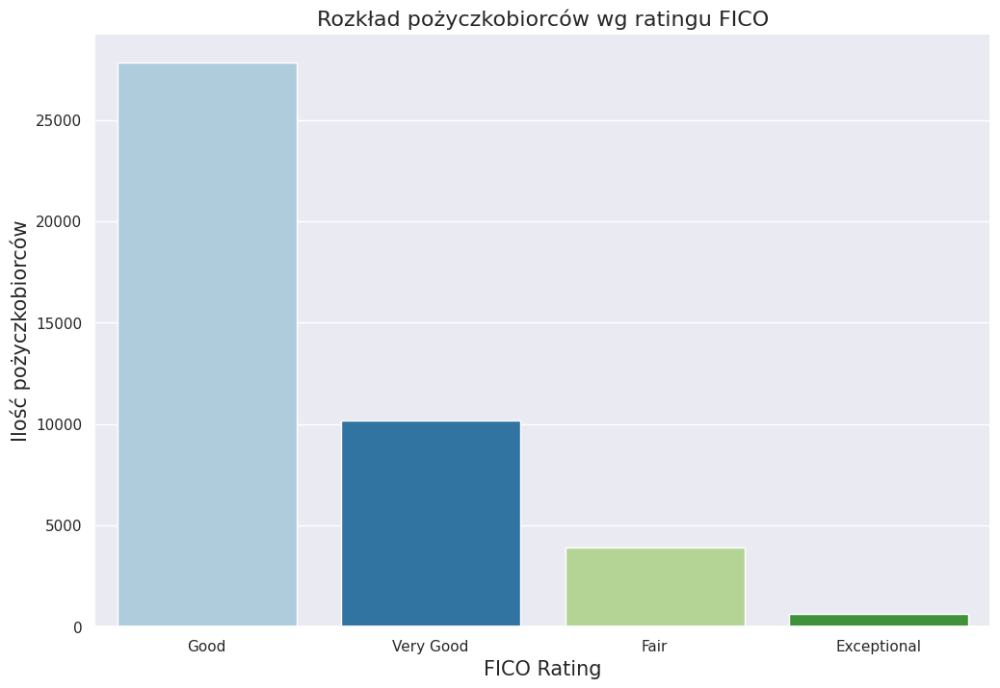

In [166]:
plt.figure(figsize = (12,8))
sns.set(rc={'figure.figsize':(12,8)})
sns.countplot(x=data_loan['fico_rating'], palette='Paired')
plt.xlabel("FICO Rating",fontsize=15)
plt.ylabel("Ilość pożyczkobiorców",fontsize=15)
plt.title("Rozkład pożyczkobiorców wg ratingu FICO", fontsize=16)
plt.show()

### Wniosek:
Na podstawie przedstawionego wykresu widać, iż najmniej pożyczkobiorców ma najwyższe Fico.

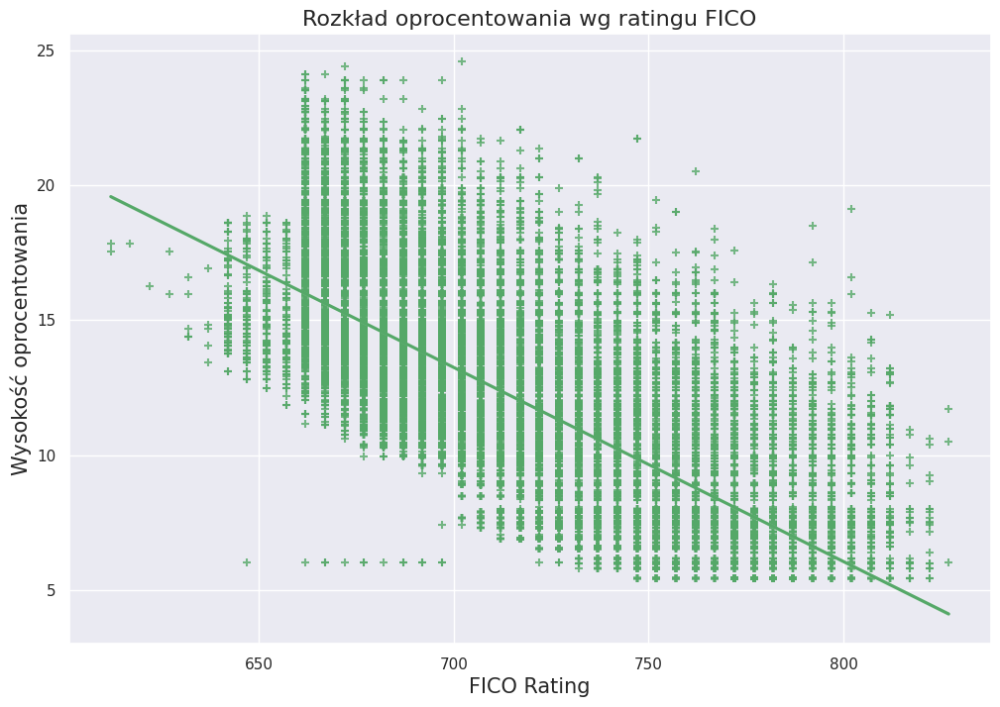

In [167]:
sns.regplot(y="int_rate", x="fico_mean", marker="+", data=data_loan, color="g")
plt.xlabel("FICO Rating",fontsize=15)
plt.ylabel("Wysokość oprocentowania",fontsize=15)
plt.title("Rozkład oprocentowania wg ratingu FICO", fontsize=16)
plt.show()

### Wniosek:
Na podstawie przedstawionego wykresu "Im wyższe Fico tym niższe oprocentowanie". 

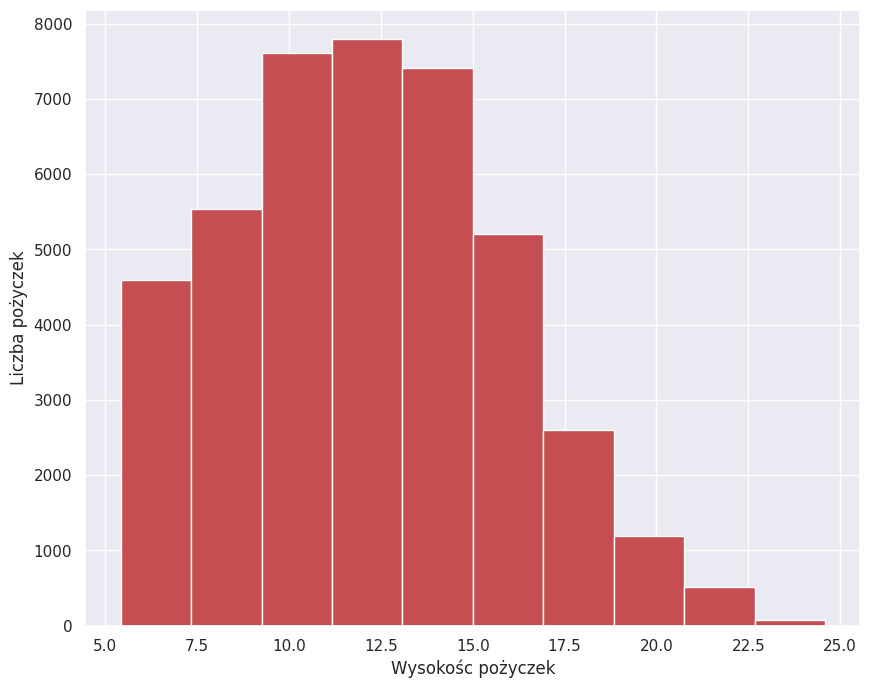

In [168]:
data_loan.int_rate.hist(figsize=(10,8), color='r')
plt.ylabel('Liczba pożyczek')
plt.xlabel('Wysokośc pożyczek')
plt.show()

### Wniosek:
Na podstawie przedstawionego barplotu widać, że Lending Ckub najchętniej udziela pożyczek do 15 tys. 

# Feature Engineering

1. Wcześniej stworzyłem 'rating' z FICO (powyżej), który pójdzie do encodowania.
2. Wcześniej było 'grade' do łatwiejszej wizualizacji, teraz jednak 'grade' usuwam i zostawiam analitykę sub_grade.
3. Stworzę przedziały dla 'annual_income' i 'loan_amnt' i pójdzie do encodowania.
3. Stworzę również przedziały dla wysokości pożyczek. 

In [169]:
data_loan.drop([('grade')],axis=1,inplace=True)

In [170]:
def loan_amnt_rate (row):
    if row['loan_amnt'] < 5000:
        return 'Minimal Loan'
    if row['loan_amnt'] < 10000:
        return 'Medium Low Loan'
    if row['loan_amnt'] < 15000:
        return 'Low Loan'
    if row['loan_amnt'] < 20000:
        return 'Medium High Loan'
    if row['loan_amnt'] < 25000:
        return 'High Loan'
    if row['loan_amnt'] < 30000:
        return 'Very High Loan'
    if row['loan_amnt']  >= 30000:
       return 'Extremely High Loan'
    return 'Other'

data_loan['loan_amnt_rating'] = data_loan.apply (lambda row: loan_amnt_rate(row), axis=1)
data_loan[['loan_amnt','loan_amnt_rating','emp_length','annual_inc']]

,loan_amnt,loan_amnt_rating,emp_length,annual_inc
0,5000.0,Medium Low Loan,10,24000.0
1,2500.0,Minimal Loan,1,30000.0
2,2400.0,Minimal Loan,10,12252.0
3,10000.0,Low Loan,10,49200.0
4,3000.0,Minimal Loan,1,80000.0
...,...,...,...,...
42531,3500.0,Minimal Loan,1,180000.0
42532,1000.0,Minimal Loan,1,12000.0
42533,2525.0,Minimal Loan,1,110000.0
42534,6500.0,Medium Low Loan,1,60000.0


Text(0, 0.5, 'Czas zatrudnienia')

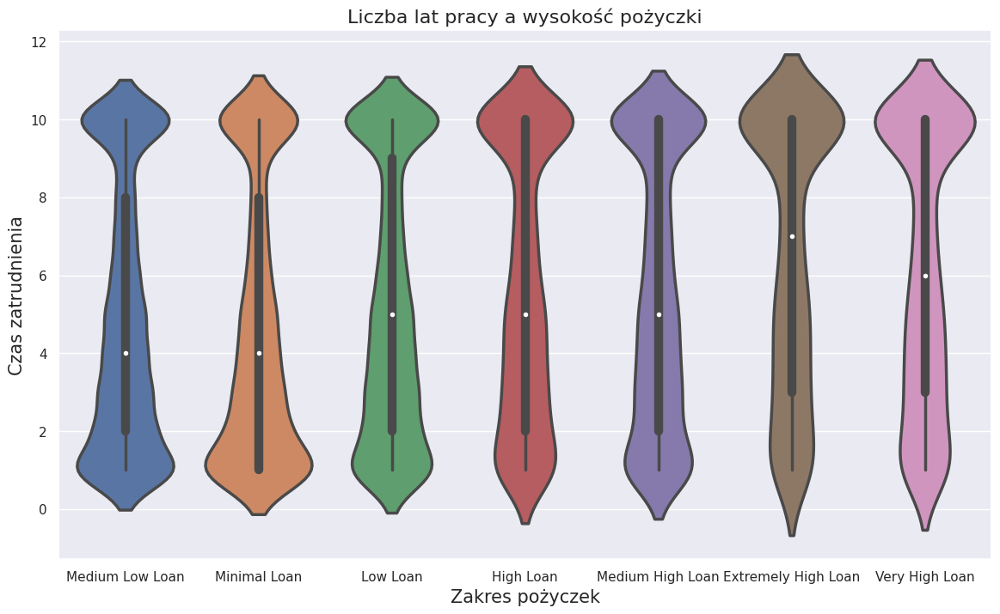

In [171]:
plt.figure(figsize = (14,8))
ax = sns.violinplot(y="emp_length", x= "loan_amnt_rating", data=data_loan, linewidth=2.5)
plt.title("Liczba lat pracy a wysokość pożyczki", fontsize=16)
plt.xlabel("Zakres pożyczek", fontsize=15)
plt.ylabel("Czas zatrudnienia", fontsize=15)

Text(0, 0.5, 'Oprocentowanie pożyczki')

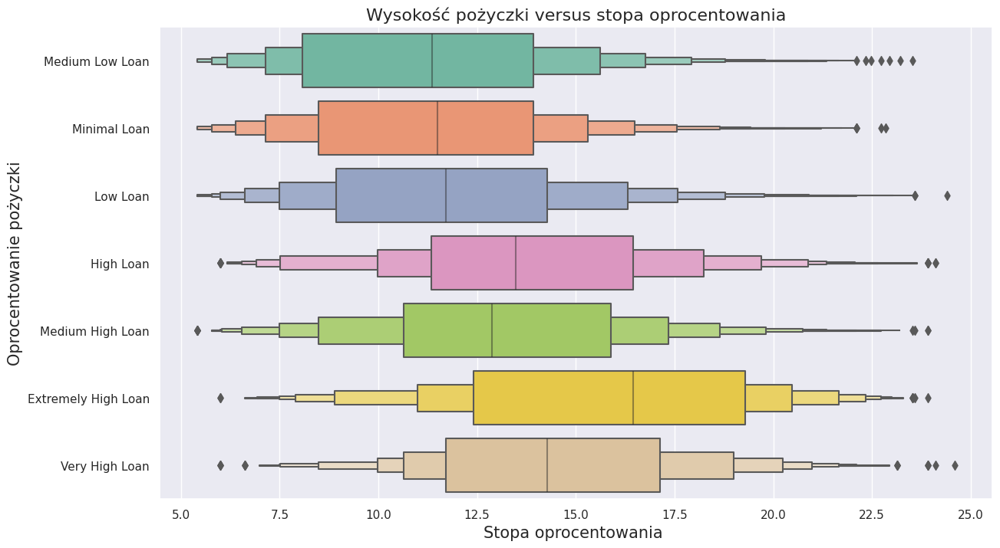

In [172]:
plt.figure(figsize = (14,8))
ax = sns.boxenplot(y="loan_amnt_rating", x="int_rate", data=data_loan, palette="Set2")
plt.title("Wysokość pożyczki versus stopa oprocentowania", fontsize=16)
plt.xlabel("Stopa oprocentowania ", fontsize=15)
plt.ylabel("Oprocentowanie pożyczki", fontsize=15)

Text(0, 0.5, 'Oprocentowanie pożyczki')

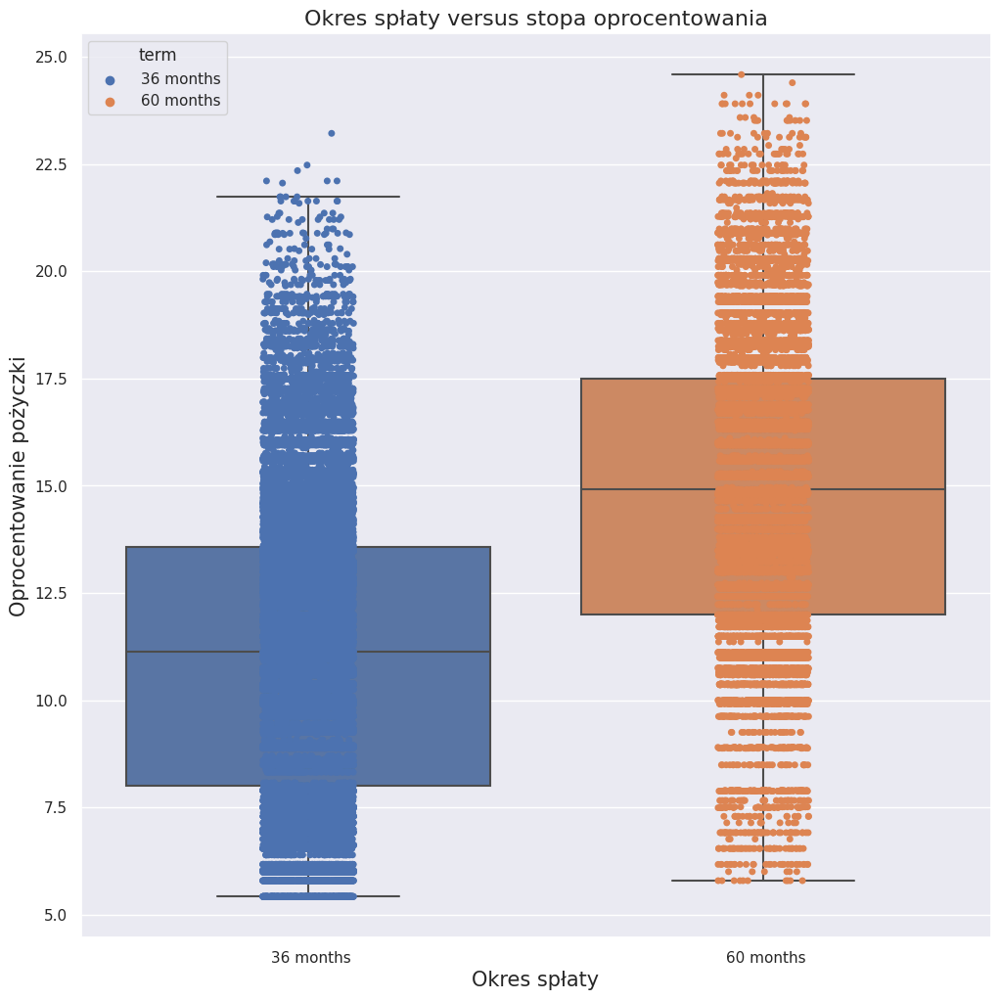

In [173]:
plt.figure(figsize = (12,12))
sns.boxplot(y='int_rate', x='term', data=data_loan, showfliers = False)
ax = sns.stripplot(y='int_rate', x='term', data=data_loan, hue='term')
plt.title("Okres spłaty versus stopa oprocentowania", fontsize=16)
plt.xlabel("Okres spłaty", fontsize=15)
plt.ylabel("Oprocentowanie pożyczki", fontsize=15)

In [174]:
data_loan.int_rate.describe()

count    42535.000000
mean        12.165016
std          3.707936
min          5.420000
25%          9.630000
50%         11.990000
75%         14.720000
max         24.590000
Name: int_rate, dtype: float64

In [175]:
def int_rating (row):
    if row['int_rate'] < data_loan['int_rate'].quantile(0.25):
        return 'Minimal interest rate'
    if row['int_rate'] < data_loan['int_rate'].quantile(0.75):
        return 'Medium interest rate'
    return 'High interest rate'

data_loan['interest_rating'] = data_loan.apply (lambda row: int_rating(row), axis=1)

In [176]:
data_loan[['int_rate','interest_rating']]

,int_rate,interest_rating
0,10.65,Medium interest rate
1,15.27,High interest rate
2,15.96,High interest rate
3,13.49,Medium interest rate
4,12.69,Medium interest rate
...,...,...
42531,10.28,Medium interest rate
42532,9.64,Medium interest rate
42533,9.33,Minimal interest rate
42534,8.38,Minimal interest rate


Text(0.5, 0, 'Grupy oprocentowania')

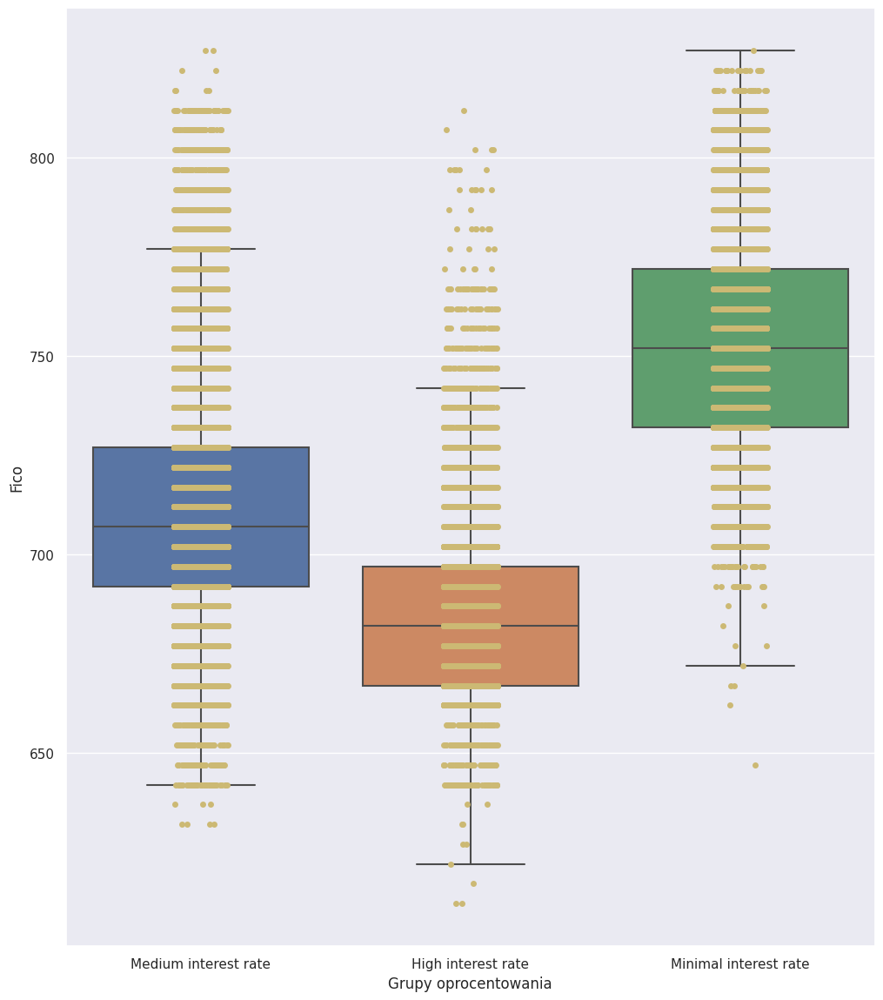

In [177]:
plt.figure(figsize=(12,14))
sns.boxplot(x = 'interest_rating', y = 'fico_mean', data=data_loan, showfliers = False)
ax = sns.stripplot(x = 'interest_rating', y = 'fico_mean', data=data_loan, color='y')
plt.ylabel('Fico')
plt.xlabel('Grupy oprocentowania')

<AxesSubplot:xlabel='loan_status', ylabel='total_acc'>

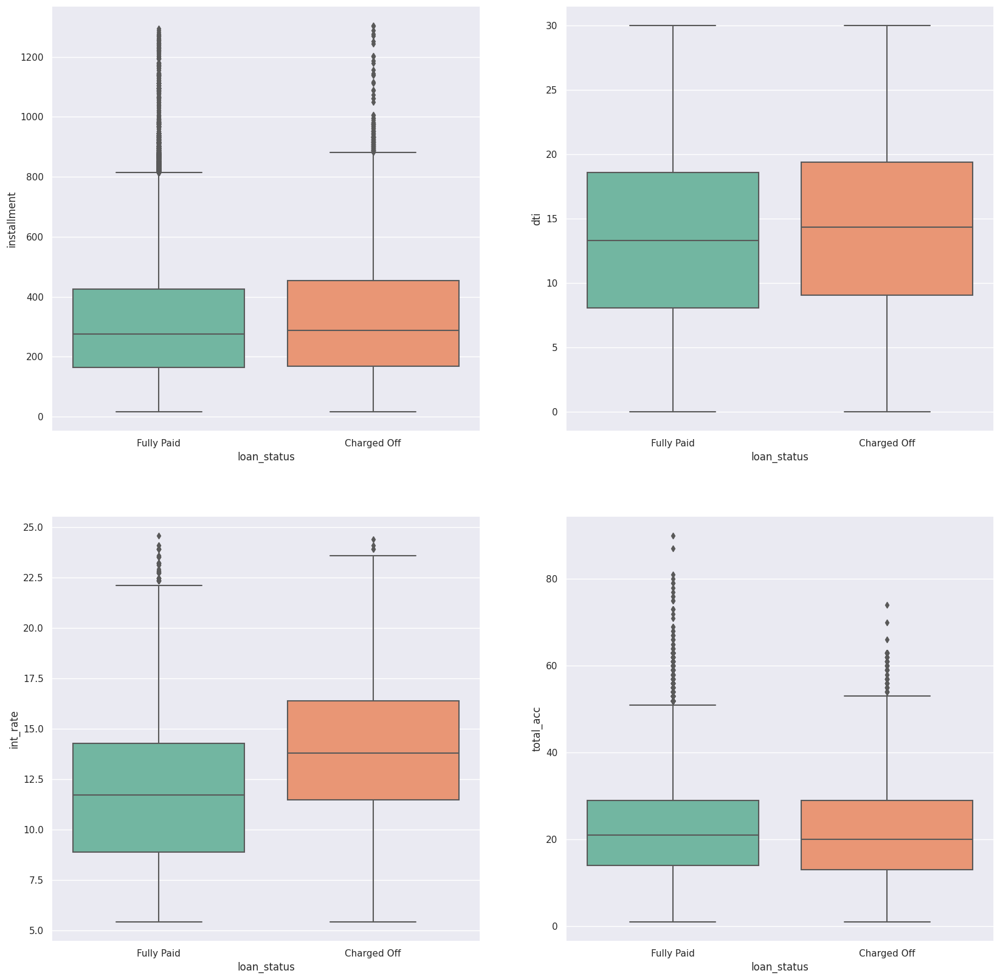

In [178]:
fig,axes = plt.subplots(2,2, figsize=(20,20))
sns.boxplot(y='installment', x='loan_status', data=data_loan, ax=axes[0][0], palette="Set2")
sns.boxplot(y='int_rate', x='loan_status', data=data_loan, ax=axes[1][0], palette="Set2")
sns.boxplot(y='dti', x='loan_status', data=data_loan, ax=axes[0][1], palette="Set2")
sns.boxplot(y='total_acc', x='loan_status', data=data_loan, ax=axes[1][1], palette="Set2")

### Target - loan_status - encoding

In [179]:
le = LabelEncoder()
data_loan['loan_status'] = le.fit_transform(data_loan['loan_status'].astype(str)) 
data_loan['loan_status'].value_counts()

1    36104
0     6431
Name: loan_status, dtype: int64

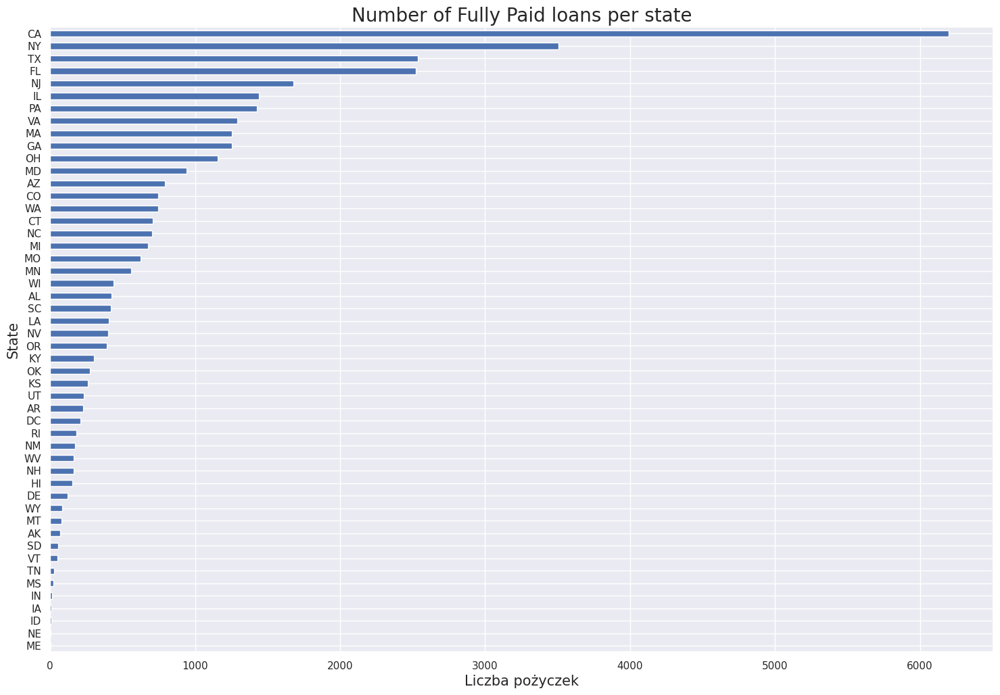

In [180]:
fig = plt.figure(figsize=(18,12))
data_loan[data_loan['loan_status']== 1].groupby('addr_state')['loan_status'].count().sort_values().plot(kind='barh')
plt.ylabel('State',fontsize=15)
plt.xlabel('Liczba pożyczek',fontsize=15)
plt.title('Number of Fully Paid loans per state',fontsize=20);

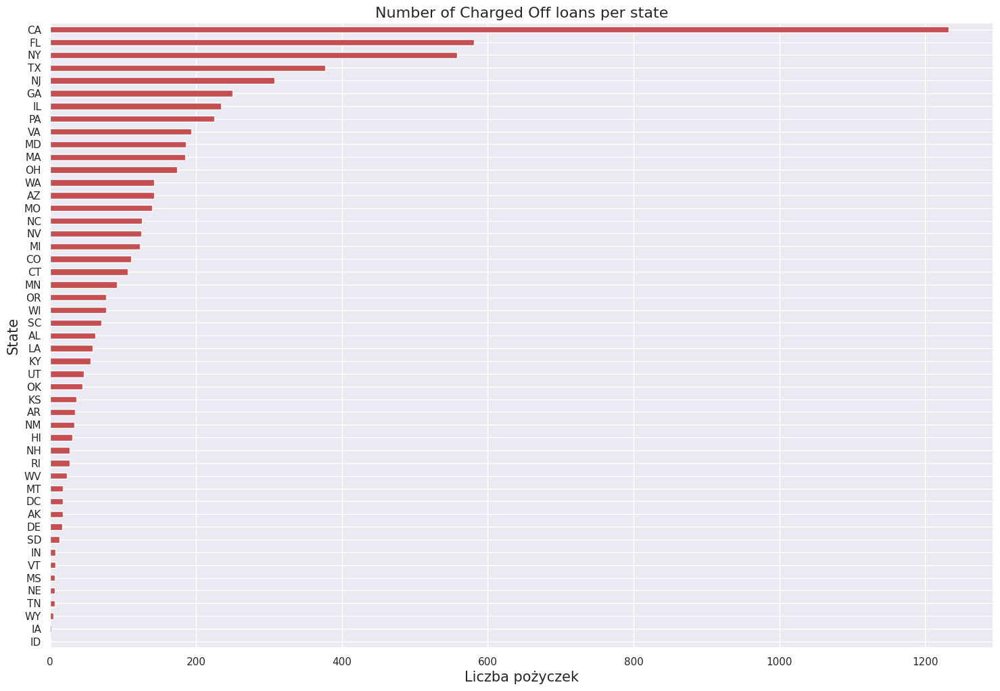

In [181]:
fig = plt.figure(figsize=(18,12))
data_loan[data_loan['loan_status']== 0].groupby('addr_state')['loan_status'].count().sort_values().plot(kind='barh',color = 'r')
plt.ylabel('State',fontsize=15)
plt.xlabel('Liczba pożyczek',fontsize=15)
plt.title('Number of Charged Off loans per state',fontsize=16);

Text(0.5, 1.0, 'Distribution of Interest Rate')

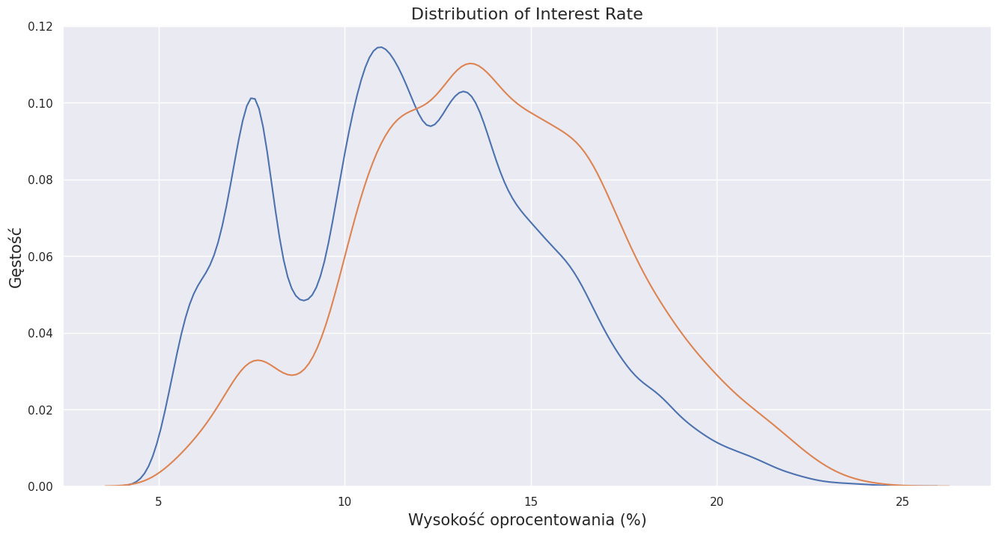

In [182]:
fig = plt.figure(figsize=(16,8))
sns.kdeplot(data_loan.loc[data_loan['loan_status'] == 1, 'int_rate'], label = 'Fully Paid')
sns.kdeplot(data_loan.loc[data_loan['loan_status'] == 0, 'int_rate'], label = 'Charged Off')
plt.xlabel('Wysokość oprocentowania (%)',fontsize=15)
plt.ylabel('Gęstość',fontsize=15)
plt.title('Distribution of Interest Rate',fontsize=16)

In [183]:
data_loan.dtypes

loan_amnt                        float64
funded_amnt                      float64
term                              object
int_rate                         float64
installment                      float64
sub_grade                         object
emp_length                         int64
home_ownership                    object
annual_inc                       float64
verification_status               object
issue_d                   datetime64[ns]
loan_status                        int64
purpose                           object
addr_state                        object
dti                              float64
delinq_2yrs                      float64
earliest_cr_line                   int64
inq_last_6mths                   float64
mths_since_last_delinq           float64
open_acc                         float64
pub_rec                          float64
revol_bal                        float64
revol_util                       float64
total_acc                        float64
pub_rec_bankrupt

Mamy jeszcze dużą liczbę zmiennych obiektowych, kategrycznych, które będę sukcesywnie enkodował przed modelowaniem. 

Text(0, 0.5, 'Typy zmiennych')

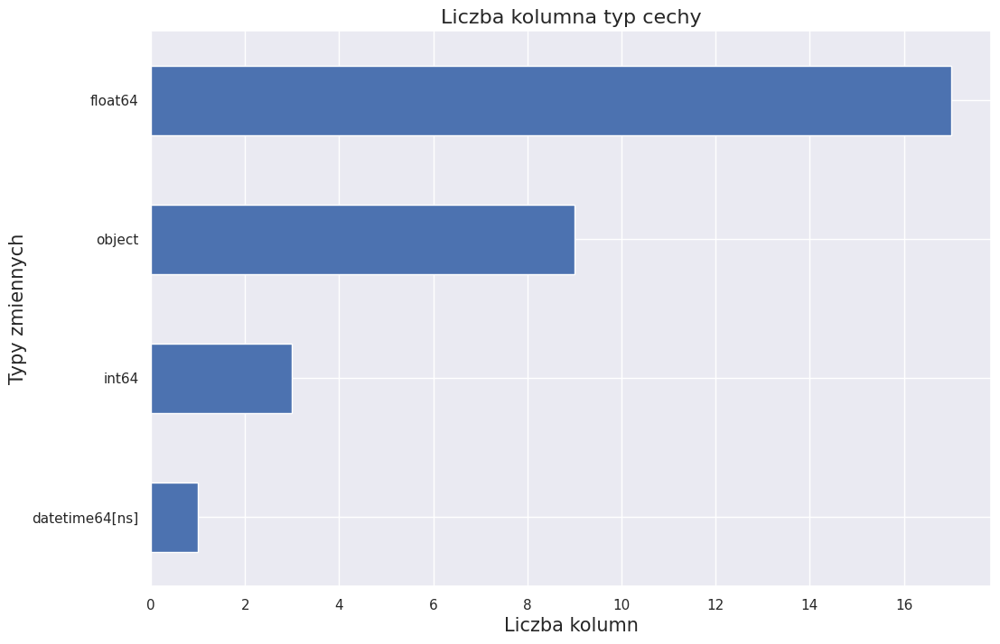

In [184]:
data_loan.dtypes.value_counts().sort_values().plot(kind='barh')
plt.title('Liczba kolumna typ cechy',fontsize=16)
plt.xlabel('Liczba kolumn',fontsize=15)
plt.ylabel('Typy zmiennych',fontsize=15)

In [185]:
data_loan.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

term                    2
sub_grade              35
home_ownership          5
verification_status     3
purpose                14
addr_state             50
fico_rating             4
loan_amnt_rating        7
interest_rating         3
dtype: int64

In [186]:
data_loan.shape

(42535, 30)

### Daty 

In [187]:
data_loan['issue_d']= pd.to_datetime(data_loan['issue_d']).apply(lambda x: int(x.strftime('%Y')))

In [188]:
print(data_loan.earliest_cr_line)

0        1985
1        1999
2        2001
3        1996
4        1996
         ... 
42531    2007
42532    2007
42533    2007
42534    2007
42535    2007
Name: earliest_cr_line, Length: 42535, dtype: int64


In [189]:
print(data_loan.issue_d)

0        2011
1        2011
2        2011
3        2011
4        2011
         ... 
42531    2007
42532    2007
42533    2007
42534    2007
42535    2007
Name: issue_d, Length: 42535, dtype: int64


### Po encodowaniu targetu do pytań z EDA

<AxesSubplot:xlabel='loan_status', ylabel='loan_amnt'>

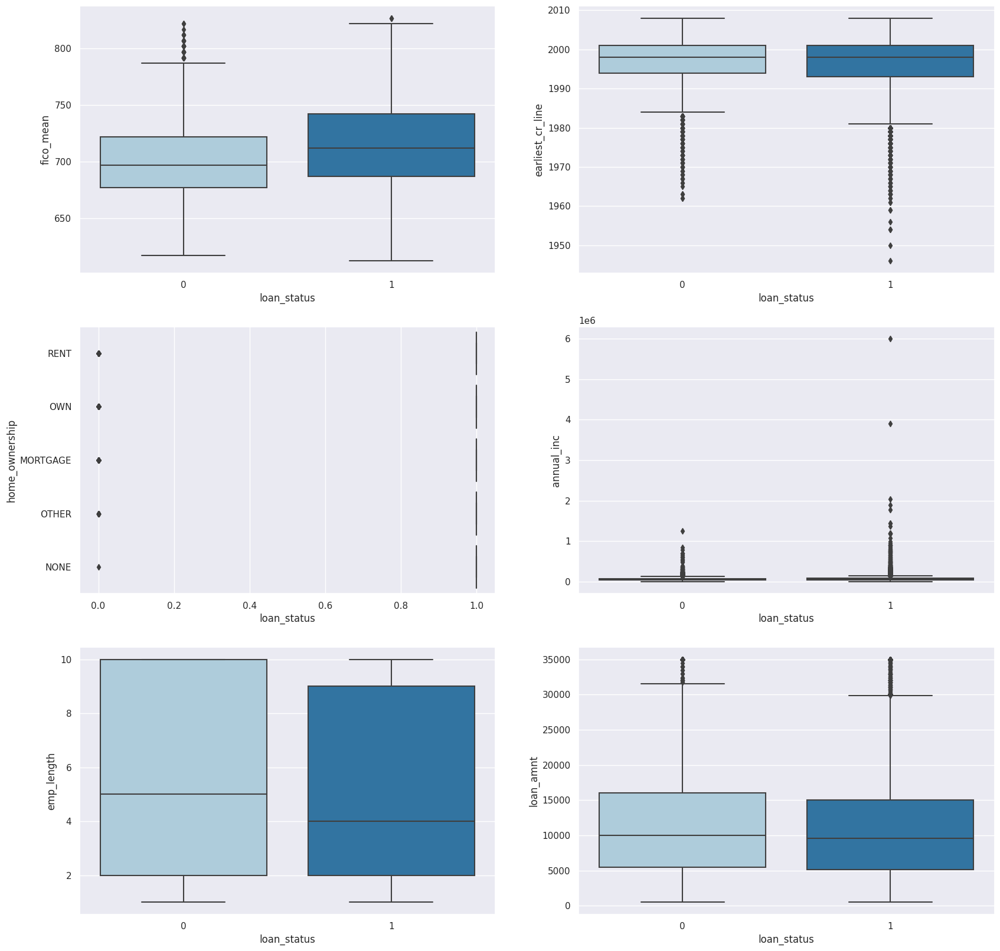

In [190]:
fig,axes = plt.subplots(3,2, figsize=(20,20))

sns.boxplot(y='fico_mean', x='loan_status', data=data_loan, ax=axes[0][0], palette="Paired")
sns.boxplot(y='earliest_cr_line', x='loan_status', data=data_loan, ax=axes[0][1], palette="Paired")
sns.boxplot(y='home_ownership', x='loan_status', data=data_loan, ax=axes[1][0], palette="Paired")
sns.boxplot(y='annual_inc', x='loan_status', data=data_loan, ax=axes[1][1], palette="Paired")
sns.boxplot(y='emp_length', x='loan_status', data=data_loan, ax=axes[2][0], palette="Paired")
sns.boxplot(y='loan_amnt', x='loan_status', data=data_loan, ax=axes[2][1], palette="Paired")

### Outliery wartości odstające

In [191]:
data_loan.describe().T

,count,mean,std,min,25%,50%,75%,max
loan_amnt,42535.0,11089.722581,7410.938391,500.00,5200.00,9700.00,15000.00,35000.00
funded_amnt,42535.0,10821.585753,7146.914675,500.00,5000.00,9600.00,15000.00,35000.00
int_rate,42535.0,12.165016,3.707936,5.42,9.63,11.99,14.72,24.59
installment,42535.0,322.623063,208.927216,15.67,165.52,277.69,428.18,1305.19
emp_length,42535.0,5.174821,3.458260,1.00,2.00,4.00,9.00,10.00
annual_inc,42535.0,69135.697217,64093.396996,1896.00,40000.00,59000.00,82500.00,6000000.00
issue_d,42535.0,2010.231456,0.966383,2007.00,2010.00,2011.00,2011.00,2011.00
loan_status,42535.0,0.848807,0.358241,0.00,1.00,1.00,1.00,1.00
dti,42535.0,13.373043,6.726315,0.00,8.20,13.47,18.68,29.99
delinq_2yrs,42535.0,0.152345,0.512247,0.00,0.00,0.00,0.00,13.00


### kopia data_loan i na niej szukam outlierów

In [192]:
data_outliers = data_loan.select_dtypes(exclude=['object']).copy()
                      
data_outliers

,loan_amnt,funded_amnt,int_rate,installment,emp_length,annual_inc,issue_d,loan_status,dti,delinq_2yrs,...,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,fico_mean,last_fico_mean
0,5000.0,5000.0,10.65,162.87,10,24000.0,2011,1,27.65,0.0,...,1.0,33.0,3.0,0.0,13648.0,83.7,9.0,0.0,737.0,737.0
1,2500.0,2500.0,15.27,59.83,1,30000.0,2011,0,1.00,0.0,...,5.0,33.0,3.0,0.0,1687.0,9.4,4.0,0.0,742.0,249.5
2,2400.0,2400.0,15.96,84.33,10,12252.0,2011,1,8.72,0.0,...,2.0,33.0,2.0,0.0,2956.0,98.5,10.0,0.0,737.0,737.0
3,10000.0,10000.0,13.49,339.31,10,49200.0,2011,1,20.00,0.0,...,1.0,35.0,10.0,0.0,5598.0,21.0,37.0,0.0,692.0,602.0
4,3000.0,3000.0,12.69,67.79,1,80000.0,2011,1,17.94,0.0,...,0.0,38.0,15.0,0.0,27783.0,53.9,38.0,0.0,697.0,682.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42531,3500.0,3500.0,10.28,113.39,1,180000.0,2007,1,10.00,0.0,...,0.0,33.0,7.0,0.0,0.0,49.7,20.0,0.0,687.0,817.0
42532,1000.0,1000.0,9.64,32.11,1,12000.0,2007,1,10.00,0.0,...,0.0,33.0,7.0,0.0,0.0,49.7,20.0,0.0,697.0,782.0
42533,2525.0,2525.0,9.33,80.69,1,110000.0,2007,1,10.00,0.0,...,0.0,33.0,7.0,0.0,0.0,49.7,20.0,0.0,712.0,712.0
42534,6500.0,6500.0,8.38,204.84,1,60000.0,2007,1,4.00,0.0,...,0.0,33.0,7.0,0.0,0.0,49.7,20.0,0.0,742.0,722.0


In [193]:
Q1 = data_outliers.quantile(0.25)
Q3 = data_outliers.quantile(0.75)
IQR = Q3 - Q1

data_outliers_amnt = pd.DataFrame({'Q1':Q1, 'Q3':Q3,'IQR':IQR, 'lower': Q1-1.5*IQR, 'upper': Q3+1.5*IQR,
                 'number of Outliers' : ((data_outliers < (Q1 - 1.5 * IQR)) | (data_outliers > (Q3 + 1.5 * IQR))).sum(),
                })

data_outliers_amnt

,Q1,Q3,IQR,lower,upper,number of Outliers
loan_amnt,5200.00,15000.00,9800.00,-9500.000,29700.000,1218
funded_amnt,5000.00,15000.00,10000.00,-10000.000,30000.000,691
int_rate,9.63,14.72,5.09,1.995,22.355,94
installment,165.52,428.18,262.66,-228.470,822.170,1393
emp_length,2.00,9.00,7.00,-8.500,19.500,0
annual_inc,40000.00,82500.00,42500.00,-23750.000,146250.000,2032
issue_d,2010.00,2011.00,1.00,2008.500,2012.500,2996
loan_status,1.00,1.00,0.00,1.000,1.000,6431
dti,8.20,18.68,10.48,-7.520,34.400,0
delinq_2yrs,0.00,0.00,0.00,0.000,0.000,4735


### data_outliers
Zamieniam outliery na wybranych kolumnach na mediany to będzie drugi zbiór do modelowania

In [194]:
data_outliers = data_outliers.drop(['loan_status', 'delinq_2yrs', 'pub_rec', 'pub_rec_bankruptcies', 'mths_since_last_delinq'], axis=1) 

In [195]:
for col_name in data_outliers.columns[:-1]:
    q1 = data_outliers[col_name].quantile(0.25)
    q3 = data_outliers[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    data_outliers.loc[(data_outliers[col_name] < low) | (data_outliers[col_name] > high), col_name] = data_outliers[col_name].median()

data_outliers.describe()

,loan_amnt,funded_amnt,int_rate,installment,emp_length,annual_inc,issue_d,dti,earliest_cr_line,inq_last_6mths,open_acc,revol_bal,revol_util,total_acc,fico_mean,last_fico_mean
count,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000
mean,10419.303515,10417.018926,12.140418,301.462641,5.174821,61079.341457,2010.456941,13.373043,1997.277654,0.958082,9.111014,10093.452216,49.118389,21.562713,715.044434,683.437275
std,6363.021099,6465.777909,3.671836,176.191735,3.458260,27639.749197,0.704607,6.726315,5.669066,1.161342,4.055111,8311.461260,28.334260,10.674648,36.176232,96.609100
min,500.000000,500.000000,5.420000,15.670000,1.000000,1896.000000,2009.000000,0.000000,1981.000000,0.000000,1.000000,0.000000,0.000000,1.000000,612.000000,0.000000
25%,5200.000000,5000.000000,9.630000,165.520000,2.000000,40000.000000,2010.000000,8.200000,1994.000000,0.000000,6.000000,3635.000000,25.800000,13.000000,687.000000,642.000000
50%,9700.000000,9600.000000,11.990000,277.690000,4.000000,59000.000000,2011.000000,13.470000,1998.000000,1.000000,9.000000,8821.000000,49.700000,20.000000,712.000000,697.000000
75%,14500.000000,14500.000000,14.650000,399.090000,9.000000,76000.000000,2011.000000,18.680000,2001.000000,2.000000,12.000000,14272.500000,72.600000,28.000000,742.000000,747.000000
max,29700.000000,30000.000000,22.350000,821.590000,10.000000,146000.000000,2011.000000,29.990000,2008.000000,5.000000,21.000000,37642.000000,119.000000,53.000000,822.000000,847.500000


### Korelacja na całym zbiorze data_loan

In [196]:
corr = data_loan.corr()
corr

,loan_amnt,funded_amnt,int_rate,installment,emp_length,annual_inc,issue_d,loan_status,dti,delinq_2yrs,...,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,fico_mean,last_fico_mean
loan_amnt,1.000000,0.981746,0.292346,0.930869,0.138589,0.276125,0.142493,-0.042582,0.065112,-0.032558,...,-0.029830,0.008160,0.176791,-0.051460,0.254293,0.065231,0.256958,-0.035277,0.133232,0.080111
funded_amnt,0.981746,1.000000,0.295154,0.956522,0.138117,0.272070,0.152112,-0.039602,0.064821,-0.033209,...,-0.029560,0.008930,0.174973,-0.052447,0.250313,0.068865,0.251163,-0.036591,0.125637,0.080217
int_rate,0.292346,0.295154,1.000000,0.271433,-0.012695,0.054377,0.006153,-0.200598,0.119607,0.154807,...,0.179730,-0.011536,0.024894,0.100456,0.081883,0.456247,-0.031538,0.084944,-0.702587,-0.282394
installment,0.930869,0.956522,0.271433,1.000000,0.108253,0.278342,0.072136,-0.021094,0.054948,-0.019894,...,-0.010414,-0.000512,0.175611,-0.045678,0.264837,0.094486,0.233939,-0.032499,0.064362,0.075866
emp_length,0.138589,0.138117,-0.012695,0.108253,1.000000,0.098776,0.148266,-0.019826,0.052880,0.009956,...,-0.021982,0.043536,0.088396,0.066808,0.116641,0.004615,0.199055,0.070377,0.100318,0.022608
annual_inc,0.276125,0.272070,0.054377,0.278342,0.098776,1.000000,0.012640,0.037988,-0.116519,0.022152,...,0.027747,0.001196,0.168060,-0.016344,0.283595,0.021377,0.246085,-0.014653,0.051989,0.065137
issue_d,0.142493,0.152112,0.006153,0.072136,0.148266,0.012640,1.000000,0.025840,0.074841,-0.024974,...,-0.222184,0.134174,0.005161,-0.019825,-0.052553,0.041302,0.058241,0.006514,0.100920,0.037954
loan_status,-0.042582,-0.039602,-0.200598,-0.021094,-0.019826,0.037988,0.025840,1.000000,-0.042198,-0.019508,...,-0.110917,0.006216,0.005923,-0.053770,-0.017186,-0.095320,0.021093,-0.050607,0.141917,0.440511
dti,0.065112,0.064821,0.119607,0.054948,0.052880,-0.116519,0.074841,-0.042198,1.000000,-0.036392,...,0.014637,0.036304,0.298104,-0.002718,0.190727,0.278660,0.241313,0.010149,-0.191153,-0.036380
delinq_2yrs,-0.032558,-0.033209,0.154807,-0.019894,0.009956,0.022152,-0.024974,-0.019508,-0.036392,1.000000,...,0.021012,-0.454644,0.014351,0.010352,-0.042928,-0.045811,0.068563,0.003201,-0.218525,-0.064530


Text(0.5, 1.0, 'Korelacja między numerycznymi cechami')

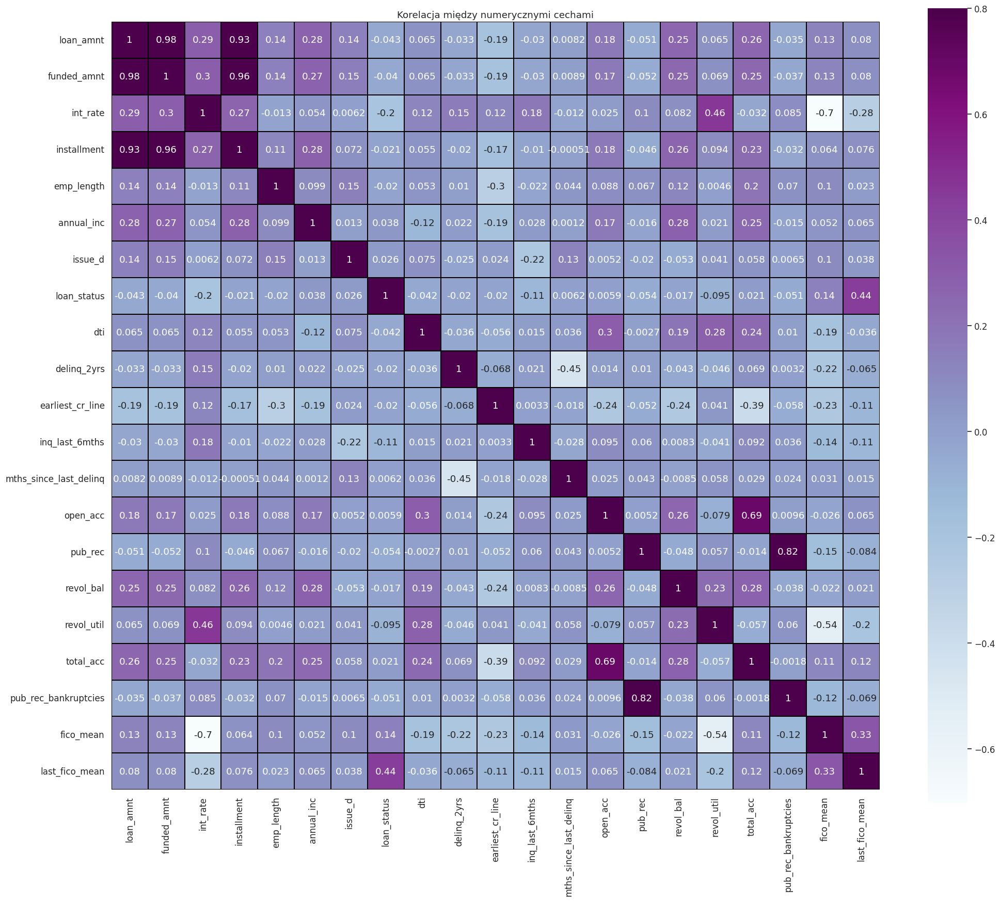

In [197]:
sns.set(font_scale=1.1)
plt.figure(figsize=(24, 20))

sns.heatmap(corr, vmax=.8, linewidths=0.01,
            square=True, annot=True, cmap="BuPu", linecolor="black")
plt.title('Korelacja między numerycznymi cechami')

#### UWAGA!!!
Linia nr 1 poniższego kodu: Tworzenie wykresu ``pairplot`` zajmuje bardzo dużo czsu. To jest tak ciężkie obliczeniowo, że mi się to w ogóle nie wykonywało i dlatego komętuję tworzenie wykresu ``pairplot``. Nie byłem w stanie wyświetlić wyników. Jest za dużo danych, Kernal ma problemy z obliczeniem tego i wyświetleniem wykresu. Zaniecham użycia parametru ``palette`` (zestaw kolorów do mapowania zmiennej ``hue``).

Linia nr 2: Ograniczyłem parametry wykresu ``pairplot`` tak jak poniżej, aby zwizualizować obliczenia i wyświetlić wykres ``pairplot``.

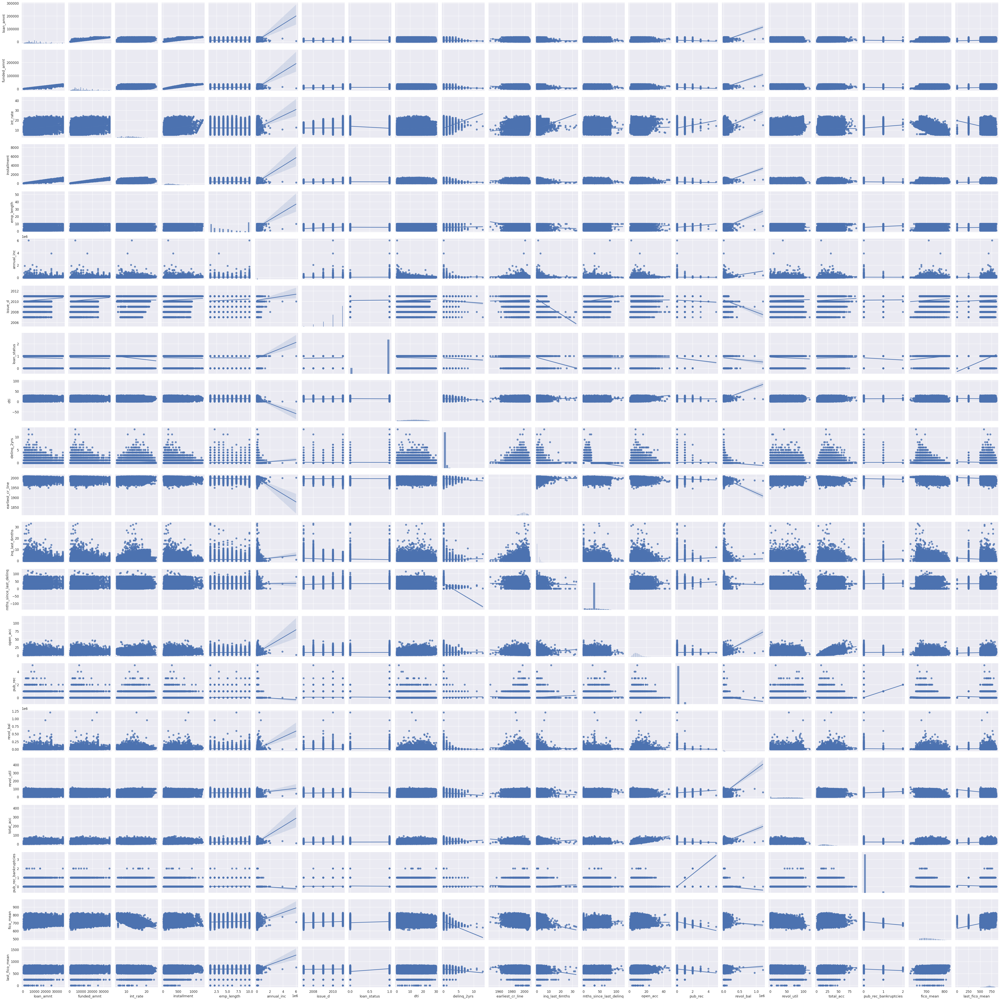

In [198]:
# sns.pairplot(data_loan, hue='loan_amnt', kind="reg", palette="husl")
sns.pairplot(data_loan, kind="reg")

### Korelacja wybranych cech - data_loan1

Ograniczam zakres danych, by przyjrzeć się wybranym cechom.

In [199]:
data_loan1=data_loan[['annual_inc','installment','int_rate','fico_mean',
                      'last_fico_mean','loan_amnt','revol_bal','open_acc','total_acc','loan_status']].copy()
cor1 = data_loan1.corr()
cor1

,annual_inc,installment,int_rate,fico_mean,last_fico_mean,loan_amnt,revol_bal,open_acc,total_acc,loan_status
annual_inc,1.000000,0.278342,0.054377,0.051989,0.065137,0.276125,0.283595,0.168060,0.246085,0.037988
installment,0.278342,1.000000,0.271433,0.064362,0.075866,0.930869,0.264837,0.175611,0.233939,-0.021094
int_rate,0.054377,0.271433,1.000000,-0.702587,-0.282394,0.292346,0.081883,0.024894,-0.031538,-0.200598
fico_mean,0.051989,0.064362,-0.702587,1.000000,0.328915,0.133232,-0.022011,-0.025763,0.110587,0.141917
last_fico_mean,0.065137,0.075866,-0.282394,0.328915,1.000000,0.080111,0.021390,0.065255,0.115398,0.440511
loan_amnt,0.276125,0.930869,0.292346,0.133232,0.080111,1.000000,0.254293,0.176791,0.256958,-0.042582
revol_bal,0.283595,0.264837,0.081883,-0.022011,0.021390,0.254293,1.000000,0.257941,0.275417,-0.017186
open_acc,0.168060,0.175611,0.024894,-0.025763,0.065255,0.176791,0.257941,1.000000,0.693154,0.005923
total_acc,0.246085,0.233939,-0.031538,0.110587,0.115398,0.256958,0.275417,0.693154,1.000000,0.021093
loan_status,0.037988,-0.021094,-0.200598,0.141917,0.440511,-0.042582,-0.017186,0.005923,0.021093,1.000000


Text(0.5, 1.0, 'Korelacja między wybranymi cechami')

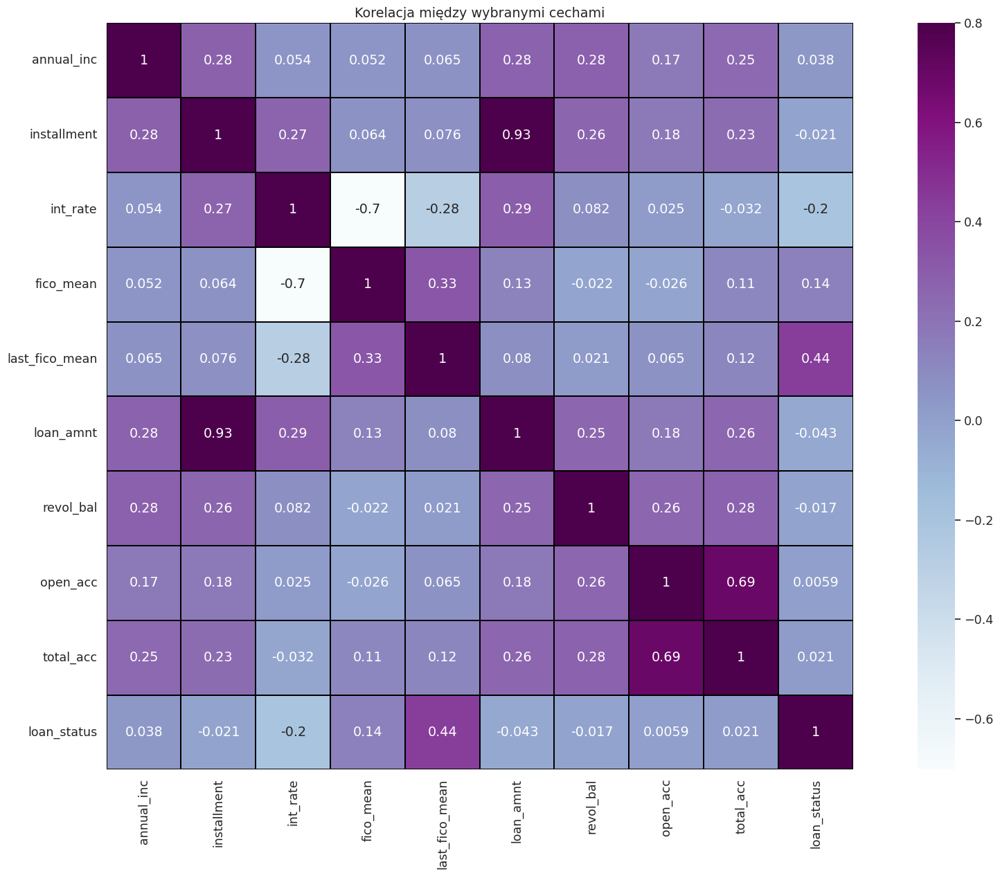

In [200]:
sns.set(font_scale=1.15)
plt.figure(figsize=(24, 14))

sns.heatmap(cor1, vmax=.8, linewidths=0.01,
            square=True, annot=True, cmap="BuPu", linecolor="black")
plt.title('Korelacja między wybranymi cechami')

### Korelacja X_2 na data_outliers uzupełnione medianą

In [201]:
cor2 = data_outliers.corr()
cor2

,loan_amnt,funded_amnt,int_rate,installment,emp_length,annual_inc,issue_d,dti,earliest_cr_line,inq_last_6mths,open_acc,revol_bal,revol_util,total_acc,fico_mean,last_fico_mean
loan_amnt,1.000000,0.931504,0.233275,0.833385,0.120300,0.346677,0.025309,0.072677,-0.192102,-0.016351,0.181054,0.331274,0.067966,0.237972,0.119228,0.083265
funded_amnt,0.931504,1.000000,0.261402,0.867878,0.127861,0.358465,0.054919,0.068695,-0.189354,-0.018798,0.180008,0.332837,0.070863,0.240615,0.115983,0.082703
int_rate,0.233275,0.261402,1.000000,0.216128,-0.012694,0.050727,-0.010814,0.119067,0.108040,0.159467,-0.025289,0.124785,0.453285,-0.050539,-0.701221,-0.282352
installment,0.833385,0.867878,0.216128,1.000000,0.100267,0.335973,0.011295,0.058989,-0.159064,-0.016310,0.166848,0.319037,0.082023,0.210132,0.077789,0.084409
emp_length,0.120300,0.127861,-0.012694,0.100267,1.000000,0.157171,0.096545,0.052880,-0.296823,-0.010632,0.094135,0.131292,0.004615,0.198047,0.100255,0.022608
annual_inc,0.346677,0.358465,0.050727,0.335973,0.157171,1.000000,0.017886,-0.060565,-0.296050,0.015040,0.260163,0.296958,0.049498,0.368997,0.079801,0.113134
issue_d,0.025309,0.054919,-0.010814,0.011295,0.096545,0.017886,1.000000,0.064778,0.029885,-0.092006,0.013579,0.022639,0.049733,0.025444,-0.018688,-0.022241
dti,0.072677,0.068695,0.119067,0.058989,0.052880,-0.060565,0.064778,1.000000,-0.065434,0.014595,0.300831,0.292305,0.278660,0.241489,-0.191053,-0.036380
earliest_cr_line,-0.192102,-0.189354,0.108040,-0.159064,-0.296823,-0.296050,0.029885,-0.065434,1.000000,0.000343,-0.225153,-0.238818,0.021145,-0.408107,-0.219894,-0.100403
inq_last_6mths,-0.016351,-0.018798,0.159467,-0.016310,-0.010632,0.015040,-0.092006,0.014595,0.000343,1.000000,0.081199,-0.024313,-0.040245,0.091070,-0.113209,-0.091100


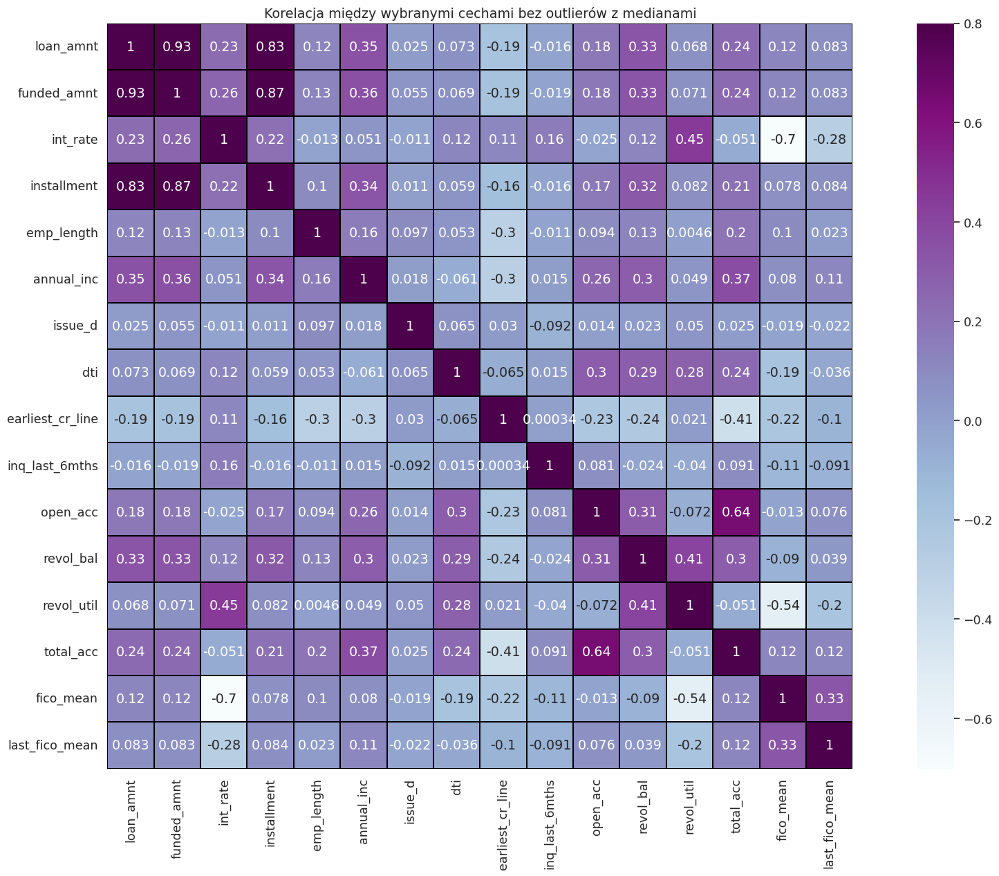

In [202]:
sns.set(font_scale=1.15)
plt.figure(figsize=(24, 14))

sns.heatmap(cor2, vmax=.8, linewidths=0.01,
            square=True, annot=True, cmap="BuPu", linecolor="black")
plt.title('Korelacja między wybranymi cechami bez outlierów z medianami');

#### UWAGA!!!
Linia nr 1 poniższego kodu: Tworzenie wykresu ``pairplot`` zajmuje bardzo dużo czsu. To jest tak ciężkie obliczeniowo, że mi się to w ogóle nie wykonywało i dlatego komętuję tworzenie wykresu ``pairplot``. Nie byłem w stanie wyświetlić wyników. Jest za dużo danych, Kernal ma problemy z obliczeniem tego i wyświetleniem wykresu. Zaniecham użycia parametru ``palette`` (zestaw kolorów do mapowania zmiennej ``hue``).

Linia nr 2: Ograniczyłem parametry wykresu ``pairplot`` tak jak poniżej, aby zwizualizować obliczenia i wyświetlić wykres ``pairplot``.

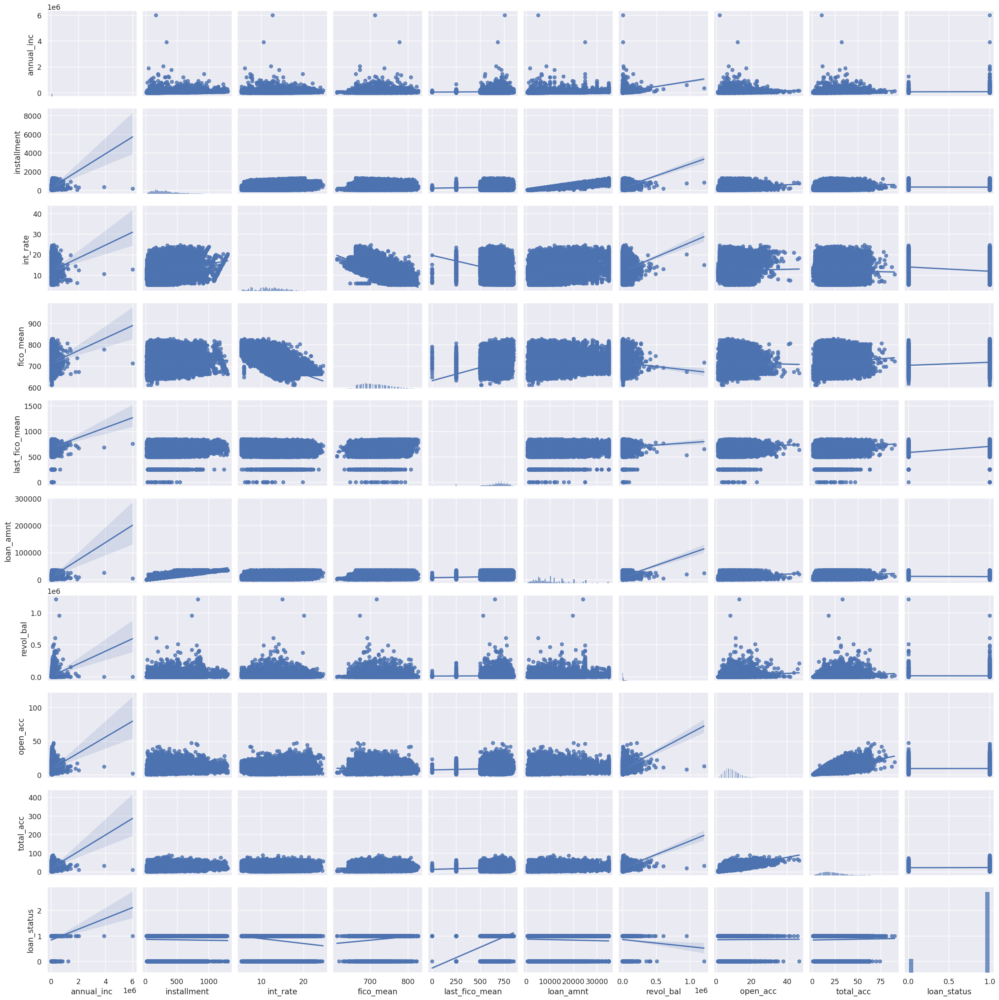

In [203]:
# sns.pairplot(data_loan1, hue='annual_inc', kind="reg", palette="husl")
sns.pairplot(data_loan1, kind="reg")

### Encodowanie zmiennych kategorycznych porządkowych: 
sub_grade, term i nowych: loan_amnt_rating, interest_rating, fico_rating

In [204]:
encoder = ce.OrdinalEncoder(cols=['sub_grade', 'term', 'loan_amnt_rating', 'interest_rating', 'fico_rating'])
data_loan = encoder.fit_transform(data_loan)
data_loan

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,home_ownership,annual_inc,verification_status,...,pub_rec,revol_bal,revol_util,total_acc,pub_rec_bankruptcies,fico_mean,last_fico_mean,fico_rating,loan_amnt_rating,interest_rating
0,5000.0,5000.0,1,10.65,162.87,1,10,RENT,24000.0,Verified,...,0.0,13648.0,83.7,9.0,0.0,737.0,737.0,1,1,1
1,2500.0,2500.0,2,15.27,59.83,2,1,RENT,30000.0,Source Verified,...,0.0,1687.0,9.4,4.0,0.0,742.0,249.5,2,2,2
2,2400.0,2400.0,1,15.96,84.33,3,10,RENT,12252.0,Not Verified,...,0.0,2956.0,98.5,10.0,0.0,737.0,737.0,1,2,2
3,10000.0,10000.0,1,13.49,339.31,4,10,RENT,49200.0,Source Verified,...,0.0,5598.0,21.0,37.0,0.0,692.0,602.0,1,3,1
4,3000.0,3000.0,2,12.69,67.79,5,1,RENT,80000.0,Source Verified,...,0.0,27783.0,53.9,38.0,0.0,697.0,682.0,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42531,3500.0,3500.0,1,10.28,113.39,4,1,RENT,180000.0,Not Verified,...,0.0,0.0,49.7,20.0,0.0,687.0,817.0,1,2,1
42532,1000.0,1000.0,1,9.64,32.11,14,1,RENT,12000.0,Not Verified,...,0.0,0.0,49.7,20.0,0.0,697.0,782.0,1,2,1
42533,2525.0,2525.0,1,9.33,80.69,13,1,RENT,110000.0,Not Verified,...,0.0,0.0,49.7,20.0,0.0,712.0,712.0,1,2,3
42534,6500.0,6500.0,1,8.38,204.84,18,1,NONE,60000.0,Not Verified,...,0.0,0.0,49.7,20.0,0.0,742.0,722.0,2,1,3


### Encodowanie pozostałych zmiennych kategorycznych One Hot Encoding

In [205]:
data_dummies = pd.get_dummies(data_loan)
data_dummies

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,loan_status,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,5000.0,5000.0,1,10.65,162.87,1,10,24000.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
1,2500.0,2500.0,2,15.27,59.83,2,1,30000.0,2011,0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,1,15.96,84.33,3,10,12252.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,1,13.49,339.31,4,10,49200.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
4,3000.0,3000.0,2,12.69,67.79,5,1,80000.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42531,3500.0,3500.0,1,10.28,113.39,4,1,180000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0
42532,1000.0,1000.0,1,9.64,32.11,14,1,12000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0
42533,2525.0,2525.0,1,9.33,80.69,13,1,110000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0
42534,6500.0,6500.0,1,8.38,204.84,18,1,60000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0


In [206]:
data_dummies.columns

Index(['loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'sub_grade', 'emp_length', 'annual_inc', 'issue_d', 'loan_status',
       'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'fico_mean',
       'last_fico_mean', 'fico_rating', 'loan_amnt_rating', 'interest_rating',
       'home_ownership_MORTGAGE', 'home_ownership_NONE',
       'home_ownership_OTHER', 'home_ownership_OWN', 'home_ownership_RENT',
       'verification_status_Not Verified',
       'verification_status_Source Verified', 'verification_status_Verified',
       'purpose_car', 'purpose_credit_card', 'purpose_debt_consolidation',
       'purpose_educational', 'purpose_home_improvement', 'purpose_house',
       'purpose_major_purchase', 'purpose_medical', 'purpose_moving',
       'purpose_other', 'purpose_renewable_energy', 'purpose_small_business',
       'purpose_va

In [207]:
data_dummies.dtypes

loan_amnt        float64
funded_amnt      float64
term               int64
int_rate         float64
installment      float64
                  ...   
addr_state_VT      uint8
addr_state_WA      uint8
addr_state_WI      uint8
addr_state_WV      uint8
addr_state_WY      uint8
Length: 98, dtype: object

In [208]:
cor = data_dummies.corr()
cor

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,loan_status,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
loan_amnt,1.000000,0.981746,0.355647,0.292346,0.930869,0.119626,0.138589,0.276125,0.142493,-0.042582,...,-0.007118,-0.011793,0.017900,0.000111,0.010004,-0.010225,-0.003873,0.000184,-0.003483,0.000242
funded_amnt,0.981746,1.000000,0.335137,0.295154,0.956522,0.115749,0.138117,0.272070,0.152112,-0.039602,...,-0.006992,-0.015116,0.016872,0.000063,0.011842,-0.010569,-0.002099,0.000458,-0.002075,0.000828
term,0.355647,0.335137,1.000000,0.428649,0.097614,0.190461,0.111158,0.043496,0.281890,-0.133646,...,0.003617,-0.016207,-0.011033,0.002065,0.002166,-0.004024,-0.007010,0.011548,0.005385,-0.006537
int_rate,0.292346,0.295154,0.428649,1.000000,0.271433,0.313232,-0.012695,0.054377,0.006153,-0.200598,...,-0.006738,-0.001938,0.002413,0.000201,0.005777,-0.008556,0.006209,0.000731,-0.005369,0.005543
installment,0.930869,0.956522,0.097614,0.271433,1.000000,0.102561,0.108253,0.278342,0.072136,-0.021094,...,-0.009050,-0.012582,0.020323,-0.000956,0.010888,-0.009995,0.000584,-0.002843,-0.005191,0.003201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
addr_state_VT,-0.010225,-0.010569,-0.004024,-0.008556,-0.009995,-0.000909,0.005953,-0.008894,0.002532,0.002903,...,-0.001455,-0.001005,-0.009936,-0.002971,-0.006972,1.000000,-0.005349,-0.004059,-0.002434,-0.001658
addr_state_WA,-0.003873,-0.002099,-0.007010,0.006209,0.000584,-0.000473,0.000559,-0.005645,0.003483,-0.004012,...,-0.005800,-0.004007,-0.039607,-0.011844,-0.027792,-0.005349,1.000000,-0.016181,-0.009703,-0.006611
addr_state_WI,0.000184,0.000458,0.011548,0.000731,-0.002843,0.000552,0.009861,-0.010436,-0.006541,0.000609,...,-0.004402,-0.003041,-0.030058,-0.008988,-0.021092,-0.004059,-0.016181,1.000000,-0.007364,-0.005017
addr_state_WV,-0.003483,-0.002075,0.005385,-0.005369,-0.005191,-0.009206,0.011335,-0.015449,0.006883,0.005231,...,-0.002639,-0.001823,-0.018025,-0.005390,-0.012648,-0.002434,-0.009703,-0.007364,1.000000,-0.003008


### Eksport plików do notebook-ów w celu wielokrotnego przetworzenia danych

In [209]:
data_loan.to_csv("data_loan.csv")

In [210]:
data_outliers.to_csv("data_outliers.csv")

In [211]:
data_dummies.to_csv("data_dummies.csv")

In [212]:
data_loan1.to_csv("data_loan1.csv")

# 4. Modelowanie
## a) PCA i klasteryzacja 

### Klasteryzacja bedzie robiona na zbiorze data_dummies

In [213]:
data_dummies.head()

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,loan_status,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,5000.0,5000.0,1,10.65,162.87,1,10,24000.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
1,2500.0,2500.0,2,15.27,59.83,2,1,30000.0,2011,0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,1,15.96,84.33,3,10,12252.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,1,13.49,339.31,4,10,49200.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
4,3000.0,3000.0,2,12.69,67.79,5,1,80000.0,2011,1,...,0,0,0,0,0,0,0,0,0,0


In [214]:
data_dummies.drop(['loan_status'], axis=1, inplace=True)

In [215]:
data_dummies.shape

(42535, 97)

In [216]:
data_dummies.head()

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,dti,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,5000.0,5000.0,1,10.65,162.87,1,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
1,2500.0,2500.0,2,15.27,59.83,2,1,30000.0,2011,1.00,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,1,15.96,84.33,3,10,12252.0,2011,8.72,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,1,13.49,339.31,4,10,49200.0,2011,20.00,...,0,0,0,0,0,0,0,0,0,0
4,3000.0,3000.0,2,12.69,67.79,5,1,80000.0,2011,17.94,...,0,0,0,0,0,0,0,0,0,0


In [217]:
scaler = StandardScaler()
scaler.fit(data_dummies)
data_dummies_std = scaler.transform(data_dummies)

### Przygotowanie zbioru do grupowania z PCA
- Zmniejszenie liczby wymiarów. 
- Usunięcie wartości ujemnych.
- Usunięcie skośności zmiennych. 
- Usuwanie ouliersów. 
- Skalowanie danych. 

#### Zmniejszenie liczby wymiarów

In [218]:
pca = IncrementalPCA(n_components=2)
data_dummies_pca = pca.fit_transform(data_dummies)
data_pca = pd.DataFrame(data_dummies_pca, columns = ['c1', 'c2'], index = data_dummies.index)

In [219]:
data_pca

,c1,c2
0,-45282.271425,3158.565432
1,-40786.620453,-9829.325366
2,-58279.298352,-6572.469319
3,-20803.384098,-6458.204225
4,11728.517628,10115.675027
...,...,...
42531,108047.180124,-28463.034380
42532,-58942.348408,-9764.908250
42533,38472.583043,-20656.666720
42534,-10916.473014,-13995.292702


In [220]:
colnames = list(data_dummies.columns)
data_pca1 = pd.DataFrame({'c1':pca.components_[0],'c2':pca.components_[1], 'Feature':colnames})

In [221]:
data_pca1

,c1,c2,Feature
0,3.368171e-02,1.186367e-01,loan_amnt
1,3.202302e-02,1.136052e-01,funded_amnt
2,3.275048e-07,1.681826e-06,term
3,3.460200e-06,2.094485e-05,int_rate
4,9.556052e-04,3.336930e-03,installment
...,...,...,...
92,-5.197144e-09,-1.065550e-08,addr_state_VT
93,-1.175526e-08,6.883287e-08,addr_state_WA
94,-1.736147e-08,2.939460e-08,addr_state_WI
95,-1.603709e-08,-1.764391e-08,addr_state_WV


In [222]:
data_pca.agg(['mean','median','std','min','max']).round(2)

,c1,c2
mean,0.00,0.00
median,-10743.68,-4325.41
std,64499.50,21068.50
min,-68905.31,-694589.37
max,5887602.48,1139657.99


/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """Entry point for launching an IPython kernel.


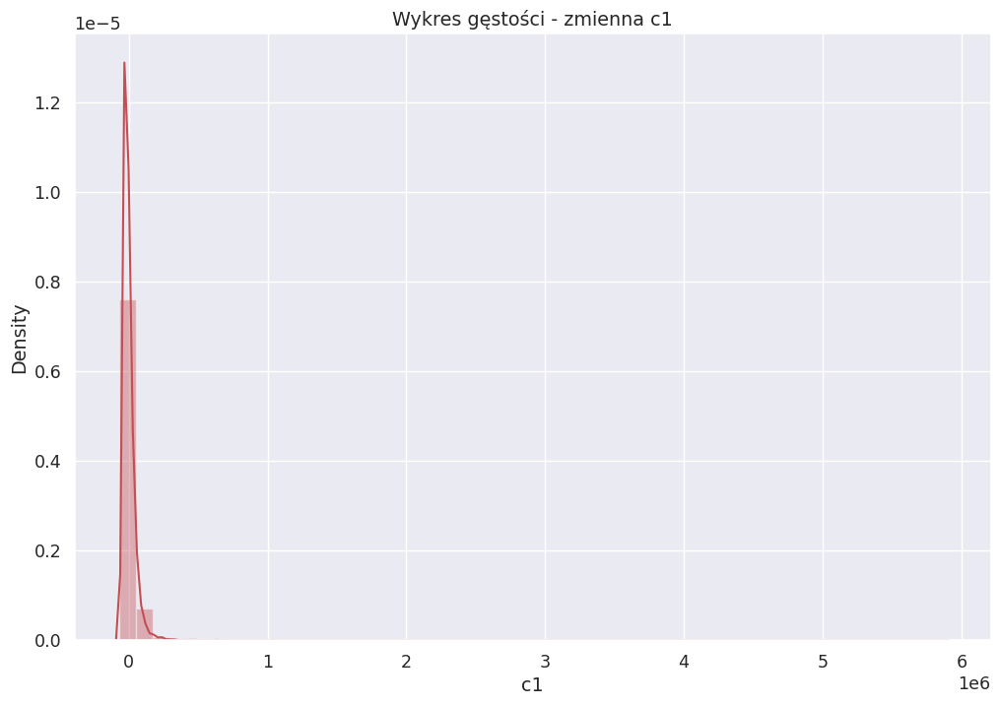

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  This is separate from the ipykernel package so we can avoid doing imports until


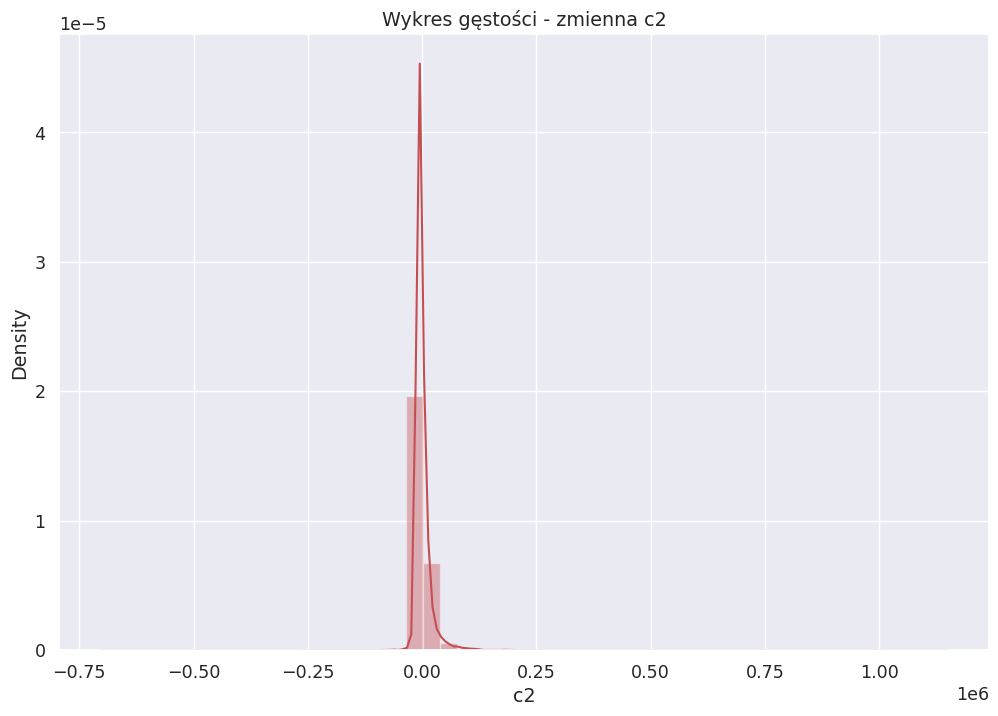

In [223]:
sns.distplot(data_pca.c1, color = 'r').set(title = 'Wykres gęstości - zmienna c1')
plt.show()
sns.distplot(data_pca.c2, color = 'r').set(title = 'Wykres gęstości - zmienna c2')
plt.show()

#### Usuwanie wartości ujemnych, przez dodanie modułu z min najmniejszej wartości i plus 1 

In [224]:
for col in data_pca:
    if data_pca[col].min() <= 0:
        data_pca[col] = data_pca[col] + np.abs(data_pca[col].min())+1

#### Usuwanie skośności 

In [225]:
data_pca = np.log(data_pca)

#### Usuwanie wartości odstających 

In [226]:
q1 = data_pca.quantile(0.25)
q3 = data_pca.quantile(0.75)
iqr = q3 - q1

low_boundary = (q1 - 1.5 * iqr)
upp_boundary = (q3 + 1.5 * iqr)
num_of_outliers_L = (data_pca[iqr.index] < low_boundary).sum()
num_of_outliers_U = (data_pca[iqr.index] > upp_boundary).sum()
outliers = pd.DataFrame({'lower_boundary':low_boundary, 'upper_boundary':upp_boundary,
                         'num_of_outliers__lower_boundary':num_of_outliers_L, 
                         'num_of_outliers__upper_boundary':num_of_outliers_U})

In [227]:
outliers

,lower_boundary,upper_boundary,num_of_outliers__lower_boundary,num_of_outliers__upper_boundary
c1,9.492173,12.425370,521,409
c2,13.409988,13.483962,188,2574


In [228]:
for row in outliers.iterrows():
    data_pca = data_pca[(data_pca[row[0]] >= row[1]['lower_boundary']) & (data_pca[row[0]] <= row[1]['upper_boundary'])]

In [229]:
scaler = StandardScaler()
scaler.fit(data_pca)
data_pca_std = scaler.transform(data_pca)
data_pca = pd.DataFrame(data=data_pca_std, index=data_pca.index, columns=data_pca.columns)

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  


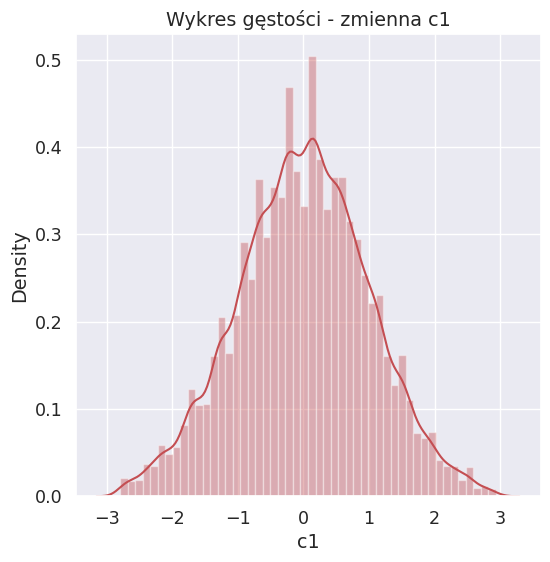

/home/marek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """


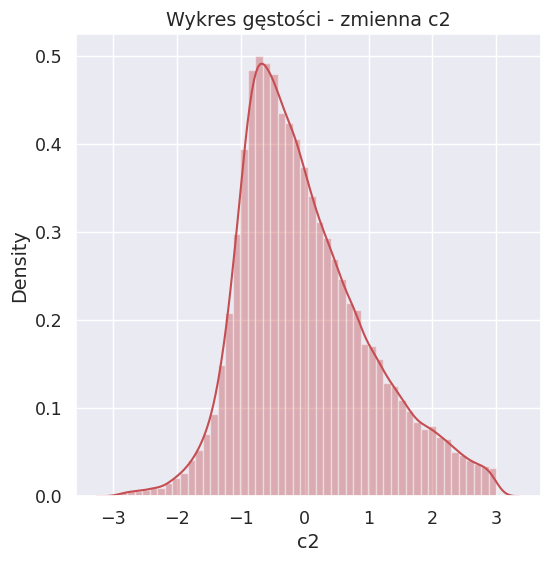

In [230]:
plt.figure(figsize = (6,6))
sns.distplot(data_pca.c1, color = 'r').set(title = 'Wykres gęstości - zmienna c1')
plt.show()
plt.figure(figsize = (6,6))
sns.distplot(data_pca.c2, color = 'r').set(title = 'Wykres gęstości - zmienna c2')
plt.show()

Jako, że hierarchiczna metoda klasteryzacji jest złożona obliczeniowo, ograniczam liczbę obserwacji do 1000. Wcześniej eksportuję plik po PCA do dalszej obróbki w notebooku modelowania. 

In [231]:
# ten plik ma 1000 próbek
data_pca = data_pca.sample(1000, random_state = 67)

<Figure size 2000x2000 with 0 Axes>

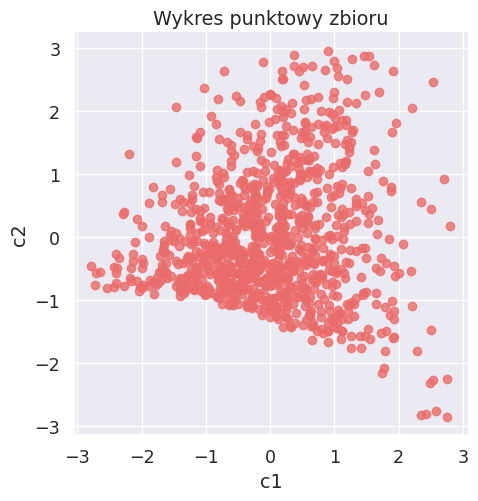

In [232]:
plt.figure(figsize = (20,20))
sns.lmplot(x='c1', y='c2', data = data_pca, scatter_kws={"color": "#eb6c6a"}, fit_reg=False).set(title = 'Wykres punktowy zbioru')
plt.show()

### Klastrowanie hierarchiczne metodą Warda

#### Metoda łączenia grup Warda w bibliotece sklearn. 

In [233]:
model_skl = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=6).fit(data_pca)

In [234]:
data_pca['Cluster_ID'] = model_skl.labels_

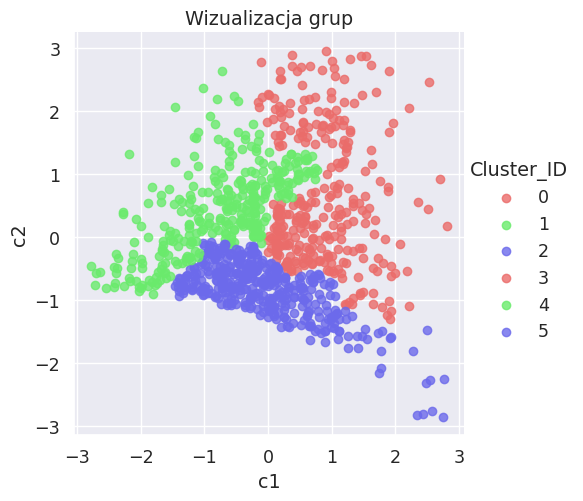

In [235]:
sns.lmplot(x='c1', y='c2', data = data_pca, hue = 'Cluster_ID', fit_reg=False, palette = ['#eb6c6a', '#6aeb6c', '#6c6aeb']).set(title='Wizualizacja grup')
plt.show()

#### Grupowanie z użyciem biblioteki SciPy

In [236]:
model_sci = linkage(data_pca.iloc[:,0:2], method = 'ward', metric = 'euclidean')

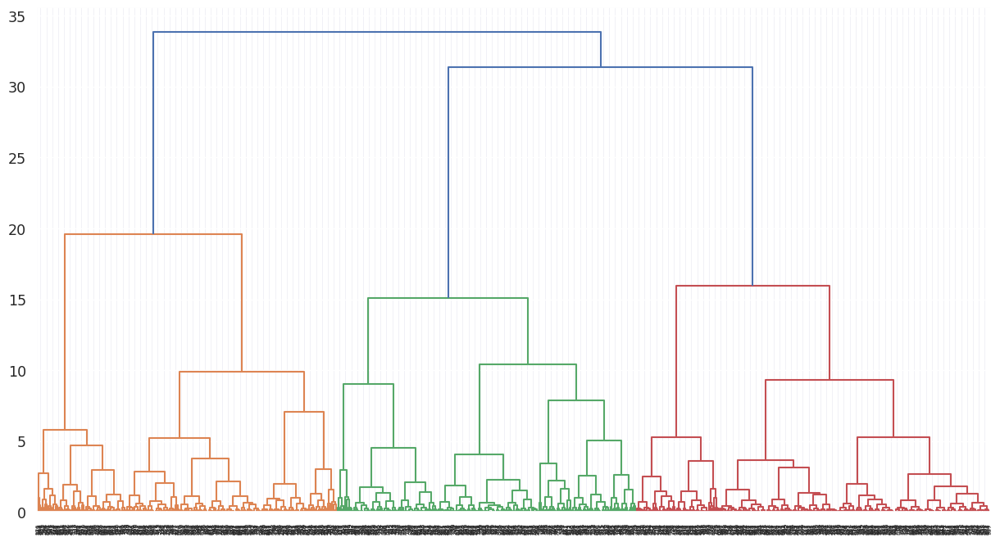

In [237]:
fig = plt.figure(figsize=(15, 8))
dn = dendrogram(model_sci)
plt.show()

Dzielenie obserwacji na grupy według maksymalnej liczby klastrów. 

In [238]:
clusters = fcluster(model_sci, 6, criterion='maxclust')
data_pca['Cluster_ID_2'] = clusters
clusters

array([2, 4, 4, 1, 5, 4, 2, 6, 2, 2, 1, 3, 6, 3, 6, 4, 4, 2, 4, 6, 2, 6,
       4, 5, 4, 6, 6, 1, 2, 6, 5, 2, 5, 4, 4, 6, 3, 5, 4, 2, 6, 3, 3, 5,
       2, 2, 4, 4, 2, 4, 4, 2, 6, 3, 6, 1, 5, 2, 5, 6, 4, 6, 6, 4, 3, 2,
       6, 2, 5, 2, 5, 4, 6, 3, 5, 3, 4, 4, 2, 2, 1, 6, 2, 1, 6, 4, 2, 5,
       2, 2, 3, 3, 6, 4, 5, 6, 6, 4, 6, 6, 2, 2, 2, 6, 4, 6, 2, 3, 6, 6,
       5, 4, 4, 2, 4, 2, 5, 3, 2, 2, 2, 1, 4, 4, 3, 6, 5, 4, 3, 2, 5, 4,
       6, 4, 6, 4, 6, 2, 6, 5, 6, 6, 3, 2, 5, 2, 5, 2, 2, 4, 1, 4, 3, 4,
       3, 6, 1, 5, 5, 3, 1, 2, 4, 6, 2, 6, 4, 4, 3, 6, 4, 2, 1, 4, 5, 6,
       2, 3, 6, 2, 4, 3, 6, 6, 4, 4, 1, 6, 5, 2, 2, 4, 4, 3, 3, 2, 4, 2,
       5, 5, 3, 1, 6, 6, 6, 6, 6, 2, 2, 1, 6, 6, 4, 4, 2, 5, 6, 2, 3, 6,
       5, 6, 4, 4, 2, 2, 2, 5, 1, 2, 6, 6, 1, 6, 3, 6, 4, 4, 5, 4, 2, 1,
       6, 4, 6, 3, 3, 6, 4, 6, 2, 6, 4, 6, 6, 1, 6, 4, 1, 6, 2, 3, 4, 3,
       6, 3, 3, 6, 4, 6, 5, 6, 2, 5, 3, 5, 6, 6, 4, 2, 2, 4, 6, 2, 2, 6,
       5, 4, 2, 5, 3, 5, 3, 6, 1, 4, 2, 6, 3, 4, 4,

<Figure size 2000x2000 with 0 Axes>

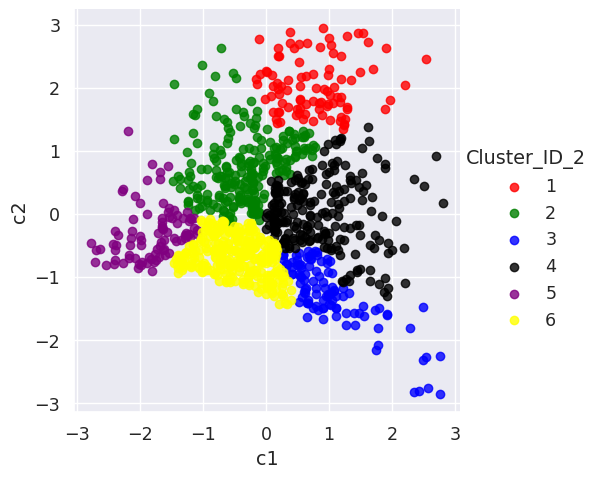

In [239]:
plt.figure(figsize = (20,20))
sns.lmplot(x='c1', y='c2', data = data_pca, fit_reg=False, hue = 'Cluster_ID_2', palette = ['red', 'green', 'blue', 'black', 'purple', 'yellow'])
plt.show()

W obu metodach są takie same wyniki. 

### DBSCAN
Na pliku data_pca po PCA

In [240]:
clt = DBSCAN(eps=0.5, metric='euclidean', min_samples=5, n_jobs=-1)
model = clt.fit(data_pca)

In [241]:
data_pca['Clasters'] = model.labels_

In [242]:
model.labels_

array([ 0,  1,  1,  2,  3,  1,  0,  4,  0,  0,  2,  5,  4,  5,  4,  1,  1,
        0,  1,  4,  0,  4,  1,  3,  1,  4,  4,  2,  0,  4,  3,  0,  3,  1,
        1,  4,  5,  3,  1,  0,  4,  5,  5,  3,  0,  0,  1,  1,  0,  1,  1,
        0,  4,  5,  4,  2,  3,  0,  3,  4,  1,  4,  4,  1,  5,  0,  4,  0,
        3,  0,  3, -1,  4,  5,  3,  6,  1,  1,  0,  0,  2,  4,  0,  2,  4,
       -1,  0,  3,  0,  0,  5,  5,  4,  1,  3,  4,  4,  1,  4,  4,  0,  0,
        0,  4,  1,  4,  0,  5,  4,  4,  3,  1,  1,  0,  1,  0,  3,  5,  0,
        0,  0,  2,  1,  1,  5,  4,  3,  1,  5,  0,  3,  1,  4,  1,  4,  1,
        4,  0,  4,  3,  4,  4,  5,  0,  3,  0,  3,  0,  0,  1,  2,  1,  5,
        1,  5,  4,  2,  3,  3,  6,  2,  0,  1,  4,  0,  4,  1,  1,  5,  4,
        1,  0,  2,  1,  3,  4,  0,  5,  4,  0,  1,  5,  4,  4,  1,  1,  2,
        4,  3,  0,  0,  1,  1,  5,  5,  0,  1,  0,  3,  3,  5,  2,  4,  4,
        4,  4,  4,  0,  0,  2,  4,  4,  1,  1,  0,  3,  4,  0,  5,  4,  3,
        4,  1,  1,  0,  0

In [243]:
data_pca.shape

(1000, 5)

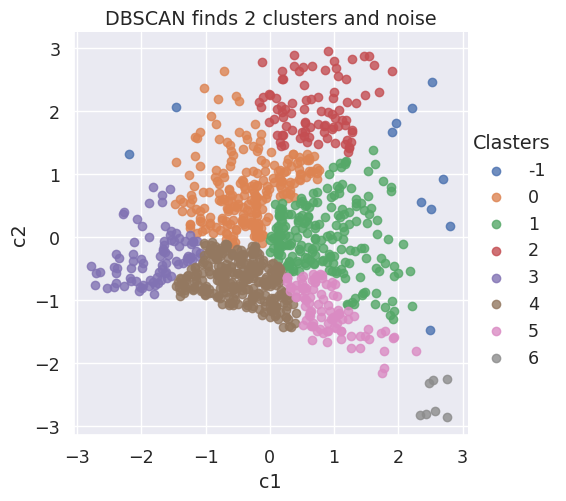

In [244]:
sns.lmplot(x='c1', y='c2', data=data_pca, fit_reg=False, hue = 'Clasters' )
plt.title('DBSCAN finds 2 clusters and noise')
plt.show()

### Klasteryzacja KMeans na pliku data_dummies, bez PCA

In [245]:
data_dummies1 = pd.read_csv('data_dummies.csv')
data_dummies1.drop(['loan_status', 'Unnamed: 0'], axis=1, inplace=True)
data_dummies1

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,dti,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,5000.0,5000.0,1,10.65,162.87,1,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
1,2500.0,2500.0,2,15.27,59.83,2,1,30000.0,2011,1.00,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,1,15.96,84.33,3,10,12252.0,2011,8.72,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,1,13.49,339.31,4,10,49200.0,2011,20.00,...,0,0,0,0,0,0,0,0,0,0
4,3000.0,3000.0,2,12.69,67.79,5,1,80000.0,2011,17.94,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42530,3500.0,3500.0,1,10.28,113.39,4,1,180000.0,2007,10.00,...,0,0,0,0,0,0,0,0,0,0
42531,1000.0,1000.0,1,9.64,32.11,14,1,12000.0,2007,10.00,...,0,0,0,0,0,0,0,0,0,0
42532,2525.0,2525.0,1,9.33,80.69,13,1,110000.0,2007,10.00,...,0,0,0,0,0,0,0,0,0,0
42533,6500.0,6500.0,1,8.38,204.84,18,1,60000.0,2007,4.00,...,0,0,0,0,0,0,0,0,0,0


In [246]:
scaler = StandardScaler()
scaler.fit(data_dummies1)
data_dummies1_std = scaler.transform(data_dummies1)

In [247]:
kmeans = KMeans(n_clusters=5, max_iter=1000)
kmeans.fit(data_dummies1)

KMeans(max_iter=1000, n_clusters=5)

In [248]:
kmeans.labels_

array([0, 0, 0, ..., 1, 0, 0], dtype=int32)

### Sprawdzamy dwie metody, ile klastrów powinniśmy zastosować

#### Metoda łokcia

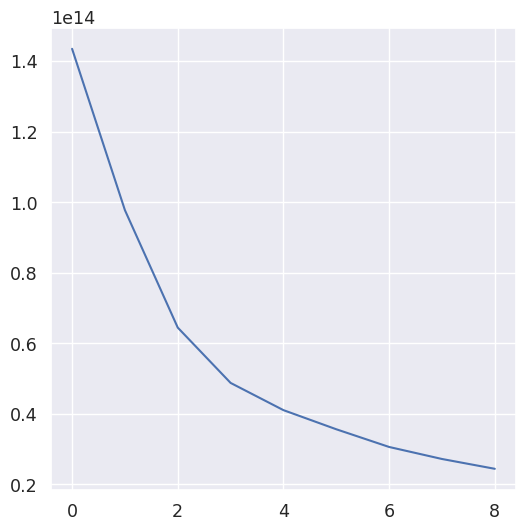

In [249]:
plt.figure(figsize = (6, 6))
ssd = [] 
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    kmeans.fit(data_dummies1)
    
    ssd.append(kmeans.inertia_) 
    
plt.plot(ssd)

#### Miara wewnętrzna - wskaźnik sylwetkowy

In [250]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for num_clusters in range_n_clusters:
    
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    kmeans.fit(data_dummies1)
    
    cluster_labels = kmeans.labels_
    
    silhouette_avg = silhouette_score(data_dummies1, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.6777985829506518
For n_clusters=3, the silhouette score is 0.642437382610893
For n_clusters=4, the silhouette score is 0.5740106412537487
For n_clusters=5, the silhouette score is 0.47395065385078344
For n_clusters=6, the silhouette score is 0.4067249771604606
For n_clusters=7, the silhouette score is 0.391145726670524
For n_clusters=8, the silhouette score is 0.39174004005798213
For n_clusters=9, the silhouette score is 0.3534106136332804
For n_clusters=10, the silhouette score is 0.35422496465059017


#### W pobliżu k=7 się praktycznie stabilizuje, zaczyna się wypłaszczać przy k=4. Przyjmuję poniżej k=4

In [251]:
kmeans = KMeans(n_clusters = 4, max_iter=1000, random_state=42)
kmeans.fit(data_dummies1)

KMeans(max_iter=1000, n_clusters=4, random_state=42)

In [252]:
kmeans.labels_

array([0, 0, 0, ..., 2, 0, 0], dtype=int32)

In [253]:
data_dummies1['K-Means_Cluster_ID'] = kmeans.labels_

In [254]:
data_dummies1.sample(20)

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,dti,...,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY,K-Means_Cluster_ID
26158,8000.0,8000.0,2,17.93,202.85,28,4,60000.0,2010,19.14,...,0,1,0,0,0,0,0,0,0,0
28741,18000.0,18000.0,1,10.75,587.17,1,1,30996.0,2010,11.30,...,0,1,0,0,0,0,0,0,0,0
12505,7000.0,7000.0,1,13.99,239.21,9,10,58800.0,2011,22.22,...,0,0,0,0,0,0,0,0,0,0
11041,3200.0,3200.0,1,14.79,110.61,2,1,23040.0,2011,5.57,...,0,0,0,0,0,0,0,0,0,0
36532,3500.0,3500.0,1,13.16,118.20,9,1,18720.0,2009,20.83,...,0,0,0,0,0,0,0,0,0,0
3505,20000.0,20000.0,1,11.71,661.52,13,1,70000.0,2011,14.52,...,0,0,0,0,0,0,0,0,0,0
5439,3675.0,3675.0,1,10.65,119.71,1,1,45000.0,2011,16.72,...,0,0,0,0,0,0,0,0,0,0
5315,12000.0,12000.0,1,12.42,400.99,14,4,41600.0,2011,13.64,...,0,0,0,0,0,0,0,0,0,0
25187,3000.0,3000.0,1,11.86,99.45,5,10,30000.0,2010,19.36,...,0,0,0,0,0,0,0,0,0,0
9611,29900.0,24475.0,2,13.49,563.04,15,4,93996.0,2011,27.92,...,0,0,0,0,0,0,0,0,0,2


<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='loan_amnt'>

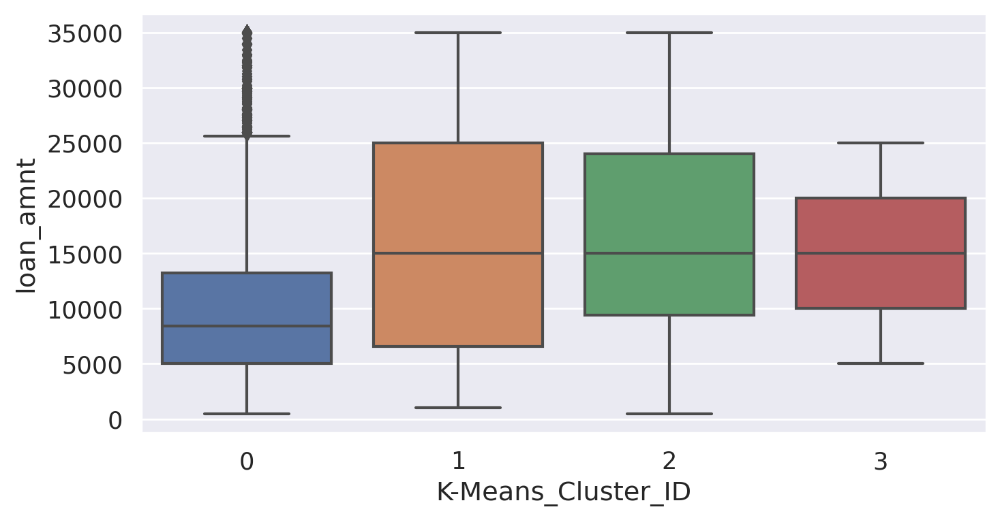

In [255]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='loan_amnt', data=data_dummies1)

### Wniosek:
W klastrze nr 1 jest najwięcej pożyczek od 7 tys do 25 tys. Niższe pozyczki są w klastrze 0. 

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='int_rate'>

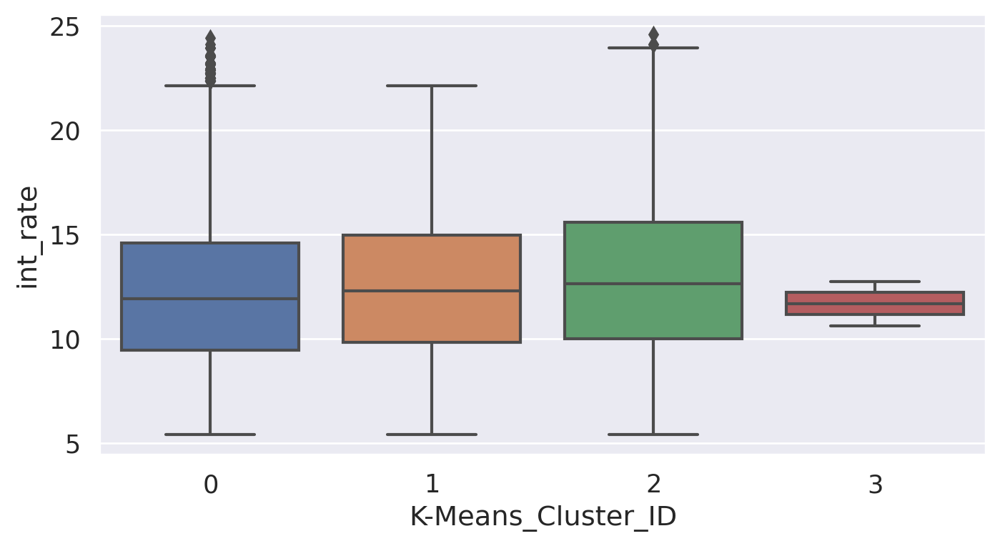

In [256]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='int_rate', data=data_dummies1)

### Wnioski:
W tym wypadku własciwie klastry się "zawierają w sobie" co do wysokości oprocentowania.

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='emp_length'>

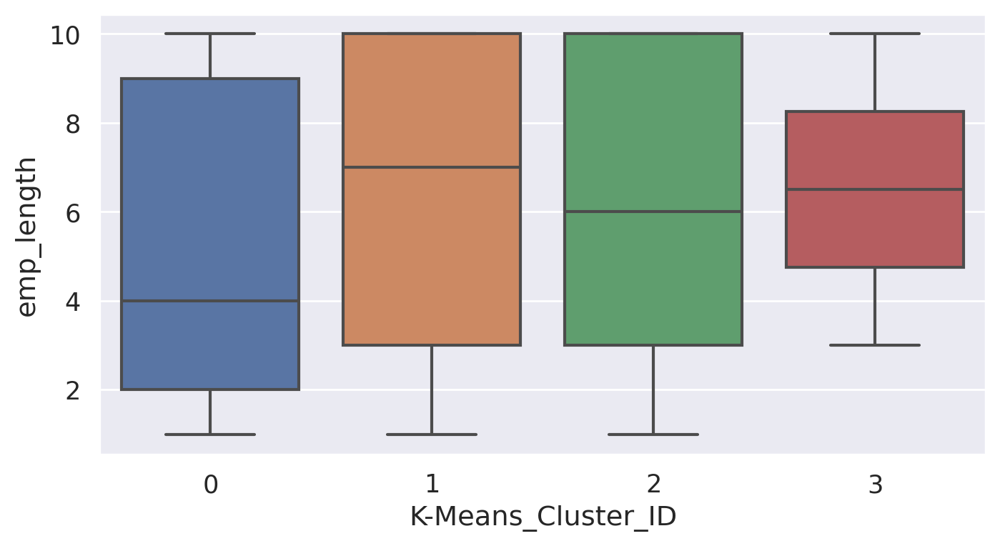

In [257]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='emp_length', data=data_dummies1)

### Wnioski:
Grupa pożyzckobiorców 5-9 lat została wrzucona do wszystkich klastrów, ale już ci z najniższym stażem pracy są w klastrze 0. 

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='annual_inc'>

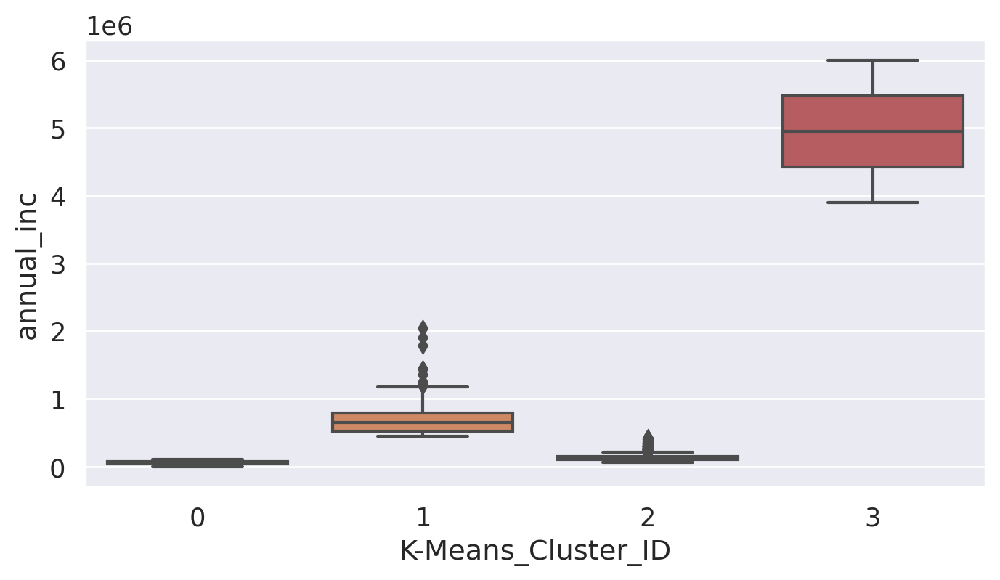

In [258]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='annual_inc', data=data_dummies1)

### Wnioski:
Pożyczkobiorcy z najwyższym dochodem zostali wrzuceni do grupy 3. 

## 4. b) Modelowanie dla różnych algorytmów
### Model na całym zbiorze - data_dummies

In [259]:
# wczytuje dane z poprzedniej części
data_dummies = pd.read_csv('data_dummies.csv')
data_dummies.drop('Unnamed: 0', axis=1, inplace=True)
data_dummies

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,loan_status,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,5000.0,5000.0,1,10.65,162.87,1,10,24000.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
1,2500.0,2500.0,2,15.27,59.83,2,1,30000.0,2011,0,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,1,15.96,84.33,3,10,12252.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,1,13.49,339.31,4,10,49200.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
4,3000.0,3000.0,2,12.69,67.79,5,1,80000.0,2011,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42530,3500.0,3500.0,1,10.28,113.39,4,1,180000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0
42531,1000.0,1000.0,1,9.64,32.11,14,1,12000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0
42532,2525.0,2525.0,1,9.33,80.69,13,1,110000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0
42533,6500.0,6500.0,1,8.38,204.84,18,1,60000.0,2007,1,...,0,0,0,0,0,0,0,0,0,0


In [260]:
data_dummies.columns

Index(['loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'sub_grade', 'emp_length', 'annual_inc', 'issue_d', 'loan_status',
       'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'fico_mean',
       'last_fico_mean', 'fico_rating', 'loan_amnt_rating', 'interest_rating',
       'home_ownership_MORTGAGE', 'home_ownership_NONE',
       'home_ownership_OTHER', 'home_ownership_OWN', 'home_ownership_RENT',
       'verification_status_Not Verified',
       'verification_status_Source Verified', 'verification_status_Verified',
       'purpose_car', 'purpose_credit_card', 'purpose_debt_consolidation',
       'purpose_educational', 'purpose_home_improvement', 'purpose_house',
       'purpose_major_purchase', 'purpose_medical', 'purpose_moving',
       'purpose_other', 'purpose_renewable_energy', 'purpose_small_business',
       'purpose_va

### Train Test Split

In [261]:
X = data_dummies.drop('loan_status',axis=1) 
#target
Y = data_dummies['loan_status']

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

### Skalowanie 

In [262]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_test 

array([[-0.95313026, -0.95140853, -0.59377133, ..., -0.10937932,
        -0.06622215, -0.0456804 ],
       [-1.22287358, -1.23096153, -0.59377133, ..., -0.10937932,
        -0.06622215, -0.0456804 ],
       [ 0.12584299, -0.31891988, -0.59377133, ..., -0.10937932,
        -0.06622215, -0.0456804 ],
       ...,
       [ 0.28768898,  0.33453524, -0.59377133, ..., -0.10937932,
        -0.06622215, -0.0456804 ],
       [ 0.66532962,  0.72590943,  1.68415002, ..., -0.10937932,
        -0.06622215, -0.0456804 ],
       [ 0.12584299,  0.16680344, -0.59377133, ..., -0.10937932,
        -0.06622215, -0.0456804 ]])

### Logistic Regression

In [263]:
log = LogisticRegression()
log.fit(X_train, y_train)

log_pred = log.predict(X_test)
    
# Summary of the prediction
print(classification_report(y_test, log_pred))
print(confusion_matrix(y_test, log_pred))

# Accuracy
print('Training accuracy:', log.score(X_train, y_train))
print('Test accuracy:', log.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.68      0.22      0.34      1978
           1       0.87      0.98      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.77      0.60      0.63     12761
weighted avg       0.84      0.86      0.83     12761

[[  443  1535]
 [  213 10570]]
Training accuracy: 0.8655874252703701
Test accuracy: 0.863020139487501


In [264]:
auroc_log = roc_auc_score(y_test, log_pred)
print('AUROC =', auroc_log)

AUROC = 0.6021051420958372


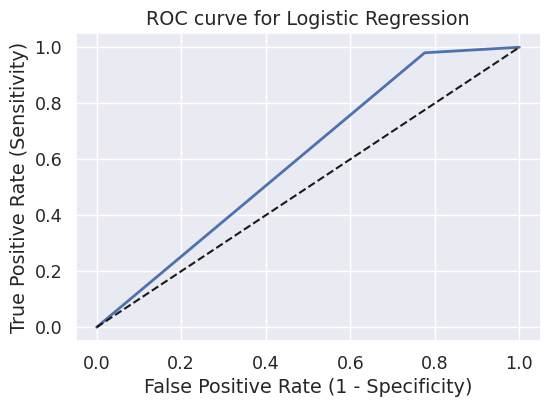

In [265]:
fpr, tpr, thresholds = roc_curve(y_test, log_pred)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for Logistic Regression')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Logistic Regression z regularyzacją - 5 parametrów

In [266]:
C = [.001, .01, 10, 100, 1000]

for c in C:
    log1 = LogisticRegression(penalty='l1', C=c, solver='liblinear')
    log1.fit(X_train, y_train)
    
    log1_pred = log1.predict(X_test)
    
    # Summary of the prediction
    print(classification_report(y_test, log1_pred))
    print(confusion_matrix(y_test, log1_pred))
    print('')
    print('C:', c)
    # Accuracy
    # print('Coefficient of each feature:', log1.coef_)
    print('Training accuracy:', log1.score(X_train, y_train))
    print('Test accuracy:', log1.score(X_test, y_test))
    print('')
    auroc_lrc = roc_auc_score(y_test, log1_pred)
    print('AUROC =', auroc_lrc)
    print('')

              precision    recall  f1-score   support

           0       0.66      0.08      0.14      1978
           1       0.85      0.99      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.75      0.53      0.53     12761
weighted avg       0.82      0.85      0.80     12761

[[  150  1828]
 [   79 10704]]

C: 0.001
Training accuracy: 0.8552764156646738
Test accuracy: 0.8505603009168561

AUROC = 0.5342539144537797

              precision    recall  f1-score   support

           0       0.68      0.19      0.29      1978
           1       0.87      0.98      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.78      0.59      0.61     12761
weighted avg       0.84      0.86      0.83     12761

[[  371  1607]
 [  171 10612]]

C: 0.01
Training accuracy: 0.8638745213945053
Test accuracy: 0.8606692265496434

AUROC = 0.5858524498407645

              precision    recall  f1-score   support

        

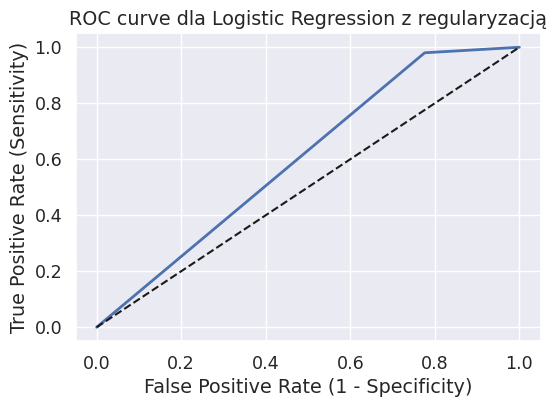

In [267]:
fpr, tpr, thresholds = roc_curve(y_test, log1_pred)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve dla Logistic Regression z regularyzacją')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Decision Tree

Pierwotnie dla max_depth = None głębokość wyszła 37 
wyniki: 
- max_depth = 37: {'f1-score': 0.89, 'accuracy': 0.81}
- max_depth = 30: {'f1-score': 0.89, 'accuracy': 0.81} 
- max_depth = 10: {'f1-score': 0.91, 'accuracy': 0.85}
- max_depth = 6: {'f1-score': 0.92, 'accuracy': 0.86}
- max_depth = 2: {'f1-score': 0.92, 'accuracy': 0.86} zostawiam na wartości 2. 

In [268]:
dtree = DecisionTreeClassifier(max_depth = 2, random_state = 0)

In [269]:
dtree.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 2,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 0,
 'splitter': 'best'}

In [270]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=2, random_state=0)

In [271]:
def evaluate(prediction,y_test): 
    result = classification_report(y_test,prediction,output_dict=True)
    f1 = result['1']['f1-score']
    accuracy = result['accuracy']
    performance_data= {'f1-score':round(f1, 2),
                      'accuracy':round(accuracy, 2)}
    return performance_data

In [272]:
dt_prediction = dtree.predict(X_test)

In [273]:
dtree_pr = evaluate(dt_prediction,y_test)
dtree_pr

# Summary of the prediction
print(classification_report(y_test, dt_prediction))
print(confusion_matrix(y_test, dt_prediction))
# Accuracy
print('Training accuracy:', dtree.score(X_train, y_train))
print('Test accuracy:', dtree.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.56      0.32      0.41      1978
           1       0.88      0.95      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.72      0.64      0.66     12761
weighted avg       0.83      0.86      0.84     12761

[[  632  1346]
 [  504 10279]]
Training accuracy: 0.8585342916638679
Test accuracy: 0.8550270354987853


In [274]:
auroc_dtree = roc_auc_score(y_test, dt_prediction)
print('AUROC =', auroc_dtree)

AUROC = 0.6363872110042519


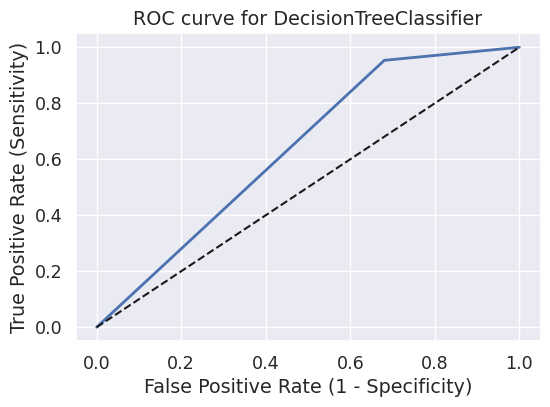

In [275]:
fpr, tpr, thresholds = roc_curve(y_test, dt_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for DecisionTreeClassifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

[Text(0.5, 0.8333333333333334, 'X[21] <= -0.3\ngini = 0.254\nsamples = 29774\nvalue = [4453, 25321]'),
 Text(0.25, 0.5, 'X[2] <= 0.545\ngini = 0.476\nsamples = 8780\nvalue = [3435, 5345]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.44\nsamples = 6201\nvalue = [2025, 4176]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.496\nsamples = 2579\nvalue = [1410, 1169]'),
 Text(0.75, 0.5, 'X[21] <= 0.01\ngini = 0.092\nsamples = 20994\nvalue = [1018, 19976]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.256\nsamples = 3936\nvalue = [592, 3344]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.049\nsamples = 17058\nvalue = [426, 16632]')]

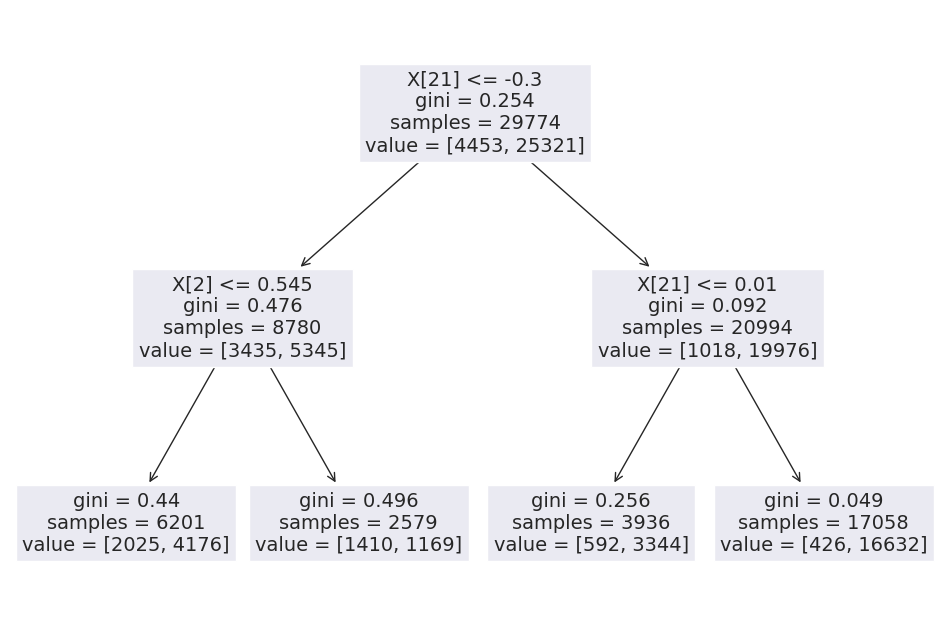

In [276]:
tree.plot_tree(dtree)

In [277]:
def get_depth(dtree):
    check_is_fitted(self)
    return dtree.tree_.max_depth
print('The maximum depth of the tree', dtree.tree_.max_depth)

The maximum depth of the tree 2


### Random Forest Classifier

In [278]:
rf = RandomForestClassifier(n_estimators=100, random_state=0)

In [279]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [280]:
rf_prediction = rf.predict(X_test)

In [281]:
rf_pr = evaluate(rf_prediction,y_test)
rf_pr

# Summary of the prediction
print(classification_report(y_test, rf_prediction))
print(confusion_matrix(y_test, rf_prediction))
# Accuracy
print('Training accuracy:', rf.score(X_train, y_train))
print('Test accuracy:', rf.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.67      0.20      0.31      1978
           1       0.87      0.98      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.77      0.59      0.61     12761
weighted avg       0.84      0.86      0.83     12761

[[  393  1585]
 [  193 10590]]
Training accuracy: 1.0
Test accuracy: 0.8606692265496434


In [282]:
auroc_rf = roc_auc_score(y_test, rf_prediction)
print(auroc_rf)

0.5903934984730017


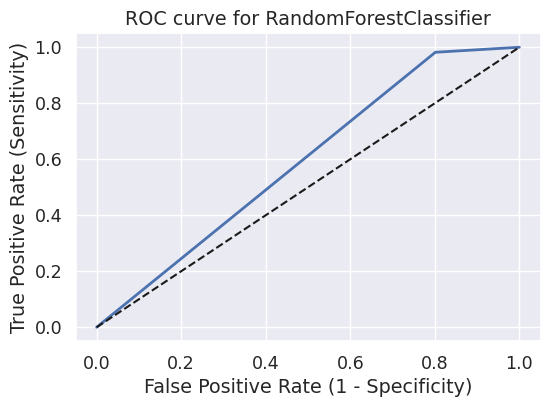

In [283]:
fpr, tpr, thresholds = roc_curve(y_test, rf_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for RandomForestClassifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Support Vector Machine (SVM)

In [284]:
# model = SVC(C=100, random_state = 12)
supvm = SVC(C=1.0, kernel='linear', random_state = 12)

In [285]:
supvm.fit(X_train,y_train)

SVC(kernel='linear', random_state=12)

In [286]:
svm_prediction = supvm.predict(X_test)

In [287]:
svm_pr = evaluate(svm_prediction,y_test)
svm_pr
# Summary of the prediction
print(classification_report(y_test, svm_prediction))
print(confusion_matrix(y_test, svm_prediction))

# Accuracy
print('Training accuracy:', supvm.score(X_train, y_train))
print('Test accuracy:', supvm.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.66      0.08      0.14      1978
           1       0.85      0.99      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.75      0.54      0.53     12761
weighted avg       0.82      0.85      0.80     12761

[[  154  1824]
 [   81 10702]]
Training accuracy: 0.8556458655202526
Test accuracy: 0.8507170284460466


In [288]:
auroc_svm = roc_auc_score(y_test, svm_prediction)
print('AUROC =', auroc_svm)

AUROC = 0.5351722982296122


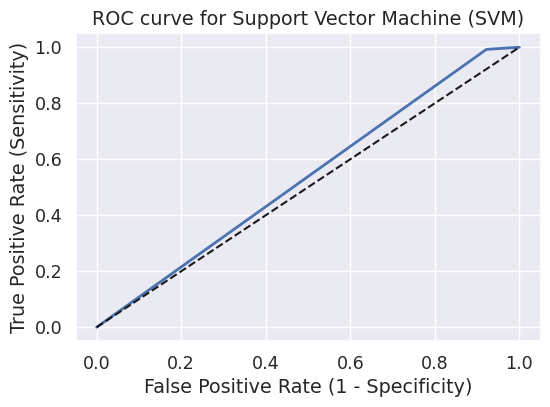

In [289]:
fpr, tpr, thresholds = roc_curve(y_test, svm_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for Support Vector Machine (SVM)')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### K Nearest Neighbors (KNN)

In [290]:
knn = KNeighborsClassifier(n_neighbors=2)

In [291]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 2,
 'p': 2,
 'weights': 'uniform'}

In [292]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=2)

In [293]:
knn_prediction = knn.predict(X_test)

In [294]:
knn_pr = evaluate(knn_prediction,y_test)
knn_pr
# Summary of the prediction
print(classification_report(y_test, knn_prediction))
print(confusion_matrix(y_test, knn_prediction))
# Accuracy
print('Training accuracy:', knn.score(X_train, y_train))
print('Test accuracy:', knn.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.26      0.38      0.31      1978
           1       0.88      0.80      0.84     10783

    accuracy                           0.74     12761
   macro avg       0.57      0.59      0.57     12761
weighted avg       0.78      0.74      0.76     12761

[[ 752 1226]
 [2129 8654]]
Training accuracy: 0.9072009135487338
Test accuracy: 0.7370895697829324


In [295]:
auroc_knn = roc_auc_score(y_test, knn_prediction)
print('AUROC =', auroc_knn)

AUROC = 0.5913707932767256


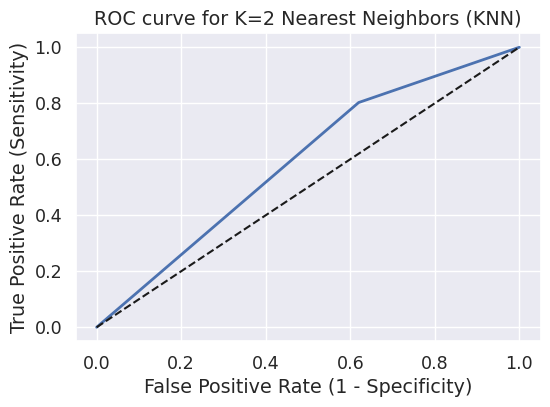

In [296]:
fpr, tpr, thresholds = roc_curve(y_test, knn_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for K=2 Nearest Neighbors (KNN)')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Szukamy optymalnej wartości k 

In [297]:
scores = [] 

for k in range(2, 11):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    knn_prediction = knn.predict(X_test)
    scores.append(accuracy_score(knn_prediction,y_test)) 
    print('n_neighbors=', scores)

n_neighbors= [0.7370895697829324]
n_neighbors= [0.7370895697829324, 0.8308126322388527]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469, 0.8405297390486639]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469, 0.8405297390486639, 0.8352010030561868]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469, 0.8405297390486639, 0.8352010030561868, 0.8442911997492359]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469, 0.8405297390486639, 0.8352010030561868, 0.8442911997492359, 0.8423321056343547]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469, 0.8405297390486639, 0.8352010030561868, 0.8442911997492359, 0.8423321056343547, 0.8460935663349267]
n_neighbors= [0.7370895697829324, 0.8308126322388527, 0.814042786615469, 0.8405297390486639, 0.8352010030561868, 0.8442911997492359, 0.8423321056343547, 0.8460935663349267, 0

In [298]:
error_rate = [] 

max_k = 10

for k in range(1, max_k):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    knn_prediction = knn.predict(X_test)
    error_rate.append(np.mean(knn_prediction != y_test))
print(error_rate)

[0.2104850717028446, 0.2629104302170676, 0.16918736776114723, 0.185957213384531, 0.1594702609513361, 0.16479899694381317, 0.15570880025076406, 0.15766789436564532, 0.15390643366507328]


Text(0, 0.5, 'Error Rate')

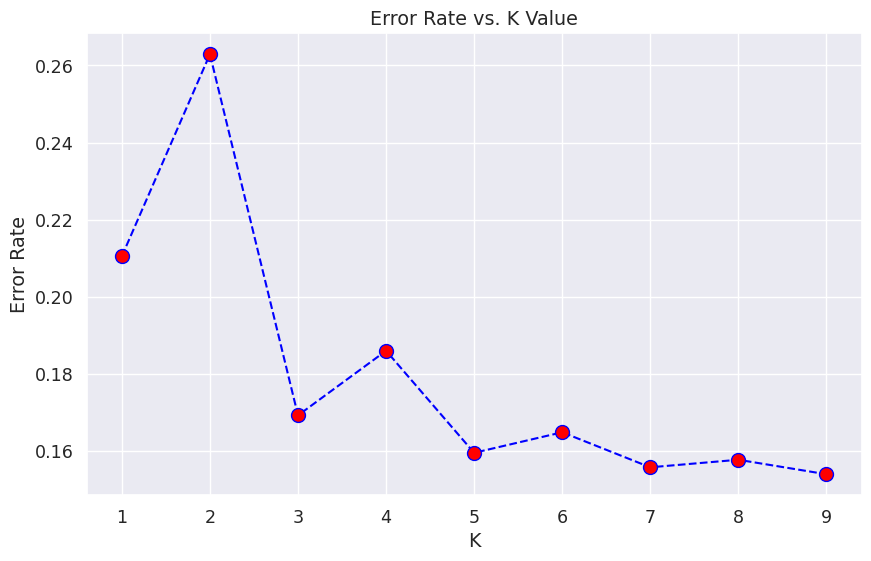

In [299]:
plt.figure(figsize=(10,6))
plt.plot(range(1, max_k), error_rate, color = 'blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

### sprawdź knn dla innej wartości k 

In [300]:
knn1 = KNeighborsClassifier()

In [301]:
knn1.fit(X_train,y_train)

KNeighborsClassifier()

In [302]:
knn1_prediction = knn.predict(X_test)

In [303]:
knn1_pr = evaluate(knn1_prediction,y_test)
knn1_pr
# Summary of the prediction
print(classification_report(y_test, knn1_prediction))
print(confusion_matrix(y_test, knn1_prediction))
# Accuracy
print('Training accuracy:', knn1.score(X_train, y_train))
print('Test accuracy:', knn1.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.54      0.05      0.10      1978
           1       0.85      0.99      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.69      0.52      0.51     12761
weighted avg       0.80      0.85      0.79     12761

[[  104  1874]
 [   90 10693]]
Training accuracy: 0.8720360045677437
Test accuracy: 0.8405297390486639


In [304]:
auroc_knn1 = roc_auc_score(y_test, knn1_prediction)
print('AUROC =', auroc_knn1)

AUROC = 0.5221159453421935


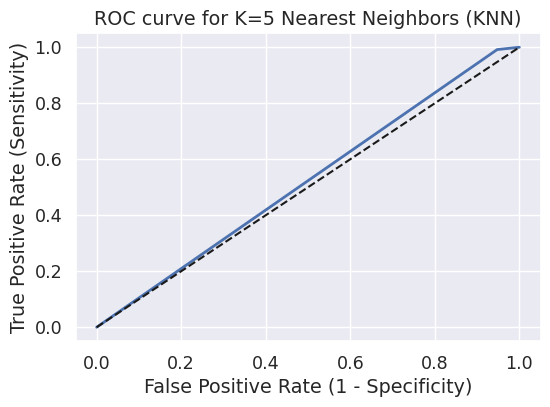

In [305]:
fpr, tpr, thresholds = roc_curve(y_test, knn1_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for K=5 Nearest Neighbors (KNN)')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Bagging Classifier

In [306]:
xgbc = BaggingClassifier(tree.DecisionTreeClassifier(random_state=1))
xgbc.fit(X_train,y_train)
xgbc_prediction = xgbc.predict(X_test)

xgbc = evaluate(xgbc_prediction,y_test)
xgbc

# Summary of the prediction
print(classification_report(y_test, xgbc_prediction))
print(confusion_matrix(y_test, xgbc_prediction))

              precision    recall  f1-score   support

           0       0.51      0.42      0.46      1978
           1       0.90      0.93      0.91     10783

    accuracy                           0.85     12761
   macro avg       0.70      0.67      0.69     12761
weighted avg       0.84      0.85      0.84     12761

[[  823  1155]
 [  782 10001]]


In [307]:
auroc_xgbc = roc_auc_score(y_test, xgbc_prediction)
print('AUROC =', auroc_xgbc)

AUROC = 0.6717776417903814


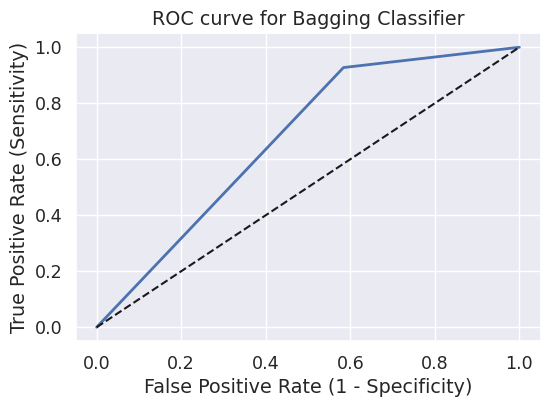

In [308]:
fpr, tpr, thresholds = roc_curve(y_test, xgbc_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for Bagging Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### ADA Boost Classifier 

In [309]:
ada = AdaBoostClassifier(random_state=1)
ada.fit(X_train, y_train)
ada_prediction = ada.predict(X_test)
print(classification_report(y_test, ada_prediction))
ada = evaluate(ada_prediction,y_test)
ada

# Summary of the prediction
print(classification_report(y_test, ada_prediction))
print(confusion_matrix(y_test, ada_prediction))

              precision    recall  f1-score   support

           0       0.59      0.32      0.41      1978
           1       0.88      0.96      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.74      0.64      0.67     12761
weighted avg       0.84      0.86      0.84     12761

              precision    recall  f1-score   support

           0       0.59      0.32      0.41      1978
           1       0.88      0.96      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.74      0.64      0.67     12761
weighted avg       0.84      0.86      0.84     12761

[[  629  1349]
 [  430 10353]]


In [310]:
auroc_ada = roc_auc_score(y_test, ada_prediction)
print('AUROC =', auroc_ada)

AUROC = 0.6390601963338352


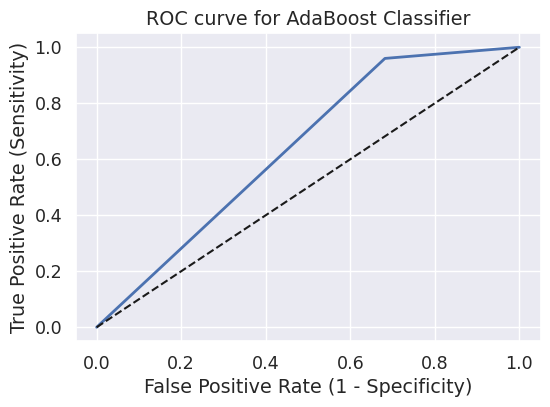

In [311]:
fpr, tpr, thresholds = roc_curve(y_test, ada_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for AdaBoost Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Gradient Boosting Classifier

In [312]:
gbc= GradientBoostingClassifier(learning_rate=0.01, random_state=1)
gbc.fit(X_train, y_train)
gbc_prediction = gbc.predict(X_test)
gbc = evaluate(gbc_prediction,y_test)
gbc

# Summary of the prediction
print(classification_report(y_test, gbc_prediction))
print(confusion_matrix(y_test, gbc_prediction))

              precision    recall  f1-score   support

           0       0.81      0.06      0.10      1978
           1       0.85      1.00      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.83      0.53      0.51     12761
weighted avg       0.85      0.85      0.79     12761

[[  110  1868]
 [   26 10757]]


In [313]:
auroc_gbc = roc_auc_score(y_test, gbc_prediction)
print('AUROC =', auroc_gbc)

AUROC = 0.5266002630999793


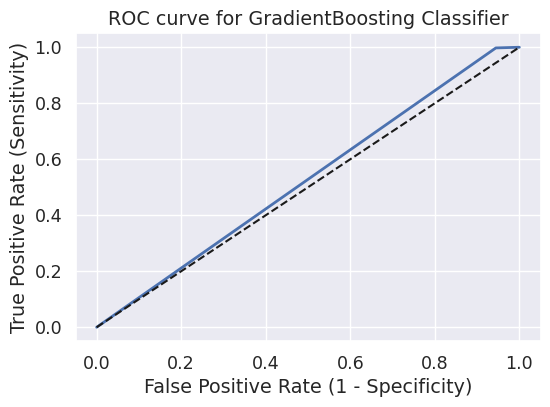

In [314]:
fpr, tpr, thresholds = roc_curve(y_test, gbc_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for GradientBoosting Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### XGB Classifier

In [315]:
import xgboost as xgb 
xgb_clas=xgb.XGBClassifier(random_state=1,learning_rate=0.01)
xgb_clas.fit(X_train, y_train)
xgb_clas_prediction = xgb_clas.predict(X_test)
xgb_clas = evaluate(xgb_clas_prediction,y_test)
xgb_clas

# Summary of the prediction
print(classification_report(y_test, xgb_clas_prediction))
print(confusion_matrix(y_test, xgb_clas_prediction))

              precision    recall  f1-score   support

           0       0.62      0.33      0.43      1978
           1       0.89      0.96      0.92     10783

    accuracy                           0.87     12761
   macro avg       0.75      0.65      0.68     12761
weighted avg       0.85      0.87      0.85     12761

[[  661  1317]
 [  403 10380]]


In [316]:
auroc_xgb_clas = roc_auc_score(y_test, xgb_clas_prediction)
print('AUROC =', auroc_xgb_clas)

AUROC = 0.648401145794878


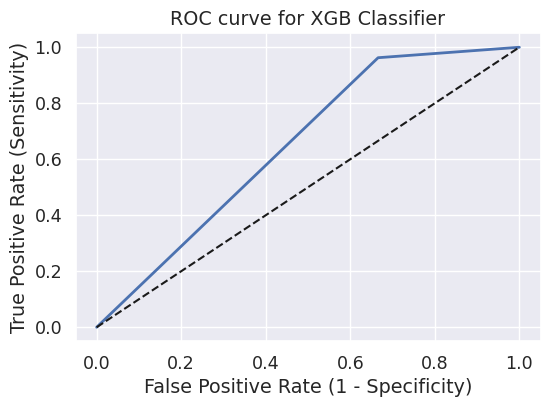

In [317]:
fpr, tpr, thresholds = roc_curve(y_test, xgb_clas_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for XGB Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

### Porównanie wszystkich modeli na data_dummies 

In [318]:
results = pd.DataFrame({'Method':['Logistic Regression', 'Logistic Regression parameters','Decision Tree', 'Random Forest', 
                                  ' Support Vector Machine (SVM)', 'KNN', 'Bagging Classifier', 'ADA Boost Classifier', 
                                  'Gradient Boosting Classifier', 'XGB Classifier'], 
                        'AUROC': [auroc_log, auroc_lrc, auroc_dtree, auroc_rf, auroc_svm, 
                                  auroc_knn, auroc_xgbc, auroc_ada, auroc_gbc, auroc_xgb_clas]})
results.sort_values(by = 'AUROC', ascending = False)

,Method,AUROC
6,Bagging Classifier,0.671778
9,XGB Classifier,0.648401
7,ADA Boost Classifier,0.639060
2,Decision Tree,0.636387
0,Logistic Regression,0.602105
1,Logistic Regression parameters,0.602105
5,KNN,0.591371
3,Random Forest,0.590393
4,Support Vector Machine (SVM),0.535172
8,Gradient Boosting Classifier,0.526600


### Modele na całym zbiorze - data_loan1 - cechy numeryczne

#### Logistic Regression

In [319]:
X1 = data_loan1.drop('loan_status',axis=1) 
#target
y1 = data_loan1['loan_status']

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=0)

sc = StandardScaler()
X1_train = sc.fit_transform(X1_train)
X1_test = sc.transform(X1_test)

In [320]:
log_num = LogisticRegression()
log_num.fit(X1_train, y1_train)

y1_pred = log_num.predict(X1_test)

# Summary of the prediction
print(classification_report(y1_test, y1_pred))
print(confusion_matrix(y1_test, y1_pred))

              precision    recall  f1-score   support

           0       0.65      0.19      0.29      1978
           1       0.87      0.98      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.76      0.58      0.61     12761
weighted avg       0.83      0.86      0.82     12761

[[  372  1606]
 [  200 10583]]


In [321]:
auroc_log_num = roc_auc_score(y_test, xgb_clas_prediction)
print('AUROC =', auroc_log_num)

AUROC = 0.648401145794878


#### Bagging Classifier

In [322]:
xgbc = BaggingClassifier(tree.DecisionTreeClassifier(random_state=1))
xgbc.fit(X1_train, y1_train)
xgbc_prediction = xgbc.predict(X1_test)
xgbc = evaluate(xgbc_prediction,y1_test)
xgbc

# Summary of the prediction
print(classification_report(y1_test, xgbc_prediction))
print(confusion_matrix(y1_test, xgbc_prediction))

              precision    recall  f1-score   support

           0       0.50      0.42      0.45      1978
           1       0.90      0.92      0.91     10783

    accuracy                           0.85     12761
   macro avg       0.70      0.67      0.68     12761
weighted avg       0.83      0.85      0.84     12761

[[ 821 1157]
 [ 818 9965]]


In [323]:
auroc_gbc_num = roc_auc_score(y1_test, xgbc_prediction)
print('AUROC =', auroc_gbc_num)

AUROC = 0.669602786357997


### Modele na całym zbiorze - data_outliers - z uzupełnionymi medianami

#### Logistic Regression

In [324]:
X2 = data_outliers 
#target
y2 = data_loan['loan_status']

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=0)

sc = StandardScaler()
X2_train = sc.fit_transform(X2_train)
X2_test = sc.transform(X2_test)

In [325]:
log_med = LogisticRegression()
log_med.fit(X2_train, y2_train)

y2_pred= log_med.predict(X2_test)

# Summary of the prediction
print(classification_report(y2_test, y2_pred))
print(confusion_matrix(y2_test, y2_pred))

              precision    recall  f1-score   support

           0       0.65      0.20      0.31      1978
           1       0.87      0.98      0.92     10783

    accuracy                           0.86     12761
   macro avg       0.76      0.59      0.62     12761
weighted avg       0.84      0.86      0.83     12761

[[  402  1576]
 [  217 10566]]


In [326]:
auroc_log_med = roc_auc_score(y2_test, y2_pred)
print('AUROC =', auroc_log_med)

AUROC = 0.5915556609114054


#### Bagging Classifier

In [327]:
xgbc = BaggingClassifier(tree.DecisionTreeClassifier(random_state=1))
xgbc.fit(X2_train, y2_train)
xgbc_prediction = xgbc.predict(X2_test)
xgbc = evaluate(xgbc_prediction,y2_test)
xgbc

# Summary of the prediction
print(classification_report(y2_test, xgbc_prediction))
print(confusion_matrix(y2_test, xgbc_prediction))

              precision    recall  f1-score   support

           0       0.50      0.40      0.45      1978
           1       0.89      0.93      0.91     10783

    accuracy                           0.85     12761
   macro avg       0.70      0.66      0.68     12761
weighted avg       0.83      0.85      0.84     12761

[[ 797 1181]
 [ 787 9996]]


In [328]:
auroc_gbc_med = roc_auc_score(y2_test, xgbc_prediction)
print('AUROC =', auroc_gbc_med)

AUROC = 0.6649735001177283


### Podsumowanie 

Najlepsze wyniki AUROC uzyskałem na modelu Bagging Classifier, na wszystkich danych. Poniżej podsumowanie w zależności od rodzaju danych. 

In [329]:
results = pd.DataFrame({'Method':['Bagging Classifier','Bagging Classifier','Bagging Classifier'], 
                        'AUROC': [auroc_xgbc, auroc_gbc_num, auroc_gbc_med],
                       'Zbiór danych': ['data_dummies', 'data_loan numeryczne', 'data_loan z medianami']})
results.sort_values(by = 'AUROC', ascending = False)

,Method,AUROC,Zbiór danych
0,Bagging Classifier,0.671778,data_dummies
1,Bagging Classifier,0.669603,data_loan numeryczne
2,Bagging Classifier,0.664974,data_loan z medianami


### 5. Skompresowanie danych metodą PCA 

In [330]:
X = data_dummies.drop('loan_status',axis=1) 
#target
y = data_dummies['loan_status']

<AxesSubplot:>

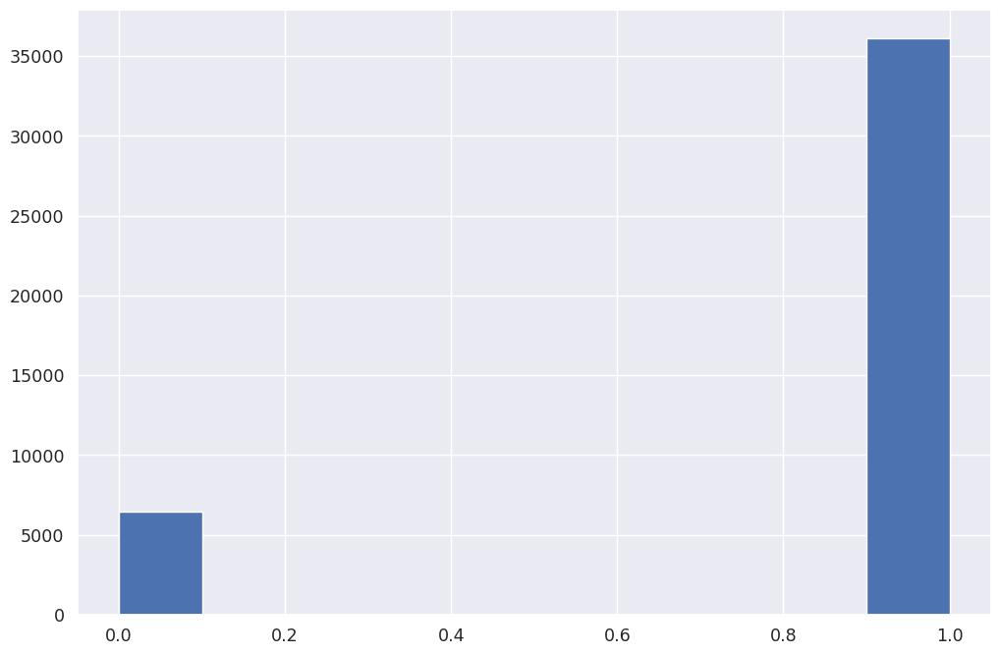

In [331]:
y.hist()

In [332]:
X.shape

(42535, 97)

In [333]:
y.shape

(42535,)

In [334]:
y

0        1
1        0
2        1
3        1
4        1
        ..
42530    1
42531    1
42532    1
42533    1
42534    1
Name: loan_status, Length: 42535, dtype: int64

### Standaryzacja, przed wykonaniem PCA 

In [335]:
sc = StandardScaler()
X_scaled = sc.fit_transform(X)
X_scaled[:5, :5]

array([[-0.82173051, -0.81456887, -0.59064503, -0.40859218, -0.76464399],
       [-1.15907367, -1.16437427,  1.69306429,  0.83739883, -1.25783589],
       [-1.1725674 , -1.17836649, -0.59064503,  1.0234884 , -1.1405688 ],
       [-0.14704418, -0.11495806, -0.59064503,  0.35734169,  0.07987056],
       [-1.09160504, -1.09441319,  1.69306429,  0.14158567, -1.21973605]])

In [336]:
X.columns

Index(['loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'sub_grade', 'emp_length', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'pub_rec_bankruptcies', 'fico_mean',
       'last_fico_mean', 'fico_rating', 'loan_amnt_rating', 'interest_rating',
       'home_ownership_MORTGAGE', 'home_ownership_NONE',
       'home_ownership_OTHER', 'home_ownership_OWN', 'home_ownership_RENT',
       'verification_status_Not Verified',
       'verification_status_Source Verified', 'verification_status_Verified',
       'purpose_car', 'purpose_credit_card', 'purpose_debt_consolidation',
       'purpose_educational', 'purpose_home_improvement', 'purpose_house',
       'purpose_major_purchase', 'purpose_medical', 'purpose_moving',
       'purpose_other', 'purpose_renewable_energy', 'purpose_small_business',
       'purpose_vacation', 'purpo

In [337]:
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
X_scaled_df

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,dti,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
0,-0.821731,-0.814569,-0.590645,-0.408592,-0.764644,-1.532735,1.395279,-0.704226,0.795288,2.122578,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
1,-1.159074,-1.164374,1.693064,0.837399,-1.257836,-1.402702,-1.207217,-0.610611,0.795288,-1.839520,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
2,-1.172567,-1.178366,-0.590645,1.023488,-1.140569,-1.272670,1.395279,-0.887523,0.795288,-0.691775,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
3,-0.147044,-0.114958,-0.590645,0.357342,0.079871,-1.142637,1.395279,-0.311045,0.795288,0.985240,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
4,-1.091605,-1.094413,1.693064,0.141586,-1.219736,-1.012604,-1.207217,0.169509,0.795288,0.678977,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42530,-1.024136,-1.024452,-0.590645,-0.508379,-1.001476,-1.142637,-1.207217,1.729751,-3.343908,-0.501476,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
42531,-1.361480,-1.374258,-0.590645,-0.680984,-1.390515,0.157690,-1.207217,-0.891455,-3.343908,-0.501476,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
42532,-1.155700,-1.160876,-0.590645,-0.764590,-1.157991,0.027657,-1.207217,0.637582,-3.343908,-0.501476,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272
42533,-0.619325,-0.604686,-0.590645,-1.020800,-0.563758,0.677821,-1.207217,-0.142539,-3.343908,-1.393505,...,-0.03972,-0.027439,-0.271245,-0.08111,-0.190331,-0.036632,-0.146021,-0.110816,-0.066451,-0.045272


#### Sprawdzamy korelację 

In [338]:
plt.figure(figsize = (20,10))       
X_scaled_df.corr()

,loan_amnt,funded_amnt,term,int_rate,installment,sub_grade,emp_length,annual_inc,issue_d,dti,...,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY
loan_amnt,1.000000,0.981746,0.355647,0.292346,0.930869,0.119626,0.138589,0.276125,0.142493,0.065112,...,-0.007118,-0.011793,0.017900,0.000111,0.010004,-0.010225,-0.003873,0.000184,-0.003483,0.000242
funded_amnt,0.981746,1.000000,0.335137,0.295154,0.956522,0.115749,0.138117,0.272070,0.152112,0.064821,...,-0.006992,-0.015116,0.016872,0.000063,0.011842,-0.010569,-0.002099,0.000458,-0.002075,0.000828
term,0.355647,0.335137,1.000000,0.428649,0.097614,0.190461,0.111158,0.043496,0.281890,0.077059,...,0.003617,-0.016207,-0.011033,0.002065,0.002166,-0.004024,-0.007010,0.011548,0.005385,-0.006537
int_rate,0.292346,0.295154,0.428649,1.000000,0.271433,0.313232,-0.012695,0.054377,0.006153,0.119607,...,-0.006738,-0.001938,0.002413,0.000201,0.005777,-0.008556,0.006209,0.000731,-0.005369,0.005543
installment,0.930869,0.956522,0.097614,0.271433,1.000000,0.102561,0.108253,0.278342,0.072136,0.054948,...,-0.009050,-0.012582,0.020323,-0.000956,0.010888,-0.009995,0.000584,-0.002843,-0.005191,0.003201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
addr_state_VT,-0.010225,-0.010569,-0.004024,-0.008556,-0.009995,-0.000909,0.005953,-0.008894,0.002532,-0.000426,...,-0.001455,-0.001005,-0.009936,-0.002971,-0.006972,1.000000,-0.005349,-0.004059,-0.002434,-0.001658
addr_state_WA,-0.003873,-0.002099,-0.007010,0.006209,0.000584,-0.000473,0.000559,-0.005645,0.003483,-0.002305,...,-0.005800,-0.004007,-0.039607,-0.011844,-0.027792,-0.005349,1.000000,-0.016181,-0.009703,-0.006611
addr_state_WI,0.000184,0.000458,0.011548,0.000731,-0.002843,0.000552,0.009861,-0.010436,-0.006541,0.003232,...,-0.004402,-0.003041,-0.030058,-0.008988,-0.021092,-0.004059,-0.016181,1.000000,-0.007364,-0.005017
addr_state_WV,-0.003483,-0.002075,0.005385,-0.005369,-0.005191,-0.009206,0.011335,-0.015449,0.006883,0.018204,...,-0.002639,-0.001823,-0.018025,-0.005390,-0.012648,-0.002434,-0.009703,-0.007364,1.000000,-0.003008


<Figure size 2000x1000 with 0 Axes>

### PCA redukcja wymiarów

In [339]:
pca = PCA(random_state=42)
pca.fit(X_scaled)

PCA(random_state=42)

#### Sprawdzam liczbę komponentów

In [340]:
pca.components_[0]

array([ 3.98663613e-01,  3.97415860e-01,  1.75253811e-01,  1.49808078e-01,
        3.73623051e-01,  7.26308430e-02,  1.17359348e-01,  1.68026467e-01,
        9.01326971e-02,  7.89990740e-02, -3.45799486e-03, -1.47489234e-01,
        1.22166090e-03,  1.76536828e-02,  1.60700550e-01, -1.27456455e-02,
        1.76637691e-01,  6.06719717e-02,  2.05562709e-01, -5.02451223e-03,
        2.92654586e-02,  3.51002763e-02, -1.29941452e-02,  3.57000230e-01,
       -3.56261233e-02,  1.63683343e-01, -7.86086491e-03, -7.53057314e-03,
       -2.19799777e-02, -1.50166856e-01, -1.87402351e-01, -3.67182189e-02,
        2.33837977e-01, -5.60760418e-02,  1.36321709e-02,  9.87598382e-02,
       -3.97916297e-02,  2.40204415e-02,  3.01376786e-03, -5.63334818e-02,
       -2.37687289e-02, -4.33795388e-02, -7.96720393e-02, -3.64677788e-03,
        3.17435180e-02, -3.37189468e-02, -2.37466492e-02,  7.47535356e-03,
        5.00539201e-03,  7.64054869e-04,  1.22576842e-03, -6.36342295e-03,
       -4.73190966e-04,  

In [341]:
pca.explained_variance_ratio_

array([5.36600393e-02, 3.33538833e-02, 2.46932832e-02, 1.99650149e-02,
       1.89639579e-02, 1.76088981e-02, 1.55906721e-02, 1.46576546e-02,
       1.42656015e-02, 1.32954042e-02, 1.29603083e-02, 1.25189207e-02,
       1.21724170e-02, 1.17997133e-02, 1.15013606e-02, 1.13861075e-02,
       1.12913340e-02, 1.11791430e-02, 1.11144655e-02, 1.10909198e-02,
       1.09967637e-02, 1.09566878e-02, 1.08591267e-02, 1.08375646e-02,
       1.07571345e-02, 1.07411810e-02, 1.06999495e-02, 1.06931807e-02,
       1.06807625e-02, 1.06634483e-02, 1.06375786e-02, 1.06205350e-02,
       1.05754055e-02, 1.05522768e-02, 1.05331589e-02, 1.05221234e-02,
       1.05001026e-02, 1.04931010e-02, 1.04708469e-02, 1.04663513e-02,
       1.04490882e-02, 1.04345887e-02, 1.04224166e-02, 1.04122505e-02,
       1.04053309e-02, 1.04007455e-02, 1.03892348e-02, 1.03844509e-02,
       1.03712557e-02, 1.03644878e-02, 1.03592249e-02, 1.03544839e-02,
       1.03482132e-02, 1.03388644e-02, 1.03295674e-02, 1.03261227e-02,
      

#### Skumulowana suma wariancji

In [342]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.05366004, 0.08701392, 0.11170721, 0.13167222, 0.15063618,
       0.16824508, 0.18383575, 0.1984934 , 0.21275901, 0.22605441,
       0.23901472, 0.25153364, 0.26370606, 0.27550577, 0.28700713,
       0.29839324, 0.30968457, 0.32086371, 0.33197818, 0.3430691 ,
       0.35406586, 0.36502255, 0.37588168, 0.38671924, 0.39747638,
       0.40821756, 0.41891751, 0.42961069, 0.44029145, 0.4509549 ,
       0.46159248, 0.47221301, 0.48278842, 0.49334069, 0.50387385,
       0.51439598, 0.52489608, 0.53538918, 0.54586003, 0.55632638,
       0.56677547, 0.57721006, 0.58763247, 0.59804472, 0.60845005,
       0.6188508 , 0.62924003, 0.63962448, 0.64999574, 0.66036023,
       0.67071945, 0.68107394, 0.69142215, 0.70176101, 0.71209058,
       0.7224167 , 0.73273331, 0.74304427, 0.75334845, 0.76362239,
       0.77388627, 0.78414518, 0.79437941, 0.80458259, 0.81474804,
       0.82484872, 0.834918  , 0.84497445, 0.8550121 , 0.86501474,
       0.87494113, 0.88473625, 0.89446793, 0.90409374, 0.91339

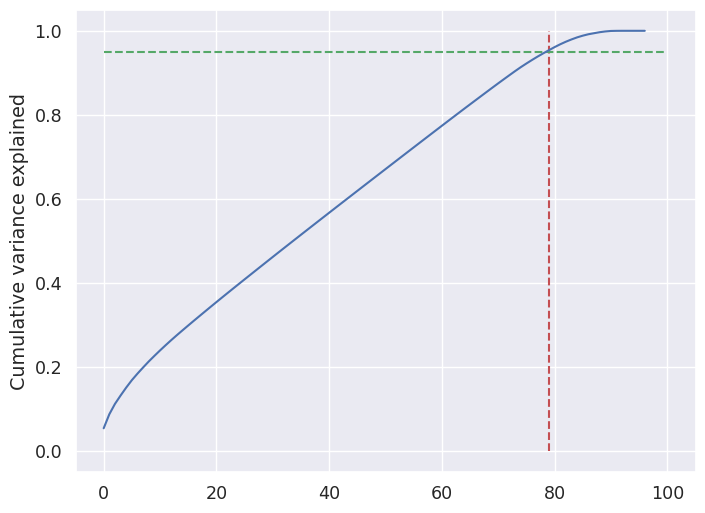

In [343]:
fig = plt.figure(figsize=[8,6],dpi=100)
plt.vlines(x=79, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=100, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

#### Mamy 79 komponentów, 
przy których zachowujemy 95% pierwotnych danych. Budujemy nowe dane. 79 komponentów to ponad 81% wszystkich, co prawdopodobnie nie da wielkiej zmiany. Przyjęłem do obliczeń różne wartości komponentów:
- n_components=2 => AUROC LR = 0.500711
- n_components=20 => AUROC LR = 0.522495
- n_components=30 => AUROC LR = 0.531633
- n_components=50 => AUROC LR = 0.542025
- n_components=79 => AUROC LR = 0.586045

Najwyższa wartoś jest dla najwyższej liczby komponentów n=79, a najniższa wartość jest dla najniższej liczny komponentów n=2. Sprawdzam dla różnych n i ostatecznie wybieram na po analizie ``n_components=60``.  

In [344]:
pca_final = PCA(n_components=60, random_state=67)
X_pca_final = pca_final.fit_transform(X_scaled)

In [345]:
print(X.shape)
print(X_pca_final.shape)

(42535, 97)
(42535, 60)


In [346]:
X = X_pca_final
y = data_dummies['loan_status']

In [347]:
X

array([[-1.11655169e+00, -5.31510228e-01, -8.03412804e-02, ...,
        -3.38595676e-01,  1.10306479e+00,  3.37215083e-01],
       [-3.13787644e+00, -9.32863225e-01, -1.19380233e+00, ...,
         1.10772959e-01,  4.71776340e-01,  1.21173952e+00],
       [-2.55460322e+00, -9.19670093e-01, -4.98856757e-01, ...,
         4.24293010e-03,  9.11734258e-01, -3.83019902e-01],
       ...,
       [-3.59091585e+00, -2.90853096e-02, -6.89520038e-01, ...,
        -1.17583952e-01, -1.01759569e+00, -1.39844847e-01],
       [-3.60237684e+00,  1.90770322e+00, -1.11990496e+00, ...,
         1.30759504e+01,  2.55313983e+01, -6.84778061e+00],
       [-2.47022223e+00,  2.81377607e+00,  3.96229291e-01, ...,
         2.99656018e-02, -8.69947244e-01, -6.95052633e-01]])

In [348]:
y

0        1
1        0
2        1
3        1
4        1
        ..
42530    1
42531    1
42532    1
42533    1
42534    1
Name: loan_status, Length: 42535, dtype: int64

<AxesSubplot:>

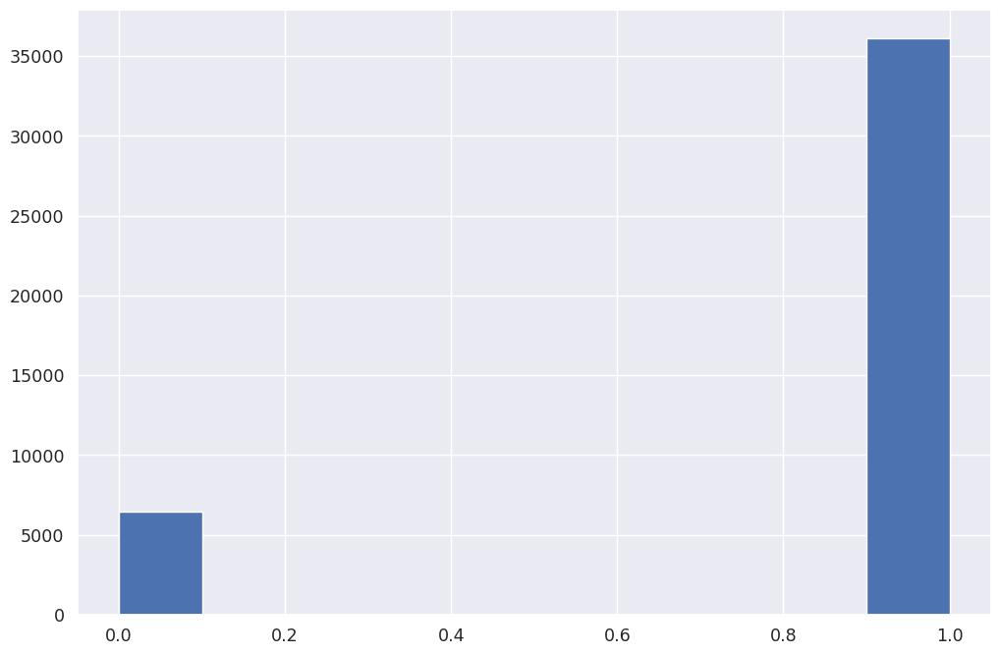

In [349]:
y.hist()

In [350]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [351]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_test 

array([[-1.13915721, -0.78008089, -0.549711  , ..., -0.30889461,
        -0.26340202, -2.37898625],
       [-1.30916994,  0.02361284,  0.2034459 , ..., -0.1966055 ,
        -0.40182079,  0.52121232],
       [-0.12324974,  1.13157697,  0.62666237, ...,  0.55362987,
         0.53596514,  0.30089312],
       ...,
       [ 0.3790809 ,  1.47120904, -0.55698086, ..., -0.16396143,
         0.79168164,  0.4471615 ],
       [ 0.87702519, -1.55075332, -1.01377858, ...,  0.31099657,
        -0.42649259, -0.55116541],
       [ 0.28118921, -0.2912634 ,  2.36675704, ..., -0.66702674,
        -0.11695606,  0.7017783 ]])

In [352]:
y_test.sample()

1687    1
Name: loan_status, dtype: int64

### Logistic Regression

In [353]:
log = LogisticRegression()
log.fit(X_train, y_train)

log_pred = log.predict(X_test)
    
# Summary of the prediction
print(classification_report(y_test, log_pred))
print(confusion_matrix(y_test, log_pred))

# Accuracy
print('Training accuracy:', log.score(X_train, y_train))
print('Test accuracy:', log.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.65      0.09      0.16      1978
           1       0.86      0.99      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.75      0.54      0.54     12761
weighted avg       0.82      0.85      0.80     12761

[[  185  1793]
 [  101 10682]]
Training accuracy: 0.8556794518707598
Test accuracy: 0.8515790298565943


In [354]:
auroc_log = roc_auc_score(y_test, log_pred)
print('AUROC =', auroc_log)

AUROC = 0.5420811107098795


In [355]:
X_train

array([[ 0.54267509,  0.04836883,  1.72196336, ..., -0.29565733,
         0.07005553,  0.35182011],
       [ 0.57070957, -0.40457212, -1.41525093, ..., -0.18851814,
         0.12186189,  0.71261701],
       [-0.07684331, -1.08951332, -1.18606236, ..., -0.72997119,
        -0.10937829,  0.00560627],
       ...,
       [ 0.91491645, -1.13264268, -0.76790037, ..., -0.02600221,
         1.06980682,  0.52308861],
       [-0.7572509 ,  0.0069002 , -0.807693  , ..., -1.19127997,
         0.72103443, -0.85122503],
       [ 0.19587693, -0.70983357, -1.09921244, ..., -0.19618324,
         0.20209008, -0.0686523 ]])

### Logistic Regression z regularyzacją

In [356]:
log1 = LogisticRegression(penalty='l1', C=.01, solver='liblinear')
log1.fit(X_train, y_train)
log1_pred = log1.predict(X_test)

# Summary of the prediction
print(classification_report(y_test, log1_pred))
print(confusion_matrix(y_test, log1_pred))

# Accuracy
print('Training accuracy:', log1.score(X_train, y_train))
print('Test accuracy:', log1.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.70      0.06      0.10      1978
           1       0.85      1.00      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.78      0.53      0.51     12761
weighted avg       0.83      0.85      0.79     12761

[[  112  1866]
 [   48 10735]]
Training accuracy: 0.8535970981393162
Test accuracy: 0.8500117545646892


In [357]:
X_train.shape

(29774, 60)

In [358]:
auroc_log1 = roc_auc_score(y_test, log1_pred)
print('AUROC =', auroc_log1)

AUROC = 0.5260857000031975


#### Uwaga 
Wyniki ewaluacji LR z regularyzacją wyszły lepsze po ponownym skalowanie nowych danych. 

In [359]:
def evaluate(prediction,y_test): 
    result = classification_report(y_test,prediction,output_dict=True)
    f1 = result['1']['f1-score']
    accuracy = result['accuracy']
    performance_data= {'f1-score':round(f1, 2),
                      'accuracy':round(accuracy, 2)}
    return performance_data

### Random Forest Classifier

In [360]:
rf = RandomForestClassifier(n_estimators=100, random_state=0)

In [361]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [362]:
rf_prediction = rf.predict(X_test)

In [363]:
rf_pr = evaluate(rf_prediction,y_test)
rf_pr

# Summary of the prediction
print(classification_report(y_test, rf_prediction))
print(confusion_matrix(y_test, rf_prediction))
# Accuracy
print('Training accuracy:', rf.score(X_train, y_train))
print('Test accuracy:', rf.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.64      0.05      0.09      1978
           1       0.85      0.99      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.75      0.52      0.50     12761
weighted avg       0.82      0.85      0.79     12761

[[   96  1882]
 [   54 10729]]
Training accuracy: 0.9999664136494928
Test accuracy: 0.8482877517435937


In [364]:
auroc_rf = roc_auc_score(y_test, rf_prediction)
print(auroc_rf)

0.5217629949100684


### K Nearest Neighbors (KNN)

In [365]:
knn = KNeighborsClassifier(n_neighbors=5)

In [366]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [367]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [368]:
knn_prediction = knn.predict(X_test)

In [369]:
knn_pr = evaluate(knn_prediction,y_test)
knn_pr
# Summary of the prediction
print(classification_report(y_test, knn_prediction))
print(confusion_matrix(y_test, knn_prediction))
# Accuracy
print('Training accuracy:', knn.score(X_train, y_train))
print('Test accuracy:', knn.score(X_test, y_test))

              precision    recall  f1-score   support

           0       0.31      0.07      0.11      1978
           1       0.85      0.97      0.91     10783

    accuracy                           0.83     12761
   macro avg       0.58      0.52      0.51     12761
weighted avg       0.77      0.83      0.78     12761

[[  139  1839]
 [  305 10478]]
Training accuracy: 0.8683750923624639
Test accuracy: 0.8319880887077815


In [370]:
auroc_knn = roc_auc_score(y_test, knn_prediction)
print('AUROC =', auroc_knn)

AUROC = 0.5209938695960677


### Bagging Classifier

In [371]:
xgbc = BaggingClassifier(tree.DecisionTreeClassifier(random_state=1))
xgbc.fit(X_train,y_train)
xgbc_prediction = xgbc.predict(X_test)

xgbc = evaluate(xgbc_prediction,y_test)
xgbc

# Summary of the prediction
print(classification_report(y_test, xgbc_prediction))
print(confusion_matrix(y_test, xgbc_prediction))

              precision    recall  f1-score   support

           0       0.38      0.19      0.25      1978
           1       0.86      0.95      0.90     10783

    accuracy                           0.83     12761
   macro avg       0.62      0.57      0.58     12761
weighted avg       0.79      0.83      0.80     12761

[[  367  1611]
 [  590 10193]]


In [372]:
auroc_xgbc = roc_auc_score(y_test, xgbc_prediction)
print('AUROC =', auroc_xgbc)

AUROC = 0.5654125970859835


### ADA Boost Classifier 

In [373]:
ada = AdaBoostClassifier(random_state=1)
ada.fit(X_train, y_train)
ada_prediction = ada.predict(X_test)
print(classification_report(y_test, ada_prediction))
ada = evaluate(ada_prediction,y_test)
ada

# Summary of the prediction
print(classification_report(y_test, ada_prediction))
print(confusion_matrix(y_test, ada_prediction))

              precision    recall  f1-score   support

           0       0.54      0.12      0.19      1978
           1       0.86      0.98      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.70      0.55      0.55     12761
weighted avg       0.81      0.85      0.80     12761

              precision    recall  f1-score   support

           0       0.54      0.12      0.19      1978
           1       0.86      0.98      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.70      0.55      0.55     12761
weighted avg       0.81      0.85      0.80     12761

[[  233  1745]
 [  202 10581]]


In [374]:
auroc_ada = roc_auc_score(y_test, ada_prediction)
print('AUROC =', auroc_ada)

AUROC = 0.5495312810759775


### XGB Classifier

In [375]:
xgb_clas=xgb.XGBClassifier(random_state=1,learning_rate=0.1)
xgb_clas.fit(X_train, y_train)
xgb_clas_prediction = xgb_clas.predict(X_test)
xgb_clas = evaluate(xgb_clas_prediction,y_test)
xgb_clas

# Summary of the prediction
print(classification_report(y_test, xgb_clas_prediction))
print(confusion_matrix(y_test, xgb_clas_prediction))

              precision    recall  f1-score   support

           0       0.63      0.06      0.10      1978
           1       0.85      0.99      0.92     10783

    accuracy                           0.85     12761
   macro avg       0.74      0.53      0.51     12761
weighted avg       0.82      0.85      0.79     12761

[[  112  1866]
 [   67 10716]]


In [376]:
auroc_xgb_clas = roc_auc_score(y_test, xgb_clas_prediction)
print('AUROC =', auroc_xgb_clas)

AUROC = 0.5252046835884707


### Support Vector Machine (SVM)

In [377]:
supvm = SVC(C=1.0, kernel='linear', random_state = 12)

In [378]:
supvm.fit(X_train,y_train)

SVC(kernel='linear', random_state=12)

In [379]:
svm_prediction = supvm.predict(X_test)

In [380]:
svm_pr = evaluate(svm_prediction,y_test)
svm_pr
# Summary of the prediction
print(classification_report(y_test, svm_prediction))
print(confusion_matrix(y_test, svm_prediction))

# Accuracy
print('Training accuracy:', supvm.score(X_train, y_train))
print('Test accuracy:', supvm.score(X_test, y_test))

/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1978
           1       0.84      1.00      0.92     10783

    accuracy                           0.84     12761
   macro avg       0.42      0.50      0.46     12761
weighted avg       0.71      0.84      0.77     12761

[[    0  1978]
 [    0 10783]]
Training accuracy: 0.8504399811916438
Test accuracy: 0.8449964736305932


In [381]:
auroc_svm = roc_auc_score(y_test, svm_prediction)
print('AUROC =', auroc_svm)

AUROC = 0.5


### Decision Tree

In [382]:
dtree = DecisionTreeClassifier(max_depth = 2, random_state = 0)

In [383]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=2, random_state=0)

In [384]:
def evaluate(prediction,y_test): 
    result = classification_report(y_test,prediction,output_dict=True)
    f1 = result['1']['f1-score']
    accuracy = result['accuracy']
    performance_data= {'f1-score':round(f1, 2),
                      'accuracy':round(accuracy, 2)}
    return performance_data

In [385]:
dt_prediction = dtree.predict(X_test)

In [386]:
dtree_pr = evaluate(dt_prediction,y_test)
dtree_pr

# Summary of the prediction
print(classification_report(y_test, dt_prediction))
print(confusion_matrix(y_test, dt_prediction))
# Accuracy
print('Training accuracy:', dtree.score(X_train, y_train))
print('Test accuracy:', dtree.score(X_test, y_test))
# metrics.f1_score(y_test, dt_pred, average='weighted', labels=np.unique(dt_pred))

# import warnings
# warnings.filterwarnings('always')  # "error", "ignore", "always", "default", "module" or "once"

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1978
           1       0.84      1.00      0.92     10783

    accuracy                           0.84     12761
   macro avg       0.42      0.50      0.46     12761
weighted avg       0.71      0.84      0.77     12761

[[    0  1978]
 [    0 10783]]
Training accuracy: 0.8504399811916438
Test accuracy: 0.8449964736305932


/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.

In [387]:
auroc_dtree = roc_auc_score(y_test, dt_prediction)
print('AUROC =', auroc_dtree)
# metrics.f1_score(y_test, dt_prediction, average='weighted', labels=np.unique(dt_prediction))

AUROC = 0.5


### Gradient Boosting Classifier

In [388]:
gbc = GradientBoostingClassifier(learning_rate=0.01, random_state=0)
gbc.fit(X_train, y_train)
gbc_predpca = gbc.predict(X_test)
# gbc = evaluate(gbc_predpca,y_test)
gbc

# Summary of the prediction
print(classification_report(y_test, gbc_predpca))
print(confusion_matrix(y_test, gbc_predpca))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1978
           1       0.84      1.00      0.92     10783

    accuracy                           0.84     12761
   macro avg       0.42      0.50      0.46     12761
weighted avg       0.71      0.84      0.77     12761

[[    0  1978]
 [    0 10783]]


/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/marek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [389]:
auroc_gbc = roc_auc_score(y_test, gbc_predpca)
print('AUROC =', auroc_gbc)

AUROC = 0.5


### Analiza
Po wykonaniu PCA i skalowaniu danych wyniki AUROC dla modeli były niższe niż przed wykonaniem PCA.

Sprawdzam działanie wszystkich powyższych modeli na różnych wartościach komponentów n=2, n=30, n=60 i n=79. Najbardziej wrażliwy na zmianę liczby komponentów okazał się algorytm 'Logistic Regression (z regularyzacją)', który miał dla odpowiedniej liczby komponentów następujace wyniki:
- n_components=2 => AUROC LR = 0.500252
- n_components=30 => AUROC LR = 0.519425
- n_components=60 => AUROC LR = 0.526085
- n_components=79 => AUROC LR = 0.566283

Z modeli bez kompresji PCA najlepszy okazał się Bagging Classifier, który miał
- AUROC XGBC = 0.675628

## 4. d) Finalny model 

### Gradient Boosting Classifier
Ten model wybieram jako finalny, poniżej zrobię krosswalidację i ...!!!!!

In [390]:
X1 = data_dummies.drop('loan_status',axis=1) 
#target
y1 = data_dummies['loan_status']

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=0)

#### Dopasowanie parametrów modelu -> Hyperparameter tuning / GradientBoostingClassifier with GridSearchCV

- Po głębszej analizie zostawiam parametr learning_rate = default, czyli 0.1.

In [391]:
## Grid Search
grid_search = GridSearchCV(GradientBoostingClassifier(
    random_state=0, 
),
                           {
                               "max_depth":[3,5,8],
                               "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
                            
                           },cv=5, scoring="r2",verbose=1,n_jobs=-1
                           )
grid_search.fit(X1_train,y1_train)

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=0),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 8],
                         'subsample': [0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0]},
             scoring='r2', verbose=1)

In [392]:
# Najlepszy wynik osiagniety podczas grid search
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))
# Parametry, które miał model z najlepszym wynikiem 
print('Parameters that give the best results :','\n\n', (grid_search.best_params_))
# Model, który został wytypowany przez grid search
print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))

GridSearch CV best score : -0.0246


Parameters that give the best results : 

 {'max_depth': 3, 'subsample': 0.5}


Estimator that was chosen by the search : 

 GradientBoostingClassifier(random_state=0, subsample=0.5)


#### Wnioski:
Model, który został wytypowany przez grid search. Posiada następujące parametry: 
``random_state=0``,
``subsample=0.5``.

In [393]:
gbc= GradientBoostingClassifier(
    random_state=0,
    subsample=0.5
)

#### K-krotna walidacja krzyżowa – k-fold cross-validation

In [394]:
num_folds = 18
seed = 77
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=seed)
results1 = cross_val_score(gbc,X1, y1, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())

Average accuracy:  0.8692841188381036
Standard Deviation:  0.004308523650902766


#### Wygenerowanie krzywej ROC, obliczenie AUROC score i być może innych, dodatkowych metryk

In [395]:
gbc.fit(X1_train, y1_train)
gbc_prediction = gbc.predict(X1_test)

# Summary of the prediction
print(classification_report(y1_test, gbc_prediction))
print(confusion_matrix(y1_test, gbc_prediction))

              precision    recall  f1-score   support

           0       0.63      0.35      0.45      1978
           1       0.89      0.96      0.92     10783

    accuracy                           0.87     12761
   macro avg       0.76      0.66      0.69     12761
weighted avg       0.85      0.87      0.85     12761

[[  688  1290]
 [  396 10387]]


#### Generowanie krzywej ROC

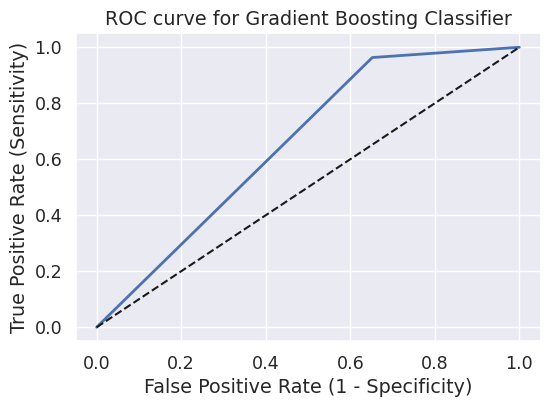

In [396]:
fpr, tpr, thresholds = roc_curve(y1_test, gbc_prediction)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve for Gradient Boosting Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

In [397]:
auroc_gbc = roc_auc_score(y1_test, gbc_prediction)
print('AUROC =', auroc_gbc)

AUROC = 0.6555508066239532


#### Sprawdzenie bias-variance tradeoff - czyli czy model jest zbyt słabo a może nadmiernie dopasowany? 
- Pomocny może być kod z zajęć do generowania "learning_curves"

In [398]:
## żródło: http://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
  
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

In [399]:
# Shuffle for learning curves
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=0)

<Figure size 2000x1400 with 0 Axes>

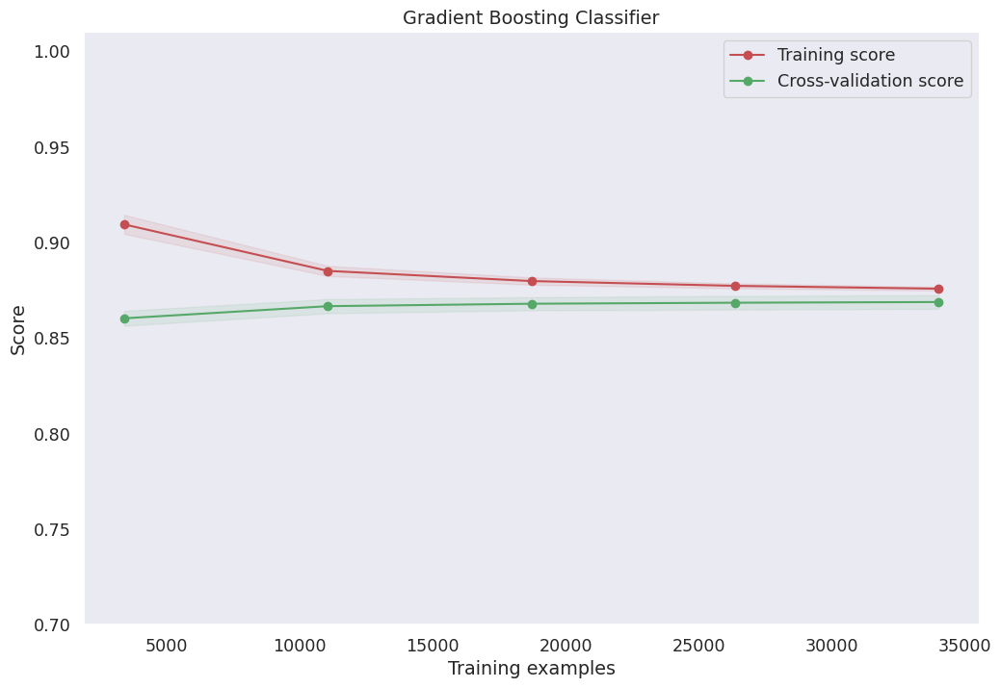

In [400]:
gbc= GradientBoostingClassifier(random_state=0, subsample=0.5)
plt.figure(figsize=(20,14))
plot_learning_curve(gbc, 'Gradient Boosting Classifier', X1, y1, (0.7, 1.01), cv=cv, n_jobs=4)
plt.show()

Krzywa ``Training score`` i krzywa ``Cross-validation score``, nie są rozbieżne od siebie. To znaczy że mój model jest w dobrej kondycji. Taki błąd jest akceptowalny.

#### Feature Importance -> property feature_importances_
##### Sprawdzenie istotnych cech - to znaczy na podstawie jakich cech model podejmuje decyzję i czy waszym zdaniem ma to sens?

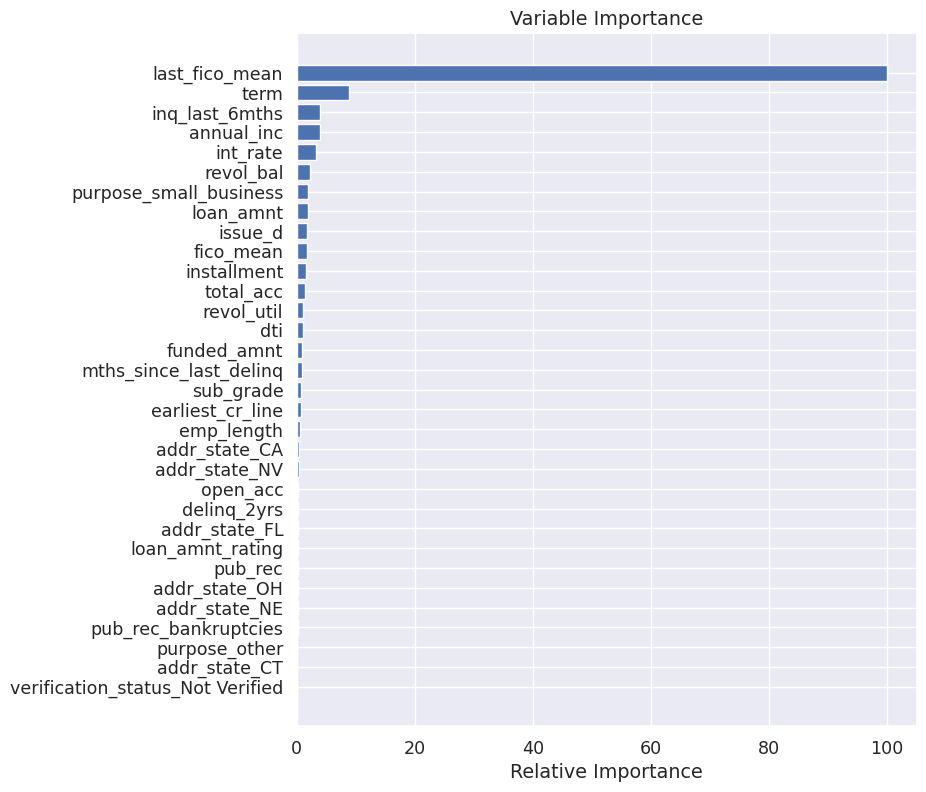

In [401]:
gbc= GradientBoostingClassifier(random_state=0, subsample=0.5)
gbc.fit(X1_train, y1_train)
# Plot feature importance https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html#sklearn.svm.SVR
feature_importance = gbc.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
sorted_idx_last_12 = sorted_idx[65:97]
pos = np.arange(sorted_idx_last_12.shape[0]) + .5
# plt.subplot(1, 2, 2)
plt.figure(figsize=(8, 9))
plt.barh(pos, feature_importance[sorted_idx_last_12], align='center')
plt.yticks(pos, X1_train.keys()[sorted_idx_last_12])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

In [402]:
# summarize feature importance
for i, v in enumerate(feature_importance):
    print(X1_train.keys()[i] + ': %0d, Score: %.5f' % (i,v))

loan_amnt: 0, Score: 1.99685
funded_amnt: 1, Score: 0.99951
term: 2, Score: 8.82353
int_rate: 3, Score: 3.20814
installment: 4, Score: 1.67137
sub_grade: 5, Score: 0.78682
emp_length: 6, Score: 0.51963
annual_inc: 7, Score: 3.95359
issue_d: 8, Score: 1.75050
dti: 9, Score: 1.01448
delinq_2yrs: 10, Score: 0.27403
earliest_cr_line: 11, Score: 0.69020
inq_last_6mths: 12, Score: 3.97414
mths_since_last_delinq: 13, Score: 0.94349
open_acc: 14, Score: 0.29565
pub_rec: 15, Score: 0.18546
revol_bal: 16, Score: 2.20917
revol_util: 17, Score: 1.07551
total_acc: 18, Score: 1.37782
pub_rec_bankruptcies: 19, Score: 0.16017
fico_mean: 20, Score: 1.70320
last_fico_mean: 21, Score: 100.00000
fico_rating: 22, Score: 0.05366
loan_amnt_rating: 23, Score: 0.19744
interest_rating: 24, Score: 0.00000
home_ownership_MORTGAGE: 25, Score: 0.08826
home_ownership_NONE: 26, Score: 0.00000
home_ownership_OTHER: 27, Score: 0.05902
home_ownership_OWN: 28, Score: 0.00000
home_ownership_RENT: 29, Score: 0.00001
verifi

#### Wnioski:
Wyniki sugerują, że być może 21 cech z 97 cech jest ważna dla przewidywania. Z czego 5 pierwszych cech ma największe znaczenie. Można zauważyć że jedna cecha z tych 97 cech, wyróżnia się najbardziej tj.: średni zakres graniczny ``last_fico_mean``, do którego należy ostatni wyciągnięty FICO kredytobiorcy. Inne cechy, takie, jak: liczba spłat pożyczki ``term`` (wartości są w miesiącach i mogą wynosić 36 lub 60), czy liczba zapytań ``inq_last_6mths`` w ciągu ostatnich 6 miesięcy (w tym zapytania dotyczące samochodów i kredytów hipotecznych). Mają conajmniej dziesięciokrotnie mniejszy wpływ przy podejmowaniu decyzji przez model. Co moim zdaniem znacznie upraszcza nam analizę i nie ma sensu. Ponieważ z 97 cech ograniczamy nasz wybór do jednej, dwóch bądź pięciu najstotniejszych cech. Co może powodować błędy w przewidywaniu, czy udzielić pożyczki, czy nie, kredytobiorcy.

#### SMOTE for Balancing Data

In [403]:
df_result = pd.DataFrame(columns=['model', 'tp', 'tn', 'fp', 'fn', 'correct', 'incorrect',
                                  'accuracy', 'precision', 'recall', 'f1', 'roc_auc','avg_pre'])

tn, fp, fn, tp = confusion_matrix(y1_test, gbc_prediction).ravel()
accuracy = accuracy_score(y1_test, gbc_prediction)
precision = precision_score(y1_test, gbc_prediction)
recall = recall_score(y1_test, gbc_prediction)
f1 = f1_score(y1_test, gbc_prediction)
roc_auc = roc_auc_score(y1_test, gbc_prediction)
avg_precision = average_precision_score(y1_test, gbc_prediction)

row = {'model': 'GradientBoostingClassifier without SMOTE',
        'tp': tp,
        'tn': tn,
        'fp': fp,
        'fn': fn,
        'correct': tp+tn,
        'incorrect': fp+fn,
        'accuracy': round(accuracy,3),
        'precision': round(precision,3),
        'recall': round(recall,3),
        'f1': round(f1,3),
        'roc_auc': round(roc_auc,3),
        'avg_pre': round(avg_precision,3),
    }

df_result = df_result.append(row, ignore_index=True)
df_result.head()

,model,tp,tn,fp,fn,correct,incorrect,accuracy,precision,recall,f1,roc_auc,avg_pre
0,GradientBoostingClassifier without SMOTE,10387,688,1290,396,11075,1686,0.868,0.89,0.963,0.925,0.656,0.888


Text(0.5, 1.0, 'Precision-Recall curve: ~0.8879')

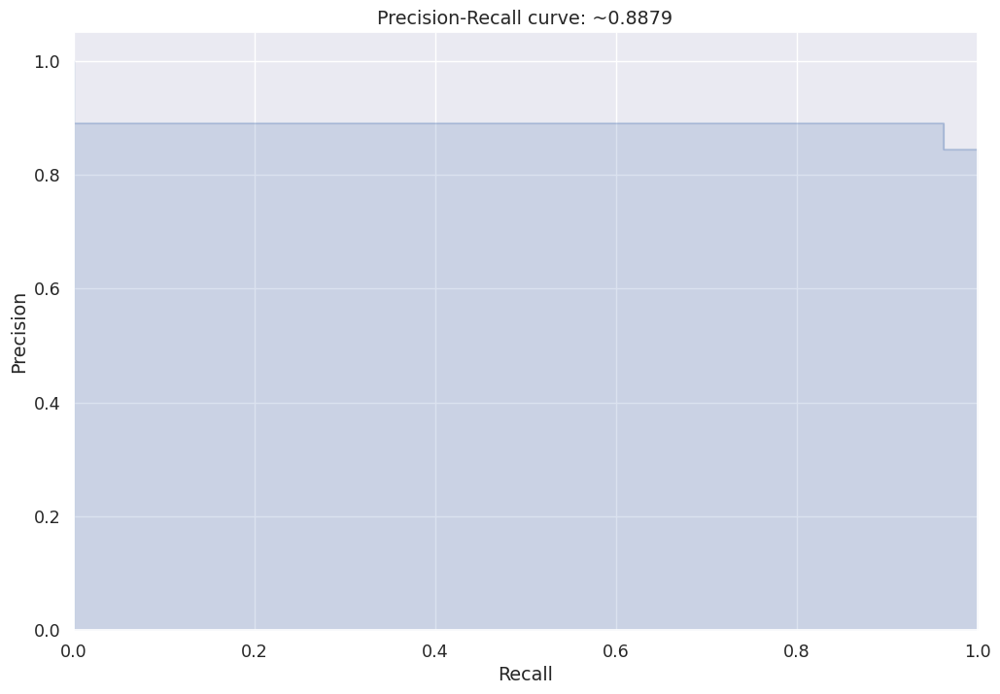

In [404]:
avg_precision = average_precision_score(y1_test, gbc_prediction)
precision, recall, _ = precision_recall_curve(y1_test, gbc_prediction)

plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve: ~{0:0.4f}'.format(avg_precision))

#### Fit a model using SMOTE

In [405]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=0, shuffle=True, 
                                                        stratify=y1)

In [406]:
oversampled = SMOTE(random_state=0)
X1_train_smote, y1_train_smote = oversampled.fit_resample(X1_train, y1_train)

In [407]:
y1_train_smote.value_counts()

1    25272
0    25272
Name: loan_status, dtype: int64

In [408]:
classifier = GradientBoostingClassifier(random_state=0, subsample=0.5)
model = classifier.fit(X1_train_smote, y1_train_smote)

In [409]:
y1_pred_smote = model.predict(X1_test)

In [410]:
y1_pred_smote.mean()

0.848366115508189

In [411]:
y1_test.mean()

0.8488362980957606

In [412]:
tn, fp, fn, tp = confusion_matrix(y1_test, y1_pred_smote).ravel()
accuracy = accuracy_score(y1_test, y1_pred_smote)
precision = precision_score(y1_test, y1_pred_smote)
recall = recall_score(y1_test, y1_pred_smote)
f1 = f1_score(y1_test, y1_pred_smote)
roc_auc = roc_auc_score(y1_test, y1_pred_smote)
avg_precision = average_precision_score(y1_test, y1_pred_smote)

row = {'model': 'GradientBoostingClassifier with SMOTE',
        'tp': tp,
        'tn': tn,
        'fp': fp,
        'fn': fn,
        'correct': tp+tn,
        'incorrect': fp+fn,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc,
        'avg_pre': round(avg_precision,3),       
    }

In [413]:
df_result = df_result.append(row, ignore_index=True)
df_result.head()

,model,tp,tn,fp,fn,correct,incorrect,accuracy,precision,recall,f1,roc_auc,avg_pre
0,GradientBoostingClassifier without SMOTE,10387,688,1290,396,11075,1686,0.868000,0.890000,0.963000,0.925000,0.656000,0.888
1,GradientBoostingClassifier with SMOTE,9828,931,998,1004,10759,2002,0.843116,0.907815,0.907312,0.907563,0.694973,0.902


In [414]:
counter = Counter(y1_train_smote)
print(counter)

Counter({1: 25272, 0: 25272})


Text(0.5, 1.0, 'Precision-Recall curve: ~0.9023')

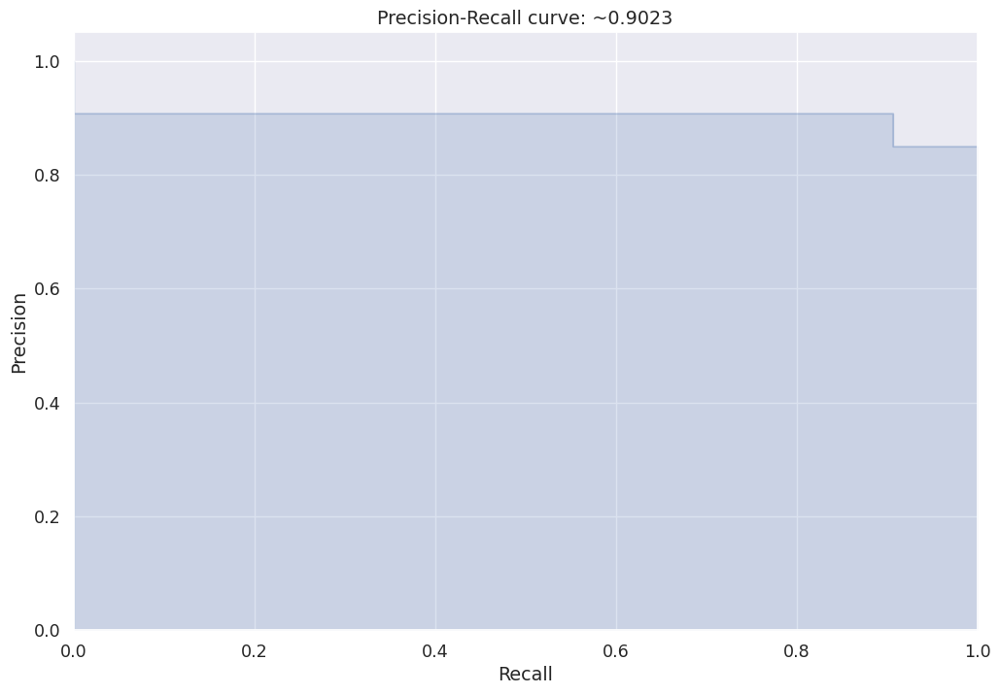

In [415]:
avg_precision = average_precision_score(y1_test, y1_pred_smote)
precision, recall, _ = precision_recall_curve(y1_test, y1_pred_smote)

plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve: ~{0:0.4f}'.format(avg_precision))

In [422]:
learning_rate = np.arange(.001, .1, .01)
# [0.001, 0.01, 0.02, 0.03]

for c in learning_rate:
    classifier = GradientBoostingClassifier(learning_rate=c, random_state=0, subsample=0.5)
    model = classifier.fit(X1_train_smote, y1_train_smote)
    y1_pred_smote = model.predict(X1_test)
    roc_auc = roc_auc_score(y1_test, y1_pred_smote)
    print('dla c = {0:0.3f};'.format(c), 'roc_auc = {0:0.2f}%'.format(roc_auc))

dla c = 0.001; roc_auc = 0.79%
dla c = 0.011; roc_auc = 0.78%
dla c = 0.021; roc_auc = 0.77%
dla c = 0.031; roc_auc = 0.76%
dla c = 0.041; roc_auc = 0.74%
dla c = 0.051; roc_auc = 0.73%
dla c = 0.061; roc_auc = 0.73%
dla c = 0.071; roc_auc = 0.71%
dla c = 0.081; roc_auc = 0.71%
dla c = 0.091; roc_auc = 0.70%


#### Zapisywanie modelu na dysku

In [423]:
# save the model to disk
gbc_final_model = 'finalized_model.sav'
pickle.dump(gbc, open(gbc_final_model, 'wb'))

### Podsumowanie
Przed SMOTE, AUROC wynosił ok.: 66%. Natomiast po SMOTE, AUROC wynosi ok. 70%. Co spowodowało niewielki jego wzrost i jest na dobrym poziomie dlatego, że taki mam model i tak są ustawione parametry. Inne metryki są zdecydowanie na wyższym poziomie od ok. 84% do ok. 91%. Powyższa wartość AUROC i innych parametrów są dla domyślnego ``learning_rate``. Na podstawie tych danych osiągam AUROC score na poziomie ok. 70%.

Następnie na tym modelu po wykonaniu SMOTE, liczę wartość AUROC dla zmiennego ``learning_rate`` od 0.001 do 0.1, co krok równy = 0.01. Zauważam, że dla PARAMETRU ``learning_rate`` = 0.001 powoduje to wzrost AUROC do 79%, co daje przewidywalność modelu prawie na poziomie ok. 80%. Im wyższy parametr ``learning_rate``, tym niższy AUROC.

#### UWAGA!!!
Do finalnej analizy wybrałem model ``Gradient Boosting Classifier``. Był to model o najniższym AUROC = 0.526600. Prawdopodobnie, gdybym wybrał model ``Bagging Classifier``, którego AUROC = 0.674916. Bez problemu osiągnął bym AUROC >= 80%. Należało by to przeanalizować. Niestety z braku czasu, nie mam takiej możliwości. 

##### FINALNY MODEL TO: ``Gradient Boosting Classifier``, KTÓREGO AUROC = ~80%.

#### No. | Method | AUROC
- 6	| Bagging Classifier | 0.674916
- 9	| XGB Classifier | 0.648401
- 7	| ADA Boost Classifier | 0.639060
- 2	| Decision Tree | 0.636387
- 0	| Logistic Regression | 0.602105
- 1	| Logistic Regression parameters | 0.602105
- 5	| KNN	| 0.591371
- 3	| Random Forest | 0.590393
- 4	| Support Vector Machine (SVM) | 0.535172
- 8	| Gradient Boosting Classifier | 0.526600

## Kraków dnia: 27.10.2022